Project Name:- Forecasting System - Project Demand of Products at a Retail Outlet Based on Historical Data.

Project Aim:- To get best model for this time series data to predict future data.



Objective:- To Forecast Demand of Products at a Retail Outlet Based on Historical Data.

Approach:- The dataset is above 9L-rows data, so the dataset is seprated in monthly storewise data and saved storewise. Next we finding the best model to forecast the future values by compairing its RSME values for each model.

Dataset Link:- https://www.kaggle.com/competitions/demand-forecasting-kernels-only/data

Dataset Overview-
The 5-year data of a store chain includes information on 10 different stores and 50 different products. The data set covers the period between 01-01-2013 and 31-12-2017. Business Problem It is desired to create a 3-month demand forecast model for 10 different stores and 50 different products of a store chain. Then, the data set is reduced to a weekly basis and a demand forecast model is created for 2017.






#Day 1


Variables


date – Date of sales data No holiday effects or store closures.

store – Store ID Unique number for each store.

item – Product ID Unique number for each product.

sales – Number of products sold, Number of products sold from a specific store on a specific date

In [ ]:
#First importing all necessarys labraries

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import plotly.express as px
import seaborn as sns
import lightgbm as lgb
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
import itertools

import warnings
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 500)
warnings.filterwarnings('ignore')

In [ ]:
#load the dataset

In [ ]:
train=pd.read_csv("/content/drive/MyDrive/Forecasting/train.csv")
test=pd.read_csv("/content/drive/MyDrive/Forecasting/test.csv")


In [ ]:
#converting Format of date column
test['date']=pd.to_datetime(test['date'])
test.dtypes


id                int64
date     datetime64[ns]
store             int64
item              int64
dtype: object

In [ ]:
#converting Format of date column
train['date']=pd.to_datetime(train['date'])
train.dtypes

date     datetime64[ns]
store             int64
item              int64
sales             int64
dtype: object

In [ ]:
#Checcking shape of Train and test data set

In [ ]:
test.shape

(45000, 4)

In [ ]:
train.shape

(913000, 4)

In [ ]:
train.date.unique

<bound method Series.unique of 0        2013-01-01
1        2013-01-02
2        2013-01-03
3        2013-01-04
4        2013-01-05
            ...    
912995   2017-12-27
912996   2017-12-28
912997   2017-12-29
912998   2017-12-30
912999   2017-12-31
Name: date, Length: 913000, dtype: datetime64[ns]>

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    913000 non-null  datetime64[ns]
 1   store   913000 non-null  int64         
 2   item    913000 non-null  int64         
 3   sales   913000 non-null  int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 27.9 MB


In [ ]:

train.isnull().sum() #Checking the null values.

date     0
store    0
item     0
sales    0
dtype: int64

In [ ]:
train.describe() # check min,max,etc.

,store,item,sales
count,913000.000000,913000.000000,913000.000000
mean,5.500000,25.500000,52.250287
std,2.872283,14.430878,28.801144
min,1.000000,1.000000,0.000000
25%,3.000000,13.000000,30.000000
50%,5.500000,25.500000,47.000000
75%,8.000000,38.000000,70.000000
max,10.000000,50.000000,231.000000


In [ ]:
daily_sales = train.groupby('date', as_index=False)['sales'].sum()
store_daily_sales = train.groupby(['store', 'date'], as_index=False)['sales'].sum()
item_daily_sales = train.groupby(['item', 'date'], as_index=False)['sales'].sum()

In [ ]:
daily_sales.describe()

,sales
count,1826.000000
mean,26125.143483
std,6418.270181
min,11709.000000
25%,21195.000000
50%,25839.500000
75%,30779.500000
max,44936.000000


In [ ]:
store_daily_sales.describe()

,store,sales
count,18260.00000,18260.000000
mean,5.50000,2612.514348
std,2.87236,833.578705
min,1.00000,790.000000
25%,3.00000,1983.000000
50%,5.50000,2515.000000
75%,8.00000,3170.000000
max,10.00000,5839.000000


In [ ]:
item_daily_sales.describe()

,item,sales
count,91300.000000,91300.000000
mean,25.500000,522.502870
std,14.430949,255.234706
min,1.000000,71.000000
25%,13.000000,310.000000
50%,25.500000,489.000000
75%,38.000000,695.000000
max,50.000000,1573.000000


In [ ]:
fig = px.line(daily_sales, x='date', y='sales',
              labels={'sales': 'Daily Sales', 'date': 'Date'},
              template='plotly_dark')  # You can also change the template for different themes

# Adding title and labels
fig.update_layout(title='Date-wise Sales',
                  xaxis_title='Date',
                  yaxis_title='Sales')

# Show the plot
fig.show()

Visually we can clearly say that there is some seasonality in the sales plot.


In [ ]:

fig = px.line(store_daily_sales, x='date', y='sales',color='store',
              labels={'sales': 'Daily Sales', 'date': 'Date'},
               template='plotly_dark')

# Add title and labels
fig.update_layout(title='Date-wise Sales',
                  xaxis_title='Date',
                  yaxis_title='Sales')

# Show the plot
fig.show()

In [ ]:
fig = px.line(item_daily_sales, x='date', y='sales',color='item',
              labels={'sales': 'Daily Sales', 'date': 'Date'},
              template='plotly_dark')

# Add title and labels
fig.update_layout(title='Date-wise Sales',
                  xaxis_title='Date',
                  yaxis_title='Sales')

# Show the plot
fig.show()

In [ ]:
# Assuming 'train' is the DataFrame containing your sales data

# Aggregating sales data by store
sumsales = train.groupby(["store"]).agg({"sales": ["sum", "mean", "median", "max", "min", "count"]})
print(sumsales)

# Visualizing store-wise average sales using a bar plot
import matplotlib.pyplot as plt
import seaborn as sns
colors = sns.color_palette('pastel')
plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
plt.title('Store wise Average sales')
sns.barplot(data=train, y='sales', x='store')
plt.xlabel('Store ID')
plt.ylabel('Average Sales')
plt.show()



1. Store 2 highest sale '231' and also highest average sales with '67'.

2. Store 6 has minimum sale '0' also store 7 has min. average sale '36'.    





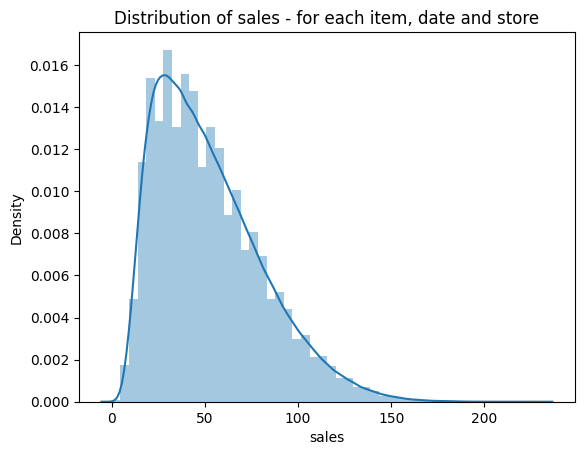

In [ ]:
plt.title("Distribution of sales - for each item, date and store")
ax = sns.distplot(train['sales'])

Understanding the shape of the histogram provides insights into the characteristics of the data distribution. In this case, a leptokurtic left-skewed distribution of sales might indicate that while most sales values are relatively high or clustered around a certain level, there are some instances or specific items where sales are significantly lower, causing the leftward skewness in the distribution.

In [ ]:
itemsales=train.groupby(["item"]).agg({"sales": ["sum","mean",'median',"max","min","count"]})
print(itemsales)

        sales                                  
          sum       mean median  max min  count
item                                           
1      401384  21.981599   21.0   59   1  18260
2     1069564  58.574151   56.0  150   9  18260
3      669087  36.642223   35.0  104   7  18260
4      401907  22.010241   21.0   66   0  18260
5      335230  18.358708   18.0   50   1  18260
6     1068281  58.503888   56.0  148  11  18260
7     1068777  58.531051   56.0  141  11  18260
8     1405108  76.950055   74.0  181  15  18260
9      938379  51.389869   49.5  134   6  18260
10    1337133  73.227437   70.0  175  14  18260
11    1271925  69.656353   67.0  170  11  18260
12    1271534  69.634940   67.0  170  12  18260
13    1539621  84.316594   81.0  210  20  18260
14    1071531  58.681873   56.0  152  12  18260
15    1607442  88.030778   85.0  231  17  18260
16     468480  25.656079   25.0   70   2  18260
17     602486  32.994852   32.0   83   4  18260
18    1538876  84.275794   81.0  208  18

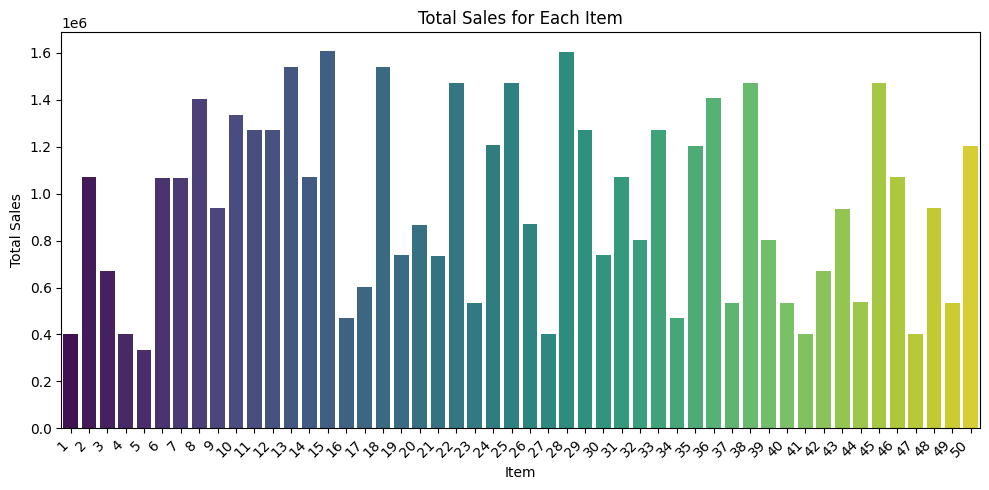

In [ ]:
#Now let's find how much total  sales occurred on each date in different stores
Item_wise_sales = train.groupby('item')['sales'].sum()
itemsale = pd.DataFrame({'Item': Item_wise_sales.index, 'Sales': Item_wise_sales.values})

# Sort the DataFrame by 'Sales' in descending order
itemsale = itemsale.sort_values(by='Sales', ascending=True)

plt.figure(figsize=(10, 5))  # Adjust the figure size as needed

# Create a bar plot using Seaborn for better aesthetics
sns.barplot(data=itemsale, x='Item', y='Sales', palette='viridis')

plt.title('Total Sales for Each Item')
plt.xlabel('Item')
plt.ylabel('Total Sales')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
#Feature engineering date column by creating additional columns related to time
def create_date_features(data):
    data['month'] = data.date.dt.month
    data['day_of_month'] = data.date.dt.day
    data['day_of_year'] = data.date.dt.dayofyear
    data['week_of_year'] = data.date.dt.weekofyear
    data['day_of_week'] = data.date.dt.dayofweek
    data['year'] = data.date.dt.year
    data["is_weekend"] = data.date.dt.weekday // 4
    data['is_month_start'] = data.date.dt.is_month_start.astype(int)
    data['is_month_end'] = data.date.dt.is_month_end.astype(int)
    return data

train = create_date_features(train)
create_date_features(train)

,date,store,item,sales,month,day_of_month,day_of_year,week_of_year,day_of_week,year,is_weekend,is_month_start,is_month_end
0,2013-01-01,1,1,13,1,1,1,1,1,2013,0,1,0
1,2013-01-02,1,1,11,1,2,2,1,2,2013,0,0,0
2,2013-01-03,1,1,14,1,3,3,1,3,2013,0,0,0
3,2013-01-04,1,1,13,1,4,4,1,4,2013,1,0,0
4,2013-01-05,1,1,10,1,5,5,1,5,2013,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
912995,2017-12-27,10,50,63,12,27,361,52,2,2017,0,0,0
912996,2017-12-28,10,50,59,12,28,362,52,3,2017,0,0,0
912997,2017-12-29,10,50,74,12,29,363,52,4,2017,1,0,0
912998,2017-12-30,10,50,62,12,30,364,52,5,2017,1,0,0


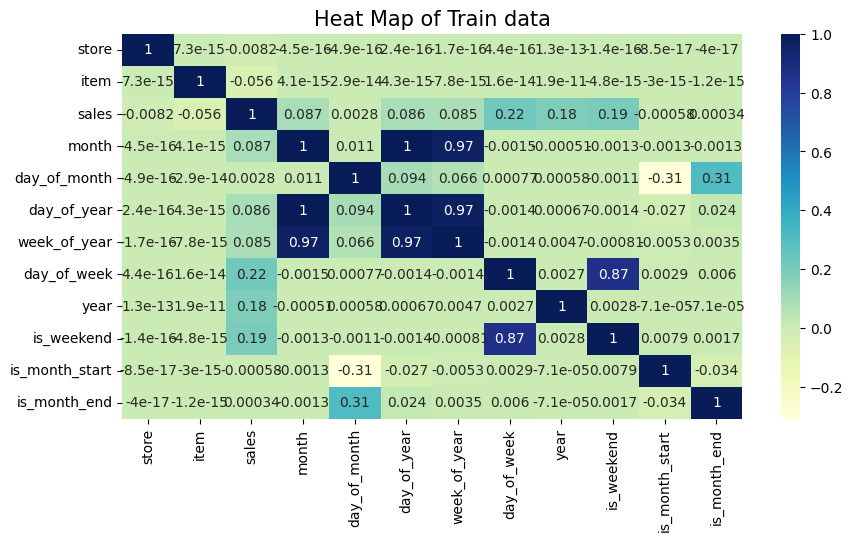

In [ ]:
plt.figure(figsize=(10,5))
plt.title('Heat Map of Train data',size=15)
sns.heatmap(train.corr(),annot=True,cmap='YlGnBu')
plt.show()

In [ ]:
year_sales = train.groupby('year')['sales'].sum().reset_index()
year_sales

,year,sales
0,2013,7941243
1,2014,9135482
2,2015,9536887
3,2016,10357160
4,2017,10733740


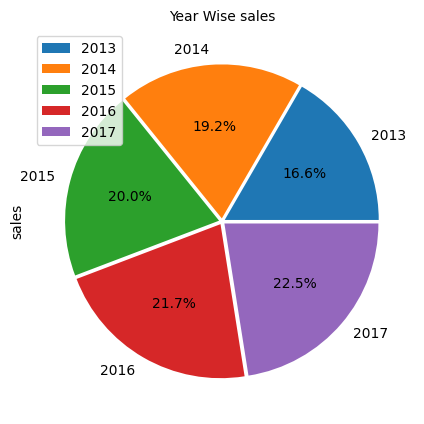

In [ ]:
plot = year_sales.plot.pie(x = 'year', y='sales',labels=year_sales['year'], autopct='%1.1f%%', figsize=(5,5),explode=[0.02]*5)
plt.title('Year Wise sales',fontsize=10)
plt.show()

In [ ]:
monthly_sales = train.groupby('month')['sales'].sum().reset_index()
monthly_sales

,month,sales
0,1,2753149
1,2,2776177
2,3,3666182
3,4,4136467
4,5,4582437
5,6,4726911
6,7,5192393
7,8,4580655
8,9,4130457
9,10,3967520


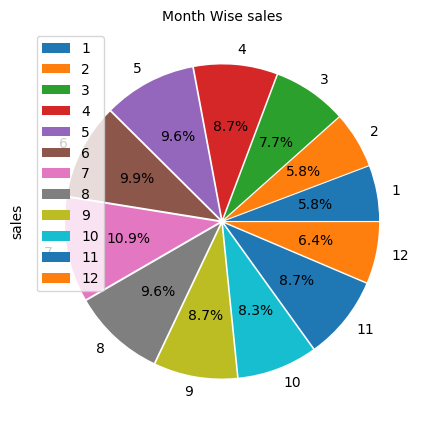

In [ ]:
plot = monthly_sales.plot.pie(x = 'month', y='sales',labels=monthly_sales['month'], autopct='%1.1f%%', figsize=(5, 5),explode=[0.02]*12)
plt.title('Month Wise sales',fontsize=10)
plt.show()

In [ ]:
# Now creating seprate datasets for each store
store_data= {}
for i in range(1, 11):
  if i==1:
    store1 = train.loc[train['store'] == i].sort_values('date').set_index('date')
  elif i==2:
    store2 = train.loc[train['store'] == i].sort_values('date').set_index('date')
  elif i==3:
    store3 = train.loc[train['store'] == i].sort_values('date').set_index('date')
  elif i==4:
    store4 = train.loc[train['store'] == i].sort_values('date').set_index('date')
  elif i==5:
    store5 = train.loc[train['store'] == i].sort_values('date').set_index('date')
  elif i==6:
    store6 = train.loc[train['store'] == i].sort_values('date').set_index('date')
  elif i==7:
    store7 = train.loc[train['store'] == i].sort_values('date').set_index('date')
  elif i==8:
    store8 = train.loc[train['store'] == i].sort_values('date').set_index('date')
  elif i==9:
    store9 = train.loc[train['store'] == i].sort_values('date').set_index('date')
  else :
    store10 = train.loc[train['store'] == i].sort_values('date').set_index('date')

In [ ]:
store_set=(store1,store2,store3,store4,store5,store6,store7,store8,store9,store10)

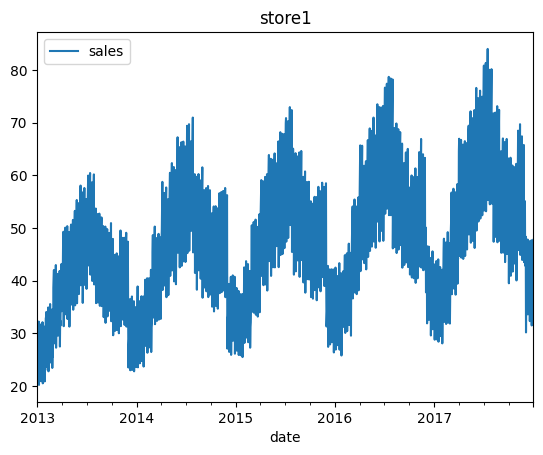

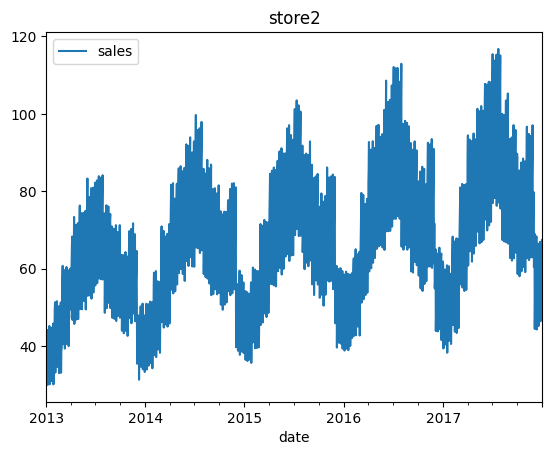

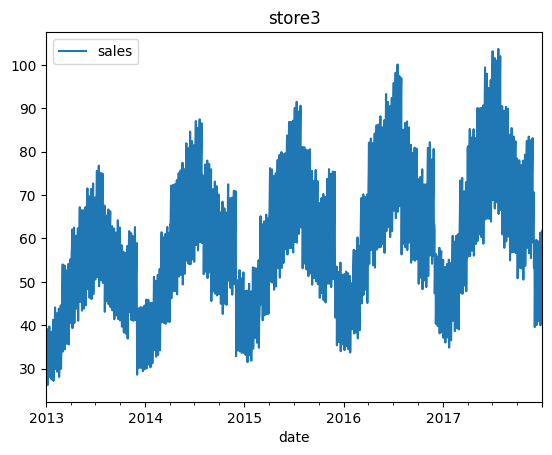

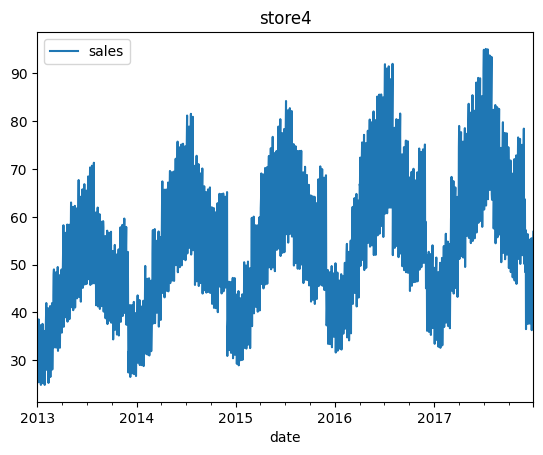

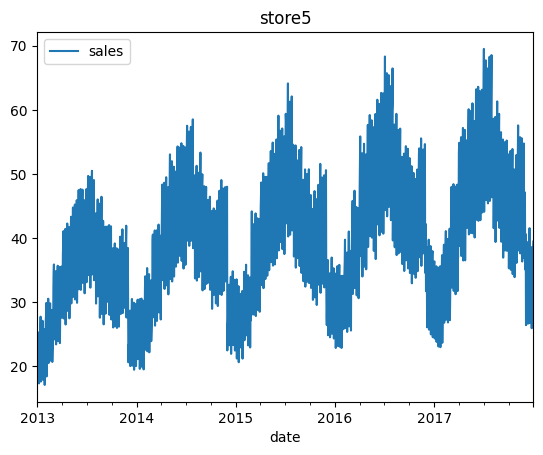

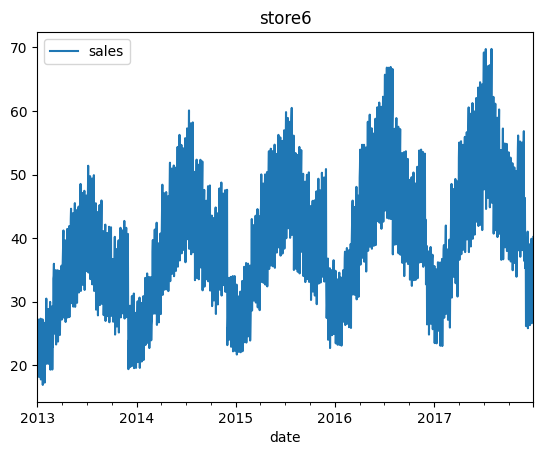

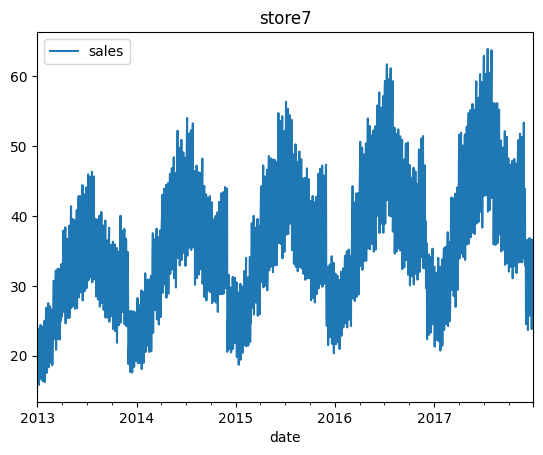

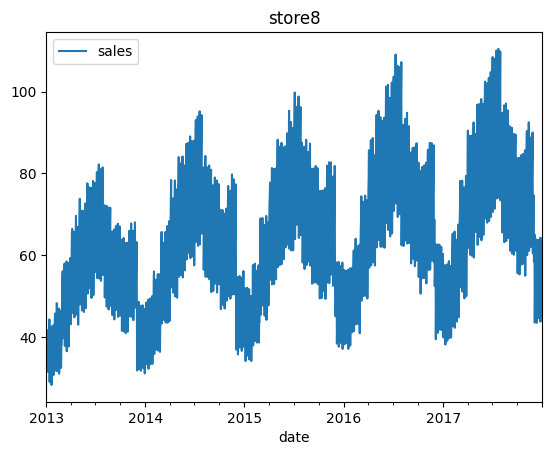

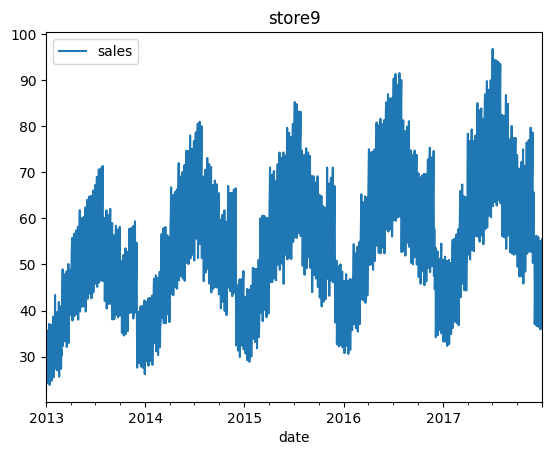

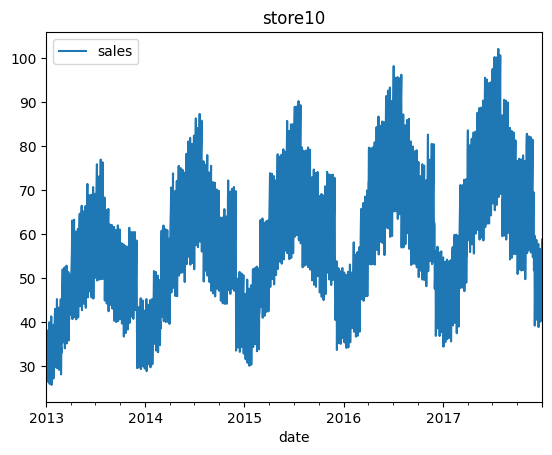

In [ ]:
for i in range(0,10):
  store_set[i][['sales']].groupby('date').mean().plot()


  plt.title(f'store{i+1}')

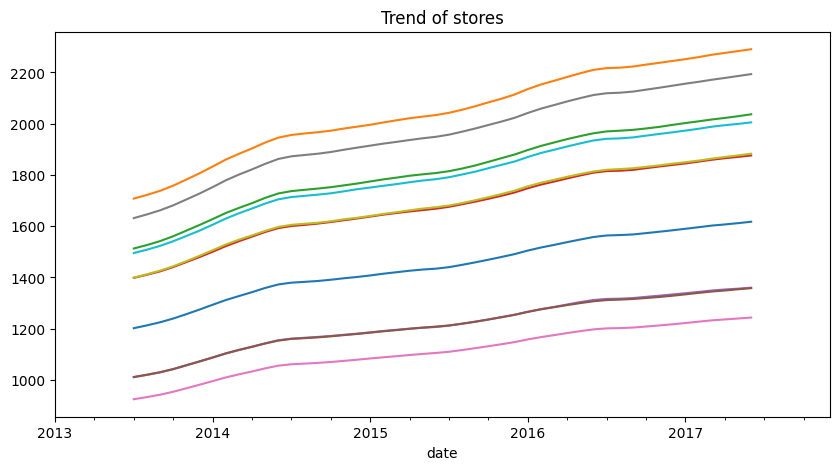

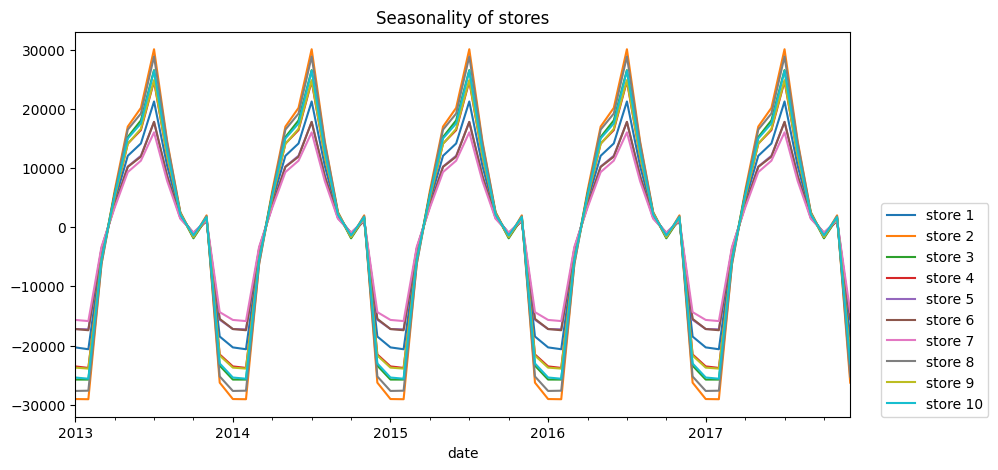

In [ ]:
# Plotting trends for each store
plt.title('Trend of stores')
for i in train['store'].unique():
    store_i = train.loc[train['store'] == i]
    store_i = store_i.groupby('date')['sales'].mean().reset_index()
    store_i = store_i.set_index('date')
    store_i = store_i['sales'].resample('M').sum()
    decomposition_store_i = sm.tsa.seasonal_decompose(store_i,model='additive')
    decomposition_store_i.trend.plot(figsize=(10,5))
plt.show()
plt.title('Seasonality of stores')
for i in train['store'].unique():
    store_i = train.loc[train['store'] == i]
    store_i = store_i.groupby('date')['sales'].sum().reset_index()
    store_i = store_i.set_index('date')
    store_i = store_i['sales'].resample('M').sum()
    decomposition_store_i = sm.tsa.seasonal_decompose(store_i,model='additive')
    decomposition_store_i.seasonal.plot(figsize=(10,5))


plt.legend(('store 1','store 2','store 3','store 4','store 5','store 6','store 7','store 8','store 9','store 10'),loc=(1.04, 0))
plt.show()

#Day 6

Lets Analysing sales by store on different periodic times.

Yearly sales of Store 1
count       5.000000
mean     2363.310435
std       271.874523
min      1966.684932
25%      2265.167123
50%      2360.849315
75%      2561.456284
max      2662.394521
Name: sales, dtype: float64


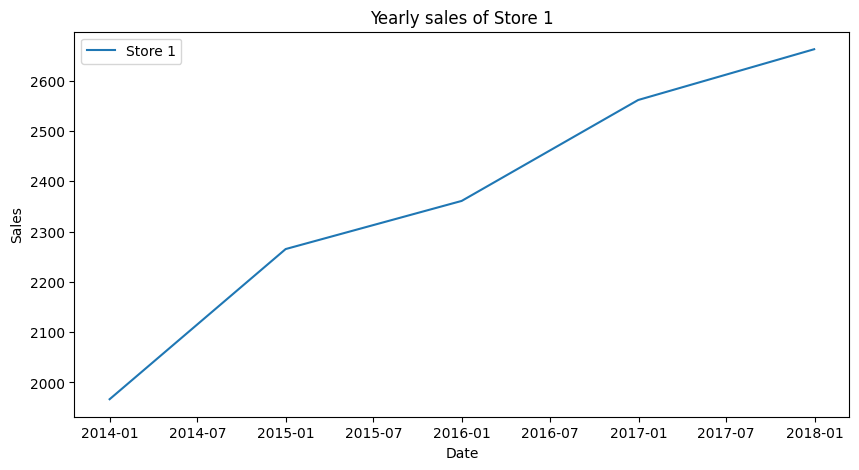

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Yearly sales of Store 2
count       5.000000
mean     3351.504342
std       382.209207
min      2795.172603
25%      3210.402740
50%      3348.449315
75%      3632.576503
max      3770.920548
Name: sales, dtype: float64


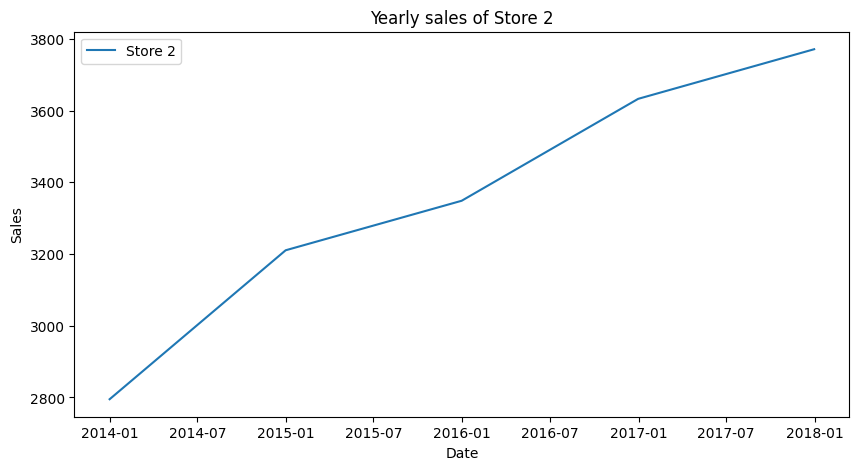

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Yearly sales of Store 3
count       5.000000
mean     2976.393570
std       342.746053
min      2476.536986
25%      2850.739726
50%      2975.624658
75%      3225.734973
max      3353.331507
Name: sales, dtype: float64


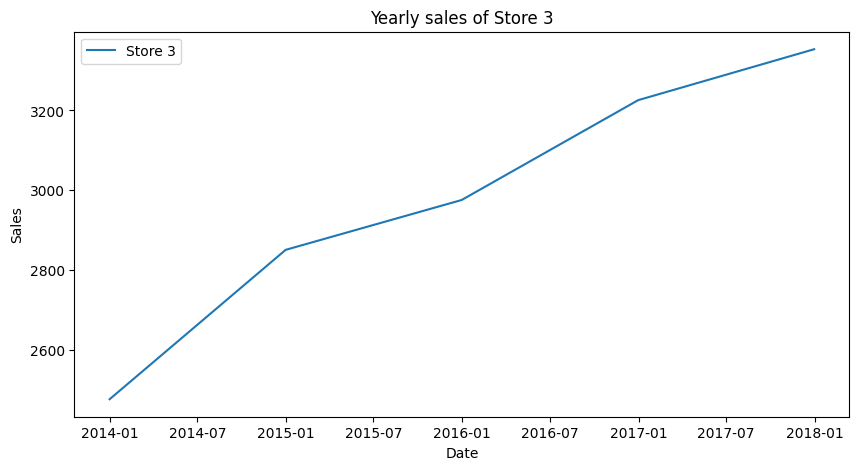

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Yearly sales of Store 4
count       5.000000
mean     2745.022350
std       313.470602
min      2287.832877
25%      2627.958904
50%      2747.205479
75%      2973.210383
max      3088.904110
Name: sales, dtype: float64


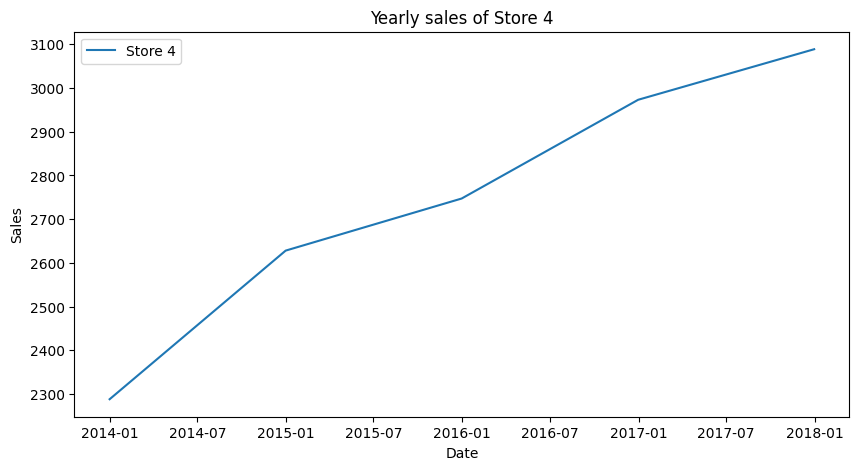

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Yearly sales of Store 5
count       5.000000
mean     1988.416176
std       228.735114
min      1654.200000
25%      1905.750685
50%      1987.238356
75%      2156.478142
max      2238.413699
Name: sales, dtype: float64


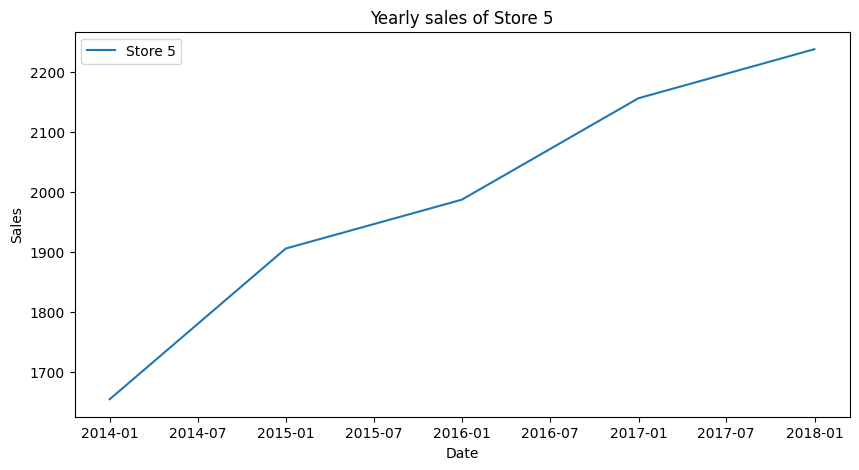

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Yearly sales of Store 6
count       5.000000
mean     1986.587201
std       225.900652
min      1655.816438
25%      1904.695890
50%      1988.813699
75%      2148.357923
max      2235.252055
Name: sales, dtype: float64


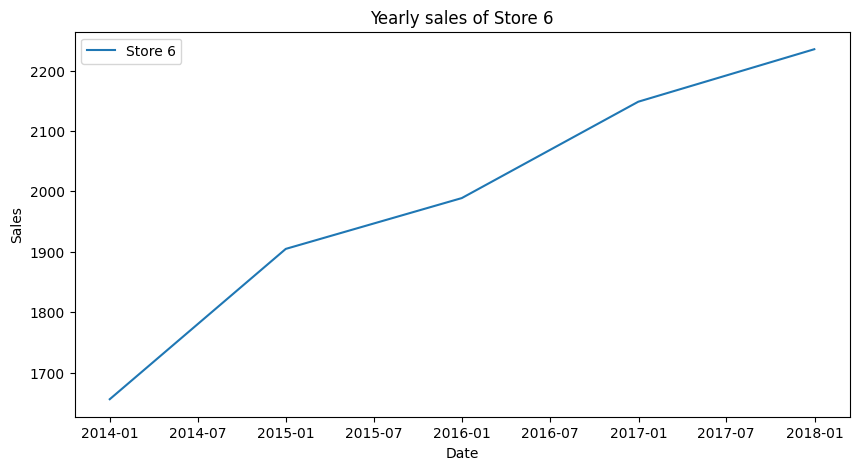

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Yearly sales of Store 7
count       5.000000
mean     1818.104517
std       208.448452
min      1512.939726
25%      1742.405479
50%      1819.909589
75%      1968.256831
max      2047.010959
Name: sales, dtype: float64


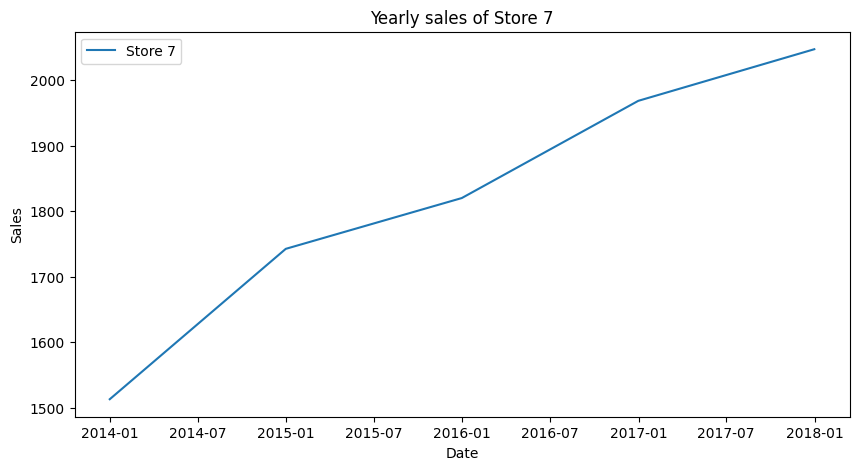

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Yearly sales of Store 8
count       5.000000
mean     3206.957346
std       367.043695
min      2670.287671
25%      3073.690411
50%      3208.345205
75%      3471.844262
max      3610.619178
Name: sales, dtype: float64


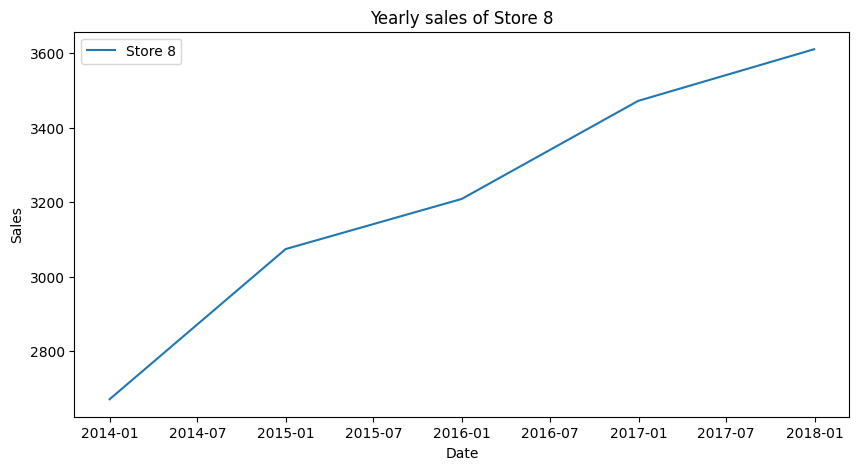

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Yearly sales of Store 9
count       5.000000
mean     2752.326349
std       316.500287
min      2289.830137
25%      2635.010959
50%      2756.221918
75%      2980.412568
max      3100.156164
Name: sales, dtype: float64


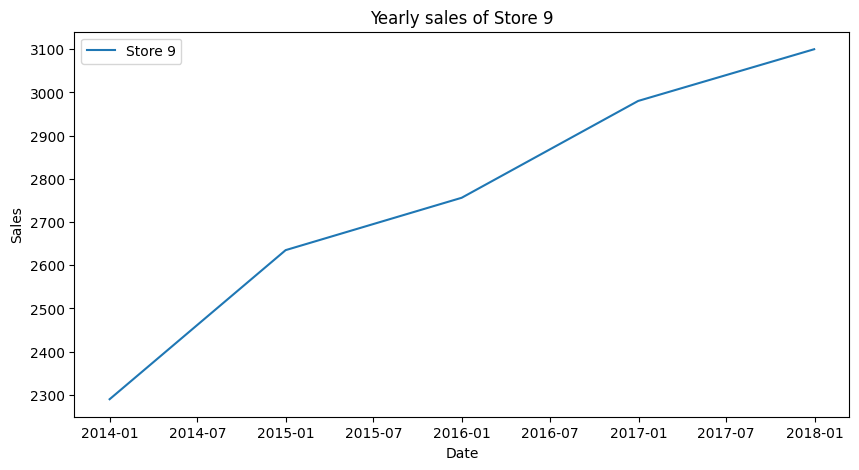

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Yearly sales of Store 10
count       5.000000
mean     2935.330453
std       333.960508
min      2447.528767
25%      2812.895890
50%      2935.800000
75%      3179.923497
max      3300.504110
Name: sales, dtype: float64


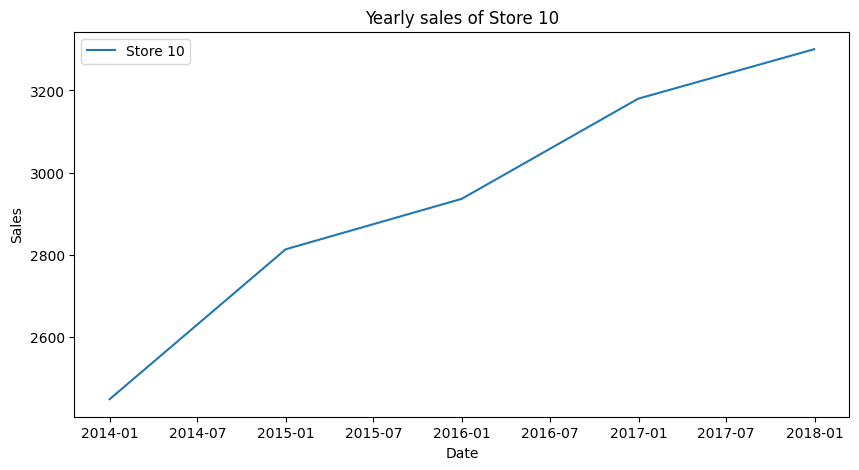

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-


In [ ]:
# On Yearly basis

for i in range(10):
    print(f'Yearly sales of Store {i+1}')
    store_mon = store_set[i].groupby('date')['sales'].sum().reset_index().set_index('date')
    store_m = store_mon['sales'].resample('Y').mean()
    print(store_m.describe())

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(store_m.index, store_m.values, label=f'Store {i+1}')
    plt.title(f'Yearly sales of Store {i+1}')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.legend()
    plt.show()

    print('=O-'*50)

Quarterly sales of Store 1
count      20.000000
mean     2361.624379
std       452.016913
min      1535.666667
25%      2051.418590
50%      2331.195652
75%      2686.730889
max      3084.804348
Name: sales, dtype: float64


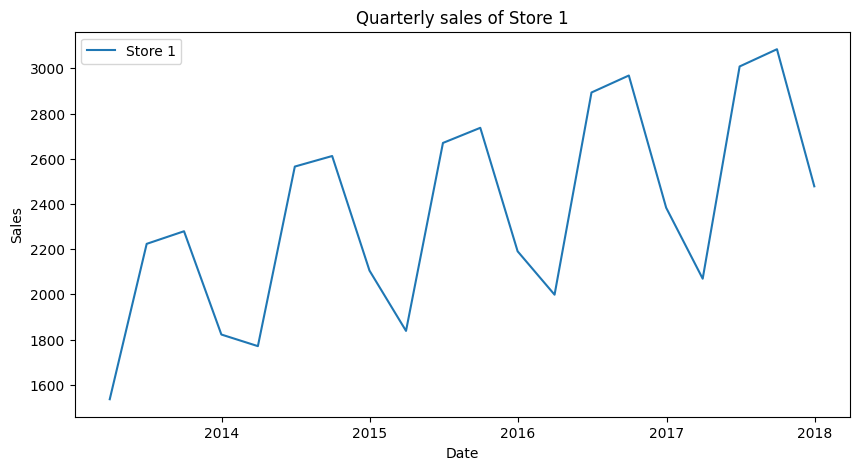

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Quarterly sales of Store 2
count      20.000000
mean     3349.134980
std       637.620337
min      2194.588889
25%      2911.087821
50%      3298.407609
75%      3808.888677
max      4369.630435
Name: sales, dtype: float64


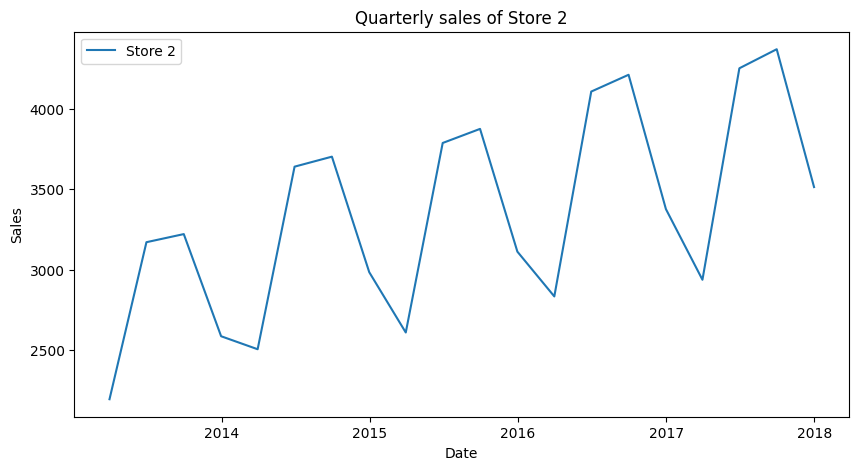

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Quarterly sales of Store 3
count      20.000000
mean     2974.306945
std       568.849740
min      1934.688889
25%      2592.779304
50%      2922.179348
75%      3383.596124
max      3875.347826
Name: sales, dtype: float64


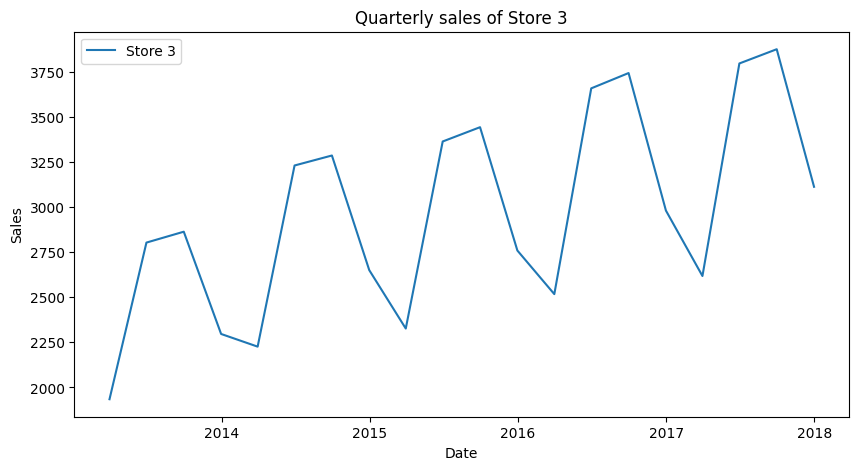

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Quarterly sales of Store 4
count      20.000000
mean     2743.083589
std       523.345154
min      1789.422222
25%      2383.435623
50%      2699.733696
75%      3124.297241
max      3583.934783
Name: sales, dtype: float64


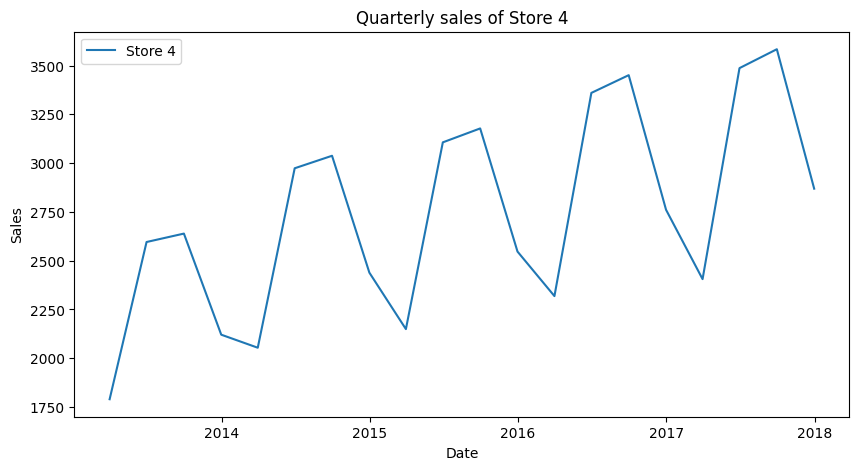

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Quarterly sales of Store 5
count      20.000000
mean     1987.011471
std       379.862861
min      1293.388889
25%      1728.930220
50%      1961.875000
75%      2259.860696
max      2594.000000
Name: sales, dtype: float64


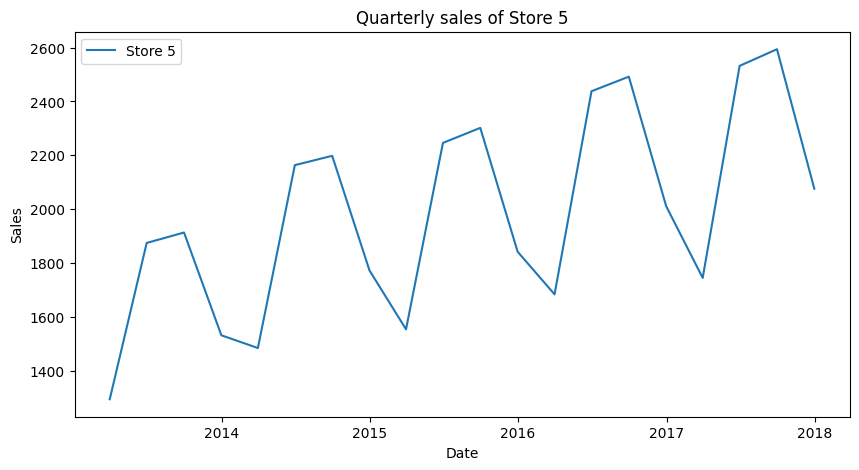

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Quarterly sales of Store 6
count      20.000000
mean     1985.181311
std       378.053966
min      1299.622222
25%      1722.298626
50%      1953.429348
75%      2258.401636
max      2592.228261
Name: sales, dtype: float64


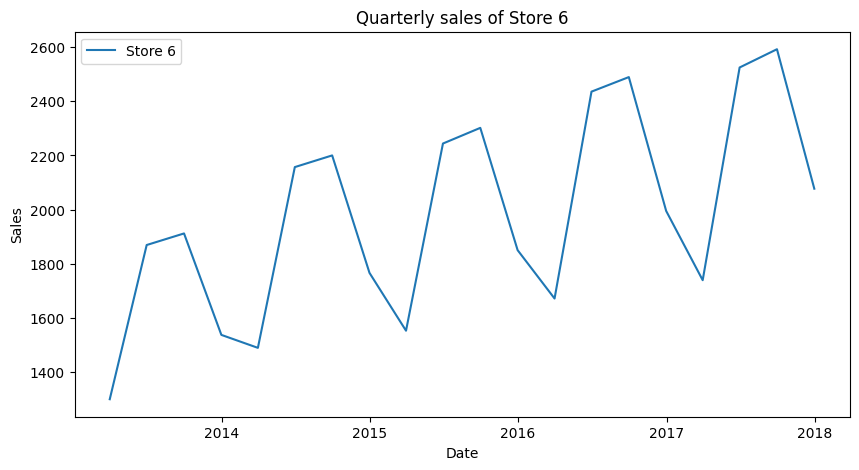

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Quarterly sales of Store 7
count      20.000000
mean     1816.824356
std       346.198504
min      1182.900000
25%      1578.025641
50%      1791.489130
75%      2071.686903
max      2369.445652
Name: sales, dtype: float64


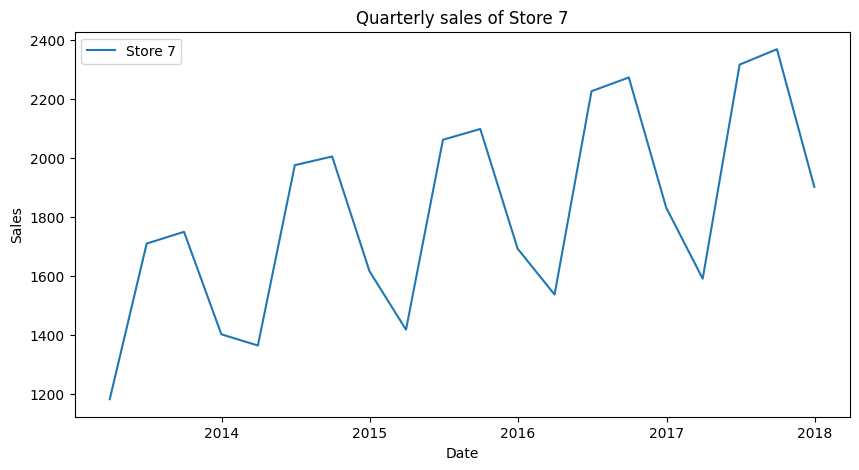

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Quarterly sales of Store 8
count      20.000000
mean     3204.683111
std       610.326211
min      2091.233333
25%      2786.909707
50%      3156.331522
75%      3649.463151
max      4169.130435
Name: sales, dtype: float64


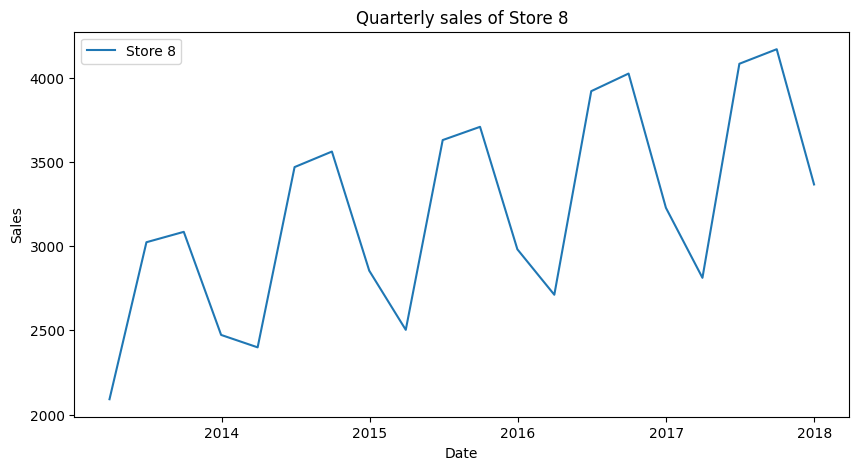

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Quarterly sales of Store 9
count      20.000000
mean     2750.369387
std       526.881351
min      1786.655556
25%      2391.355128
50%      2705.961957
75%      3133.769529
max      3589.402174
Name: sales, dtype: float64


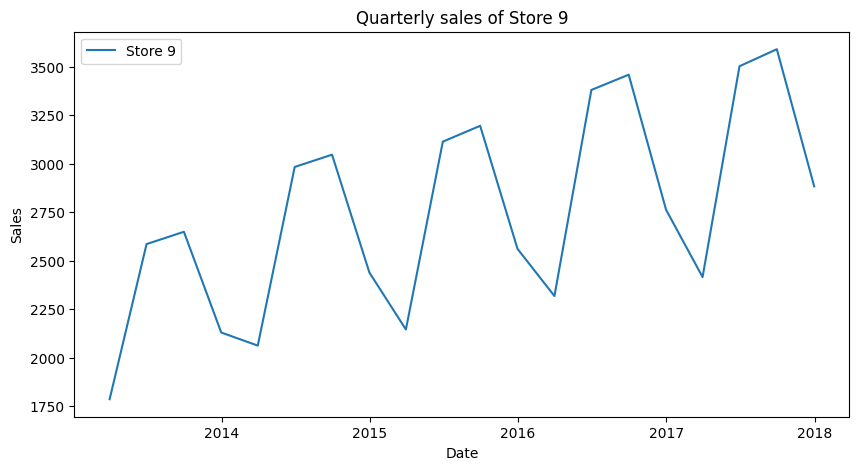

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Quarterly sales of Store 10
count      20.000000
mean     2933.244292
std       559.268784
min      1910.755556
25%      2548.853846
50%      2891.820652
75%      3338.999761
max      3827.065217
Name: sales, dtype: float64


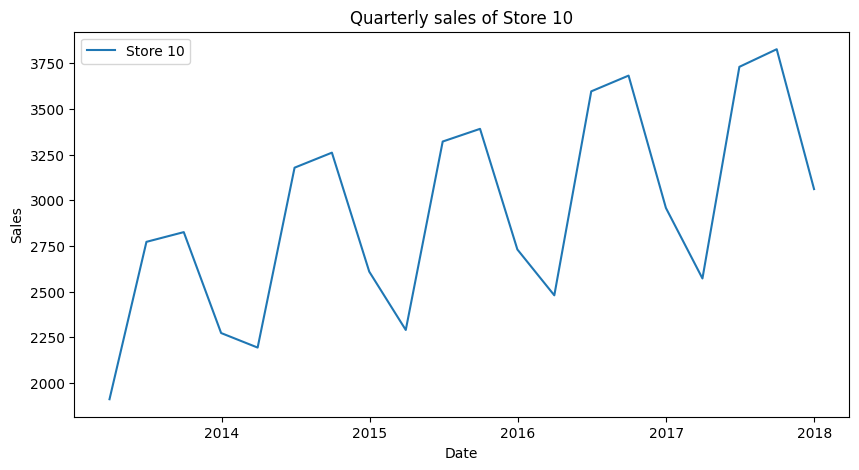

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-


In [ ]:
# On Quarterly basis


for i in range(10):
    print(f'Quarterly sales of Store {i+1}')
    store_mon = store_set[i].groupby('date')['sales'].sum().reset_index().set_index('date')
    store_m = store_mon['sales'].resample('Q').mean()
    print(store_m.describe())

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(store_m.index, store_m.values, label=f'Store {i+1}')
    plt.title(f'Quarterly sales of Store {i+1}')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.legend()
    plt.show()

    print('=O-'*50)


Monthly sales of Store 1
count      60.000000
mean     2361.273544
std       501.502401
min      1325.064516
25%      1988.479839
50%      2386.328495
75%      2723.891667
max      3425.387097
Name: sales, dtype: float64


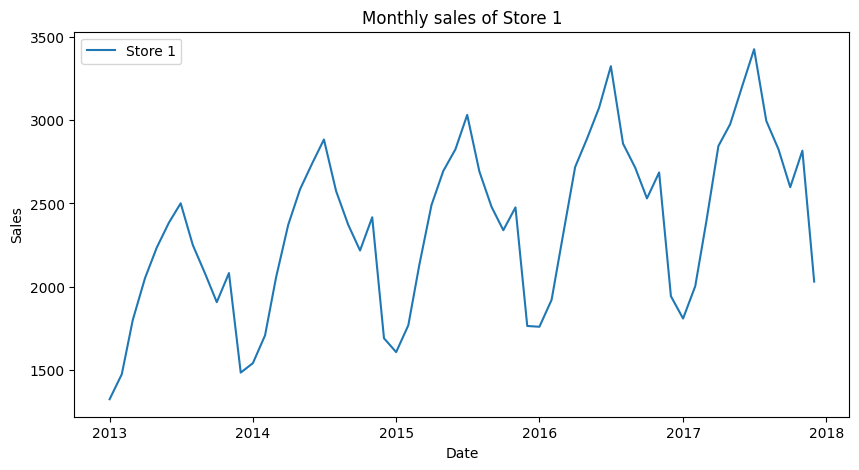

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Monthly sales of Store 2
count      60.000000
mean     3348.710188
std       709.343803
min      1887.741935
25%      2821.479839
50%      3413.649462
75%      3859.600000
max      4842.096774
Name: sales, dtype: float64


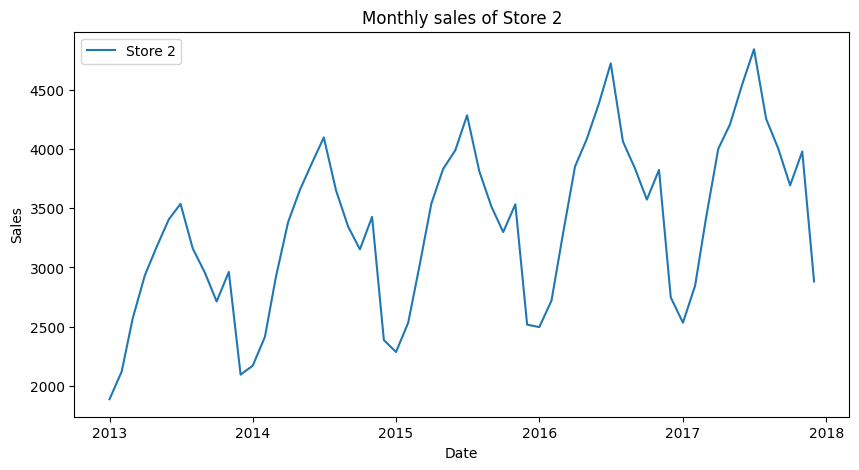

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Monthly sales of Store 3
count      60.000000
mean     2973.933238
std       631.037741
min      1676.516129
25%      2506.644873
50%      3024.805914
75%      3447.191667
max      4302.225806
Name: sales, dtype: float64


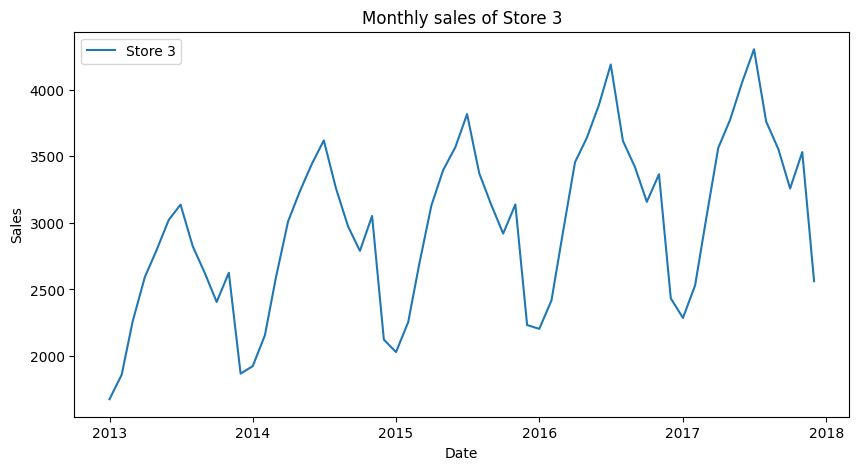

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Monthly sales of Store 4
count      60.000000
mean     2742.716923
std       580.465162
min      1539.354839
25%      2306.607431
50%      2789.683871
75%      3154.116667
max      3978.903226
Name: sales, dtype: float64


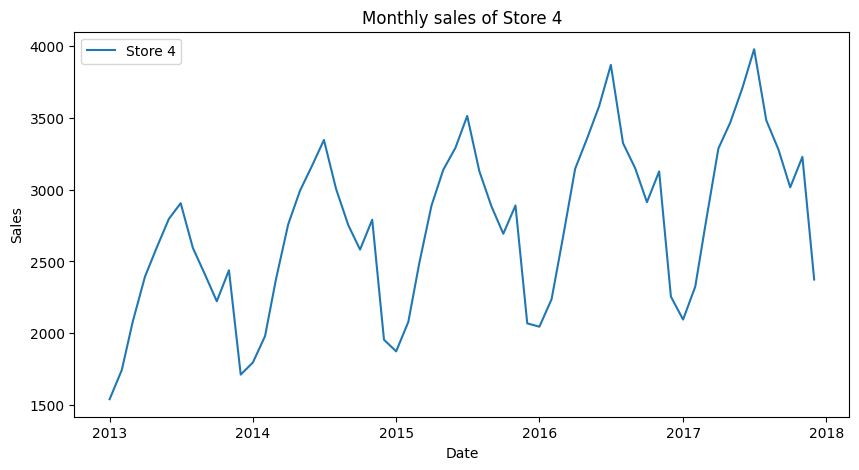

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Monthly sales of Store 5
count      60.000000
mean     1986.755238
std       422.468004
min      1109.838710
25%      1675.953629
50%      2026.480645
75%      2287.158333
max      2877.967742
Name: sales, dtype: float64


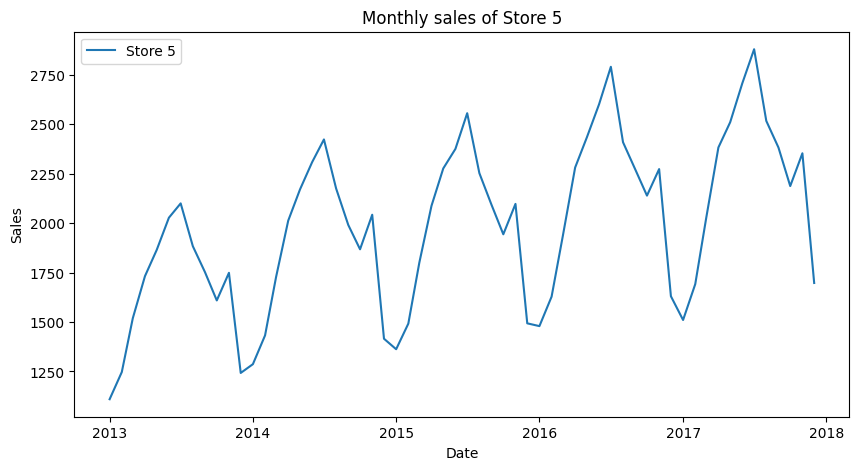

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Monthly sales of Store 6
count      60.000000
mean     1984.862785
std       420.843627
min      1127.225806
25%      1669.704493
50%      2017.133333
75%      2296.933333
max      2891.677419
Name: sales, dtype: float64


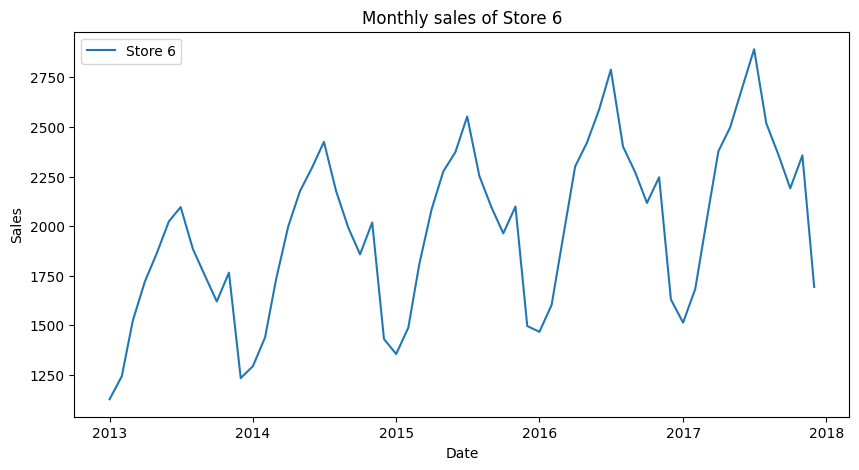

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Monthly sales of Store 7
count      60.000000
mean     1816.594157
std       385.460714
min      1016.387097
25%      1532.211406
50%      1843.890860
75%      2093.600000
max      2630.870968
Name: sales, dtype: float64


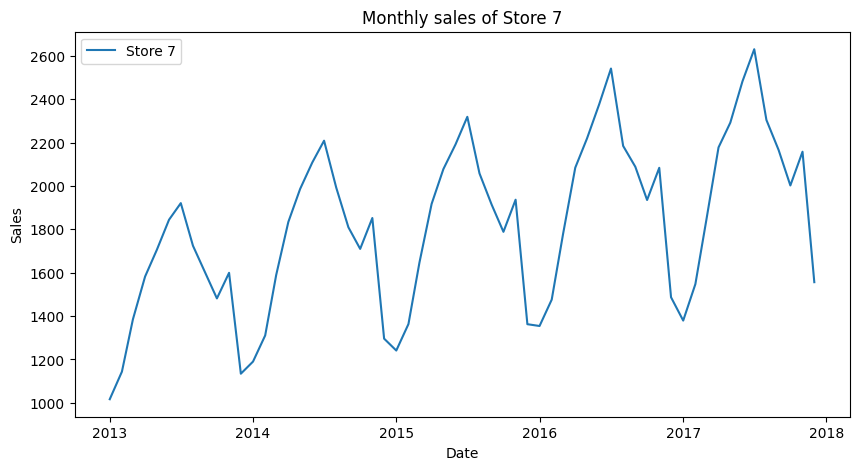

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Monthly sales of Store 8
count      60.000000
mean     3204.271554
std       678.799645
min      1807.838710
25%      2715.280242
50%      3256.514516
75%      3687.041667
max      4622.838710
Name: sales, dtype: float64


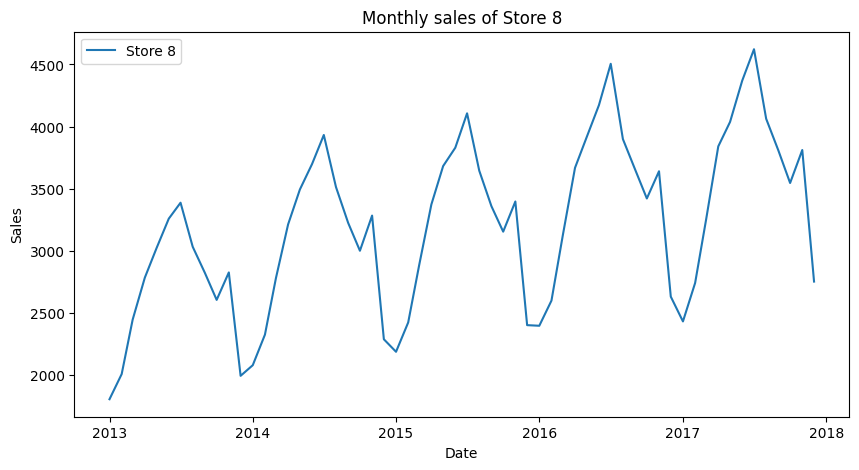

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Monthly sales of Store 9
count      60.000000
mean     2750.031890
std       584.799278
min      1536.129032
25%      2318.644585
50%      2781.752688
75%      3182.533333
max      3968.516129
Name: sales, dtype: float64


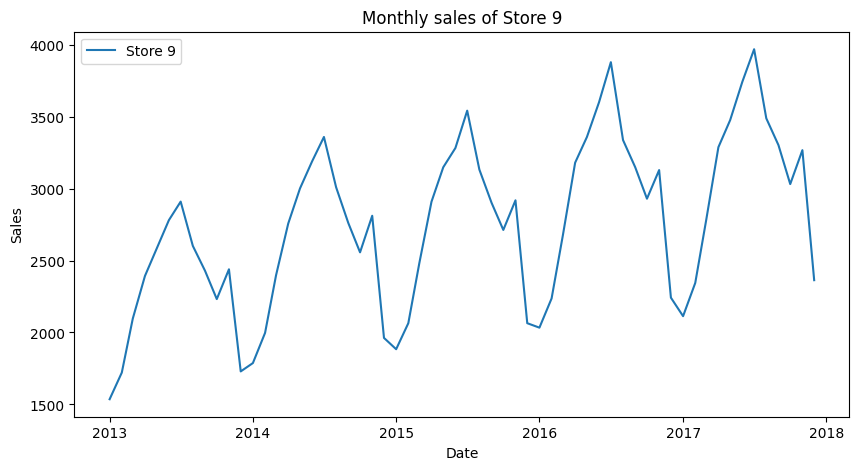

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-
Monthly sales of Store 10
count      60.000000
mean     2932.815615
std       621.961046
min      1648.225806
25%      2458.894873
50%      2982.666129
75%      3383.362366
max      4246.387097
Name: sales, dtype: float64


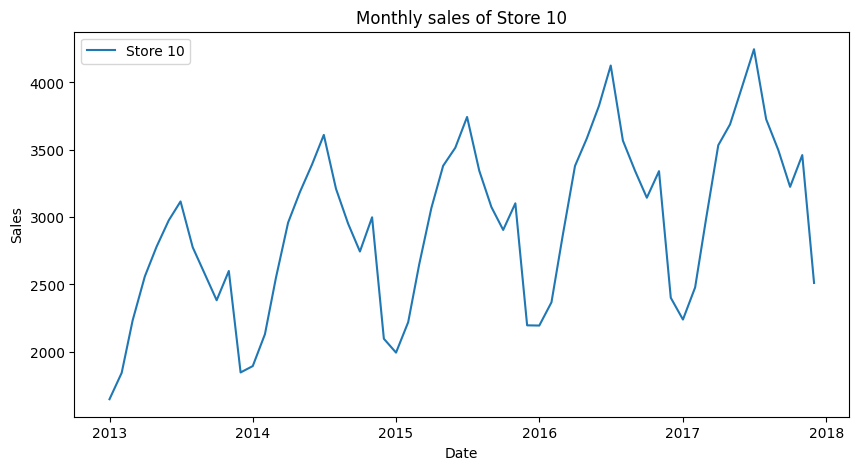

=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-=O-


In [ ]:
# On monthly basis

for i in range(10):
    print(f'Monthly sales of Store {i+1}')
    store_mon = store_set[i].groupby('date')['sales'].sum().reset_index().set_index('date')
    store_m = store_mon['sales'].resample('MS').mean()
    print(store_m.describe())

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(store_m.index, store_m.values, label=f'Store {i+1}')
    plt.title(f'Monthly sales of Store {i+1}')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.legend()
    plt.show()

    print('=O-'*50)

In [ ]:
for i in range(1, 11):
  if i==1:
    mstore1 = train.loc[train['store'] == i].groupby('date')['sales'].sum().reset_index().set_index('date').resample('MS').mean()
  elif i==2:
    mstore2 = train.loc[train['store'] == i].groupby('date')['sales'].sum().reset_index().set_index('date').resample('MS').mean()
  elif i==3:
    mstore3 = train.loc[train['store'] == i].groupby('date')['sales'].sum().reset_index().set_index('date').resample('MS').mean()
  elif i==4:
    mstore4 = train.loc[train['store'] == i].groupby('date')['sales'].sum().reset_index().set_index('date').resample('MS').mean()
  elif i==5:
    mstore5 = train.loc[train['store'] == i].groupby('date')['sales'].sum().reset_index().set_index('date').resample('MS').mean()
  elif i==6:
    mstore6 = train.loc[train['store'] == i].groupby('date')['sales'].sum().reset_index().set_index('date').resample('MS').mean()
  elif i==7:
    mstore7 = train.loc[train['store'] == i].groupby('date')['sales'].sum().reset_index().set_index('date').resample('MS').mean()
  elif i==8:
    mstore8 = train.loc[train['store'] == i].groupby('date')['sales'].sum().reset_index().set_index('date').resample('MS').mean()
  elif i==9:
    mstore9 = train.loc[train['store'] == i].groupby('date')['sales'].sum().reset_index().set_index('date').resample('MS').mean()
  else :
    mstore10 = train.loc[train['store'] == i].groupby('date')['sales'].sum().reset_index().set_index('date').resample('MS').mean()

In [ ]:
mstore_set=(mstore1,mstore2,mstore3,mstore4,mstore5,mstore6,mstore7,mstore8,mstore9,mstore10)

Now as a data created on the monthly basis ,let's check data statioanrity and more information about dataset

Data Stationarity Tests

1. Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [ ]:
from statsmodels.tsa.stattools import kpss
def kpss_test(data):
    print ('Results of KPSS Test:')
    kpsstest = kpss(data['sales'], regression='c', nlags="auto")
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','#Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    print (kpss_output)

    if  kpsstest[1] >= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is non stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is stationary")

In [ ]:
for i in range(10):
  print(f'KPSS test for store{i+1}:-')
  kpss_test(mstore_set[i])
  print("=="*50)
  print("\t")

KPSS test for store1:-
Results of KPSS Test:
Test Statistic           0.552052
p-value                  0.029943
#Lags Used               4.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is stationary
	
KPSS test for store2:-
Results of KPSS Test:
Test Statistic           0.548091
p-value                  0.030835
#Lags Used               4.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is stationary
	
KPSS test for store3:-
Results of KPSS Test:
Test Statistic           0.552387
p-value                  0.029868
#Lags Used               4.000000
Critical Value (10%) 

The results from the KPSS test across all stores suggest that the sales data for each store is stationary around a deterministic trend. This indicates that the data doesn't exhibit evidence of a unit root, implying stationarity in the time series.

2.Augmented Dickey-Fuller (ADF) test

In [ ]:
from statsmodels.tsa.stattools import adfuller

def adftest(dataset):
  dftest= adfuller(dataset['sales'],autolag='AIC')
  print(f'1. ADF :{dftest[0]}')
  print(f'2. p-value :{dftest[1]}')
  print(f'3. No.of lags :{dftest[2]}')
  print(f'4. No of observation used :{dftest[3]}')
  print(f'5. Critical value :')
  for key,val in dftest[4].items():
    print("\t", key,": ",val)
  if dftest[1] <= 0.05:
      print("Strong evidence against the null hypothesis")
      print("Reject the null hypothesis")
      print("Data has no unit root and is stationary")
  else:
      print("Weak evidence against the null hypothesis")
      print("Fail to reject the null hypothesis")
      print("Data has a unit root and is non-stationary")

In [ ]:
for i in range(10):
  print(f'ADF test for store{i+1}:-')
  adftest(mstore_set[i])
  print("=="*50)
  print("\t")

ADF test for store1:-
1. ADF :-5.165600152001799
2. p-value :1.0330971280153546e-05
3. No.of lags :11
4. No of observation used :48
5. Critical value :
	 1% :  -3.5745892596209488
	 5% :  -2.9239543084490744
	 10% :  -2.6000391840277777
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary
	
ADF test for store2:-
1. ADF :-5.012487778568838
2. p-value :2.0964255255148915e-05
3. No.of lags :11
4. No of observation used :48
5. Critical value :
	 1% :  -3.5745892596209488
	 5% :  -2.9239543084490744
	 10% :  -2.6000391840277777
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary
	
ADF test for store3:-
1. ADF :-5.209288098694471
2. p-value :8.416209770663585e-06
3. No.of lags :11
4. No of observation used :48
5. Critical value :
	 1% :  -3.5745892596209488
	 5% :  -2.9239543084490744
	 10% :  -2.6000391840277777
Strong evidence against the null hypothesis
Reject the null hypo

The results from the ADF test across all stores indicate strong evidence against the presence of a unit root in the sales data for each store. Therefore, it suggests that the data is stationary, indicating that it doesn't exhibit characteristics of a unit root, confirming stationarity in the time series.

ETS decomposition



*   Additive model



In [ ]:
from pylab import rcParams

def etsplot(data):
  rcParams['figure.figsize']=15,5
  decomposition_office = sm.tsa.seasonal_decompose(data['sales'],model='additive')
  fig = decomposition_office.plot()
  plt.show()

* ETS plot for store1:-


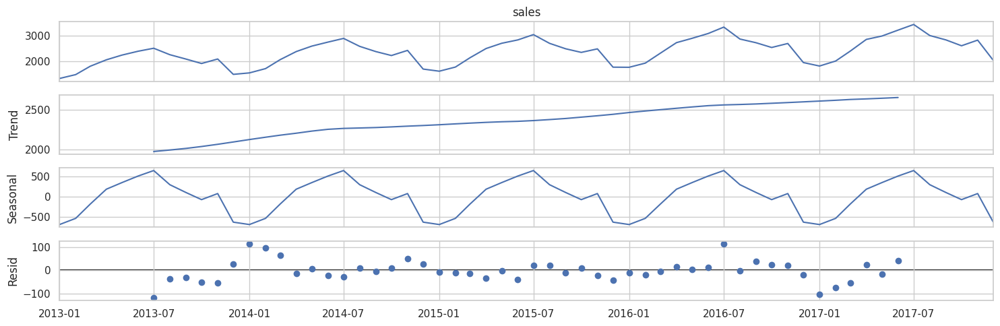

	
* ETS plot for store2:-


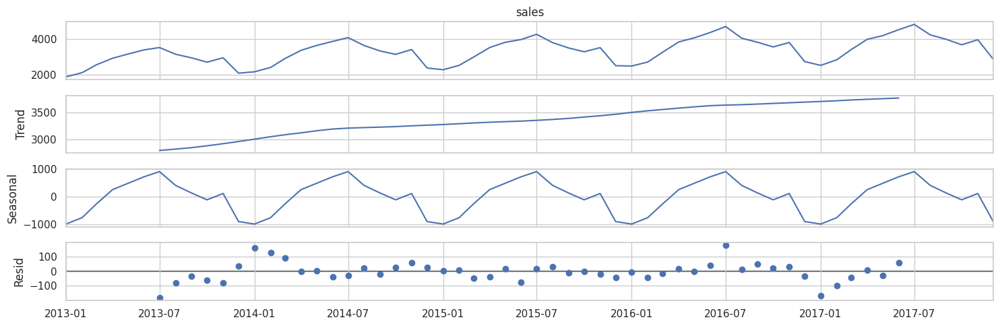

	
* ETS plot for store3:-


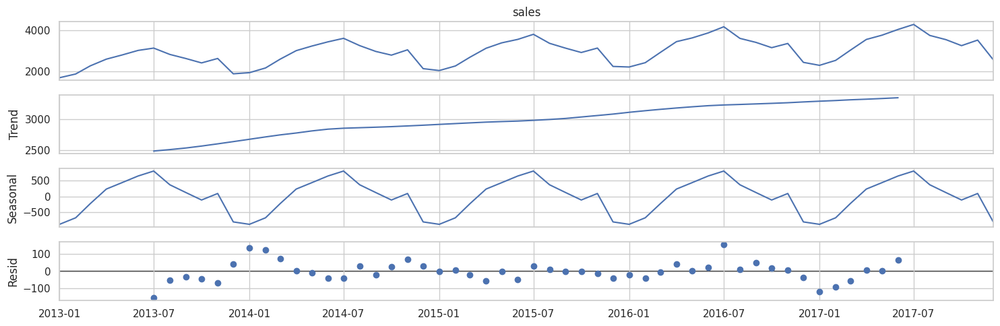

	
* ETS plot for store4:-


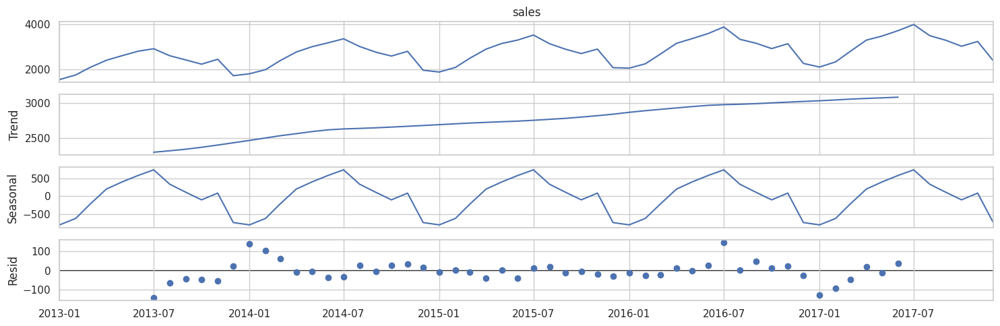

	
* ETS plot for store5:-


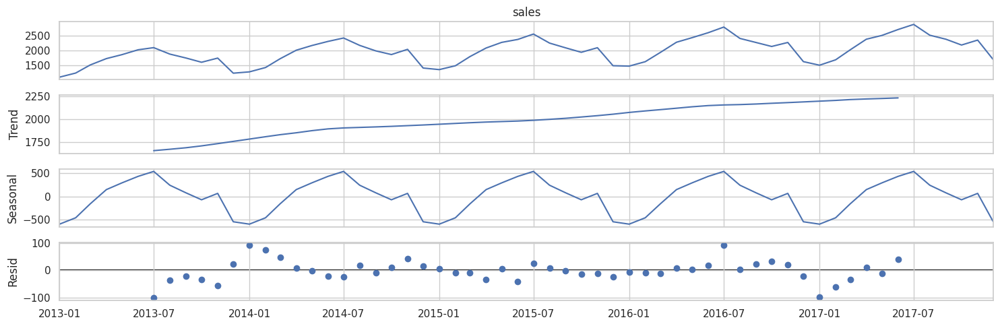

	
* ETS plot for store6:-


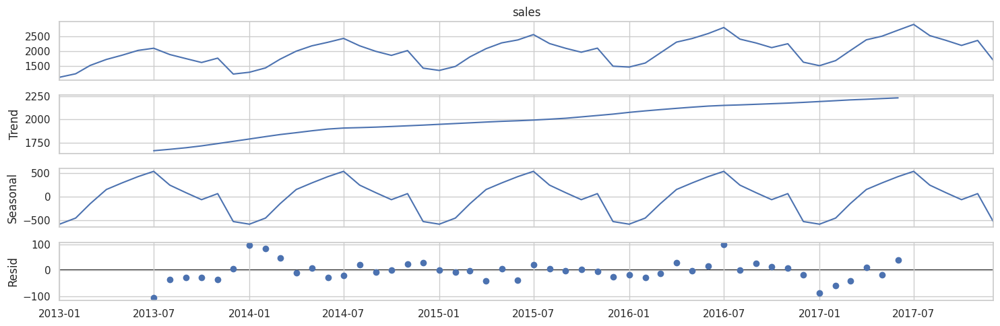

	
* ETS plot for store7:-


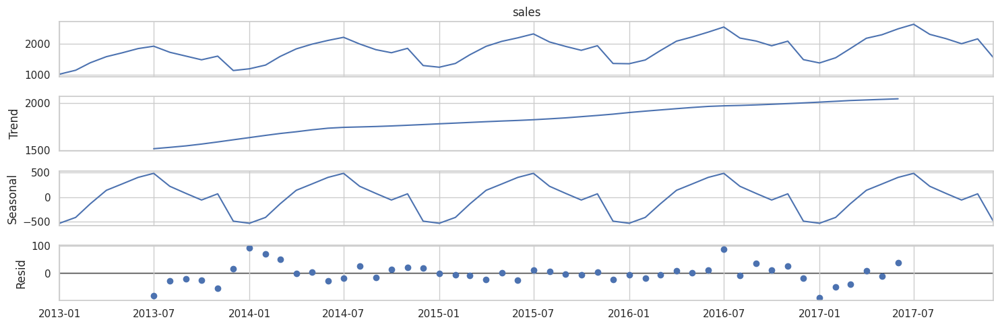

	
* ETS plot for store8:-


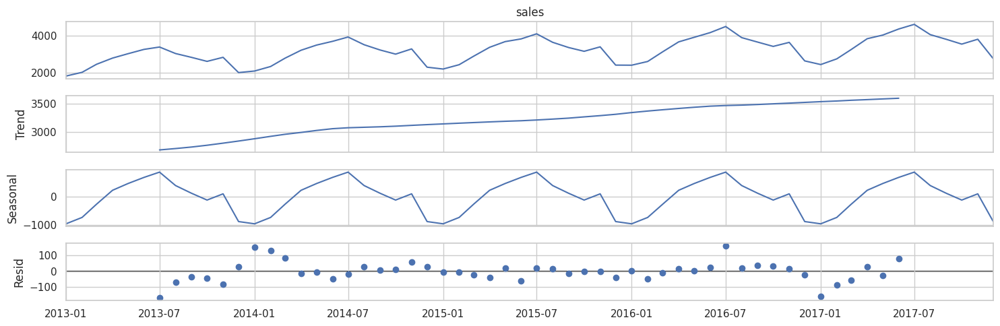

	
* ETS plot for store9:-


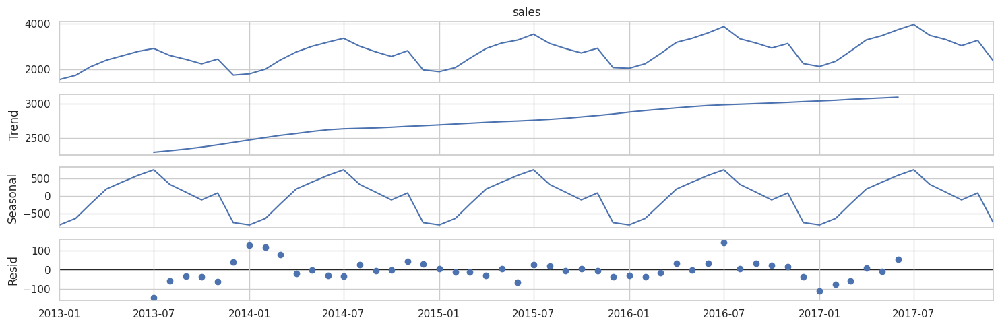

	
* ETS plot for store10:-


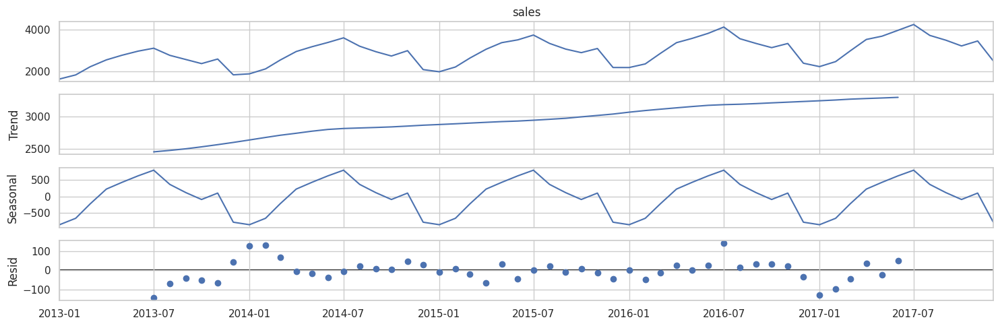

In [ ]:
for i in range(10):
  print(f'* ETS plot for store{i+1}:-')
  etsplot(mstore_set[i])
  print("=="*50)
  print("\t")





*   Multiplicative model




In [ ]:
from pylab import rcParams

def mul_etsplot(data):
  rcParams['figure.figsize']=15,8
  decomposition_office = sm.tsa.seasonal_decompose(data['sales'],model='multiplicative')
  fig = decomposition_office.plot()
  plt.show()

* Multiplicative ETS plot for store1:-


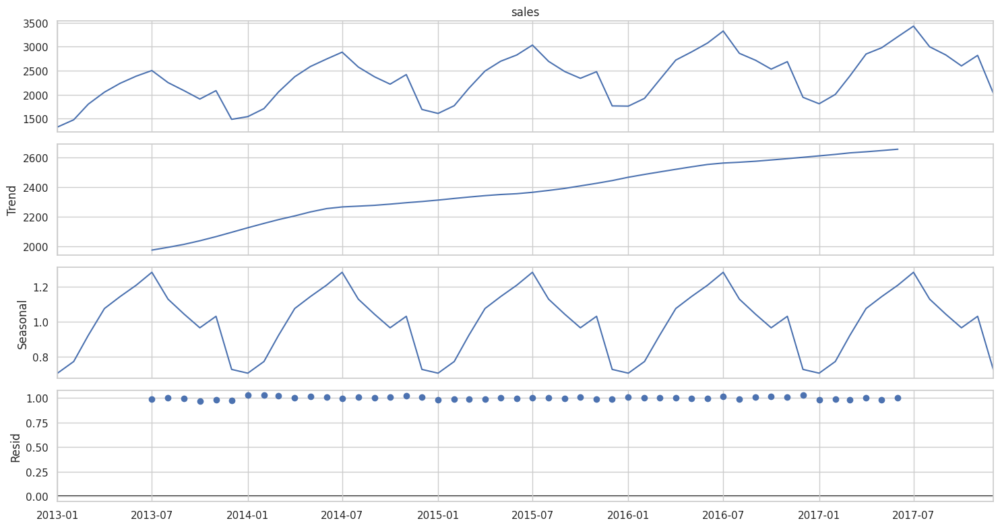

	
* Multiplicative ETS plot for store2:-


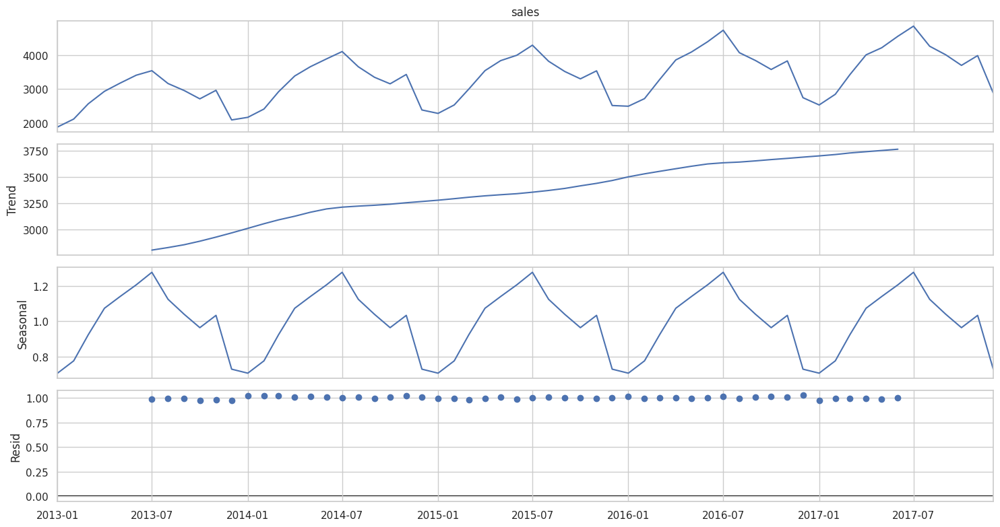

	
* Multiplicative ETS plot for store3:-


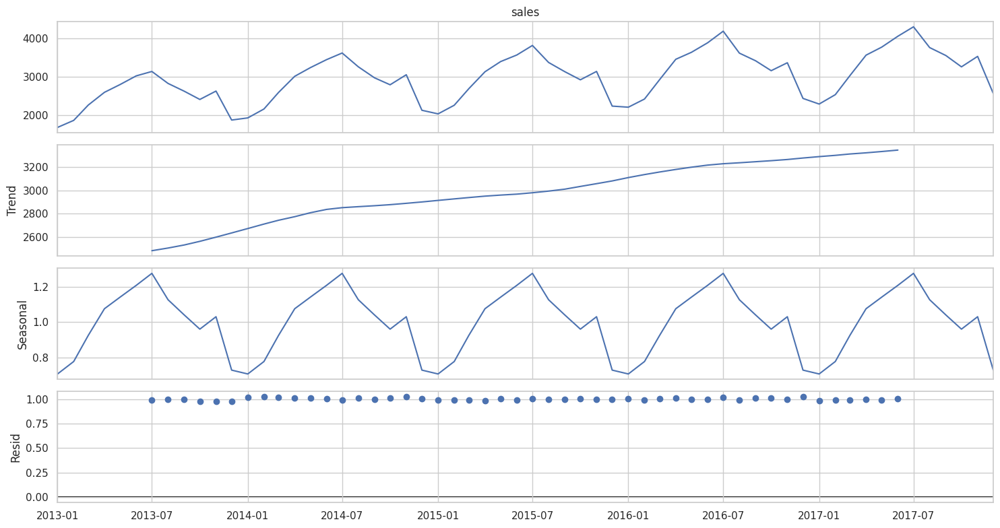

	
* Multiplicative ETS plot for store4:-


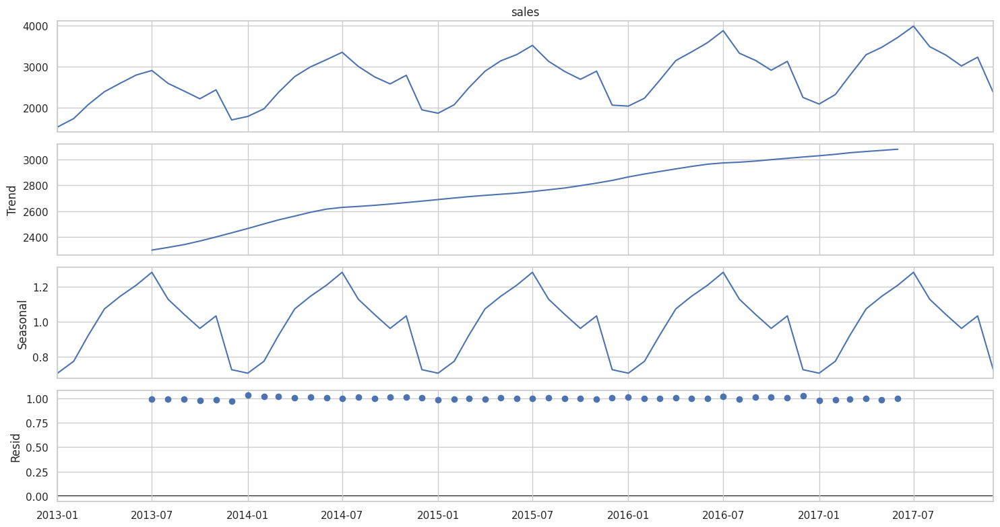

	
* Multiplicative ETS plot for store5:-


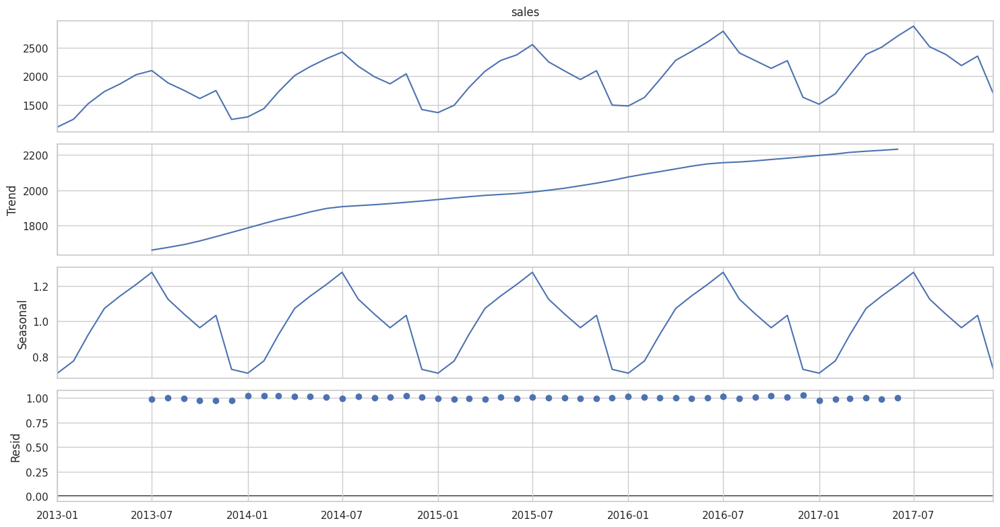

	
* Multiplicative ETS plot for store6:-


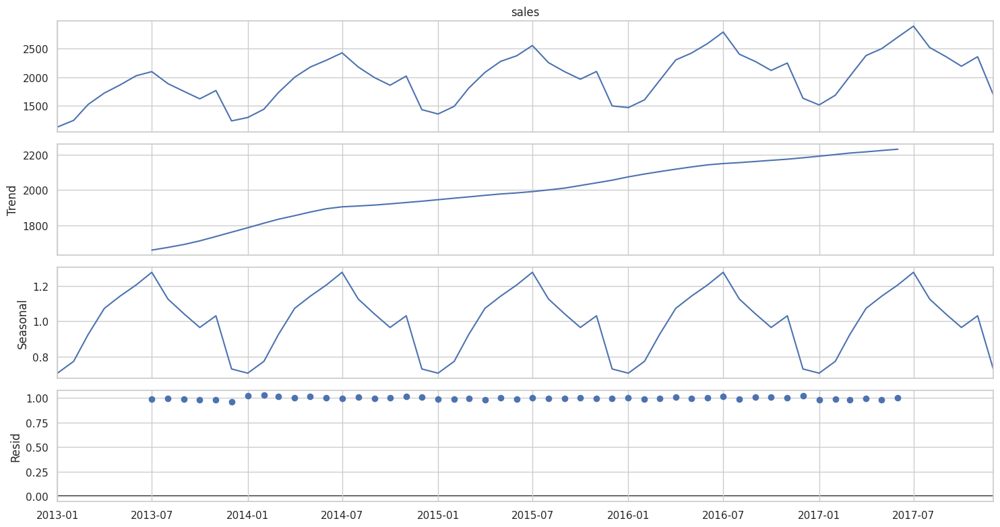

	
* Multiplicative ETS plot for store7:-


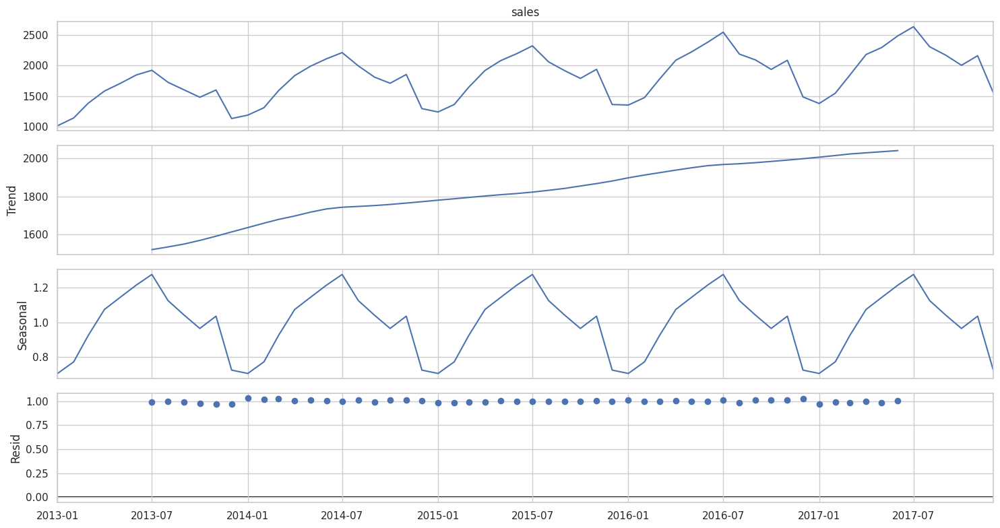

	
* Multiplicative ETS plot for store8:-


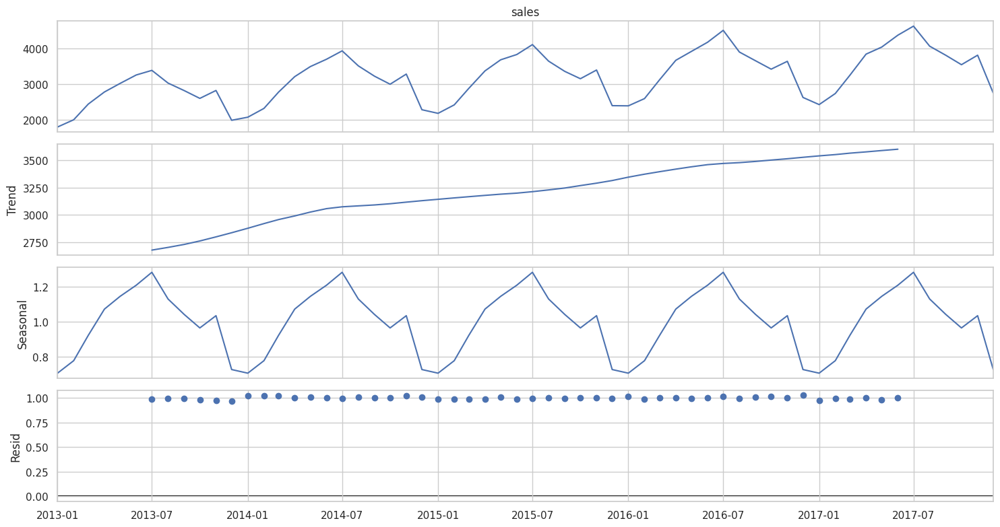

	
* Multiplicative ETS plot for store9:-


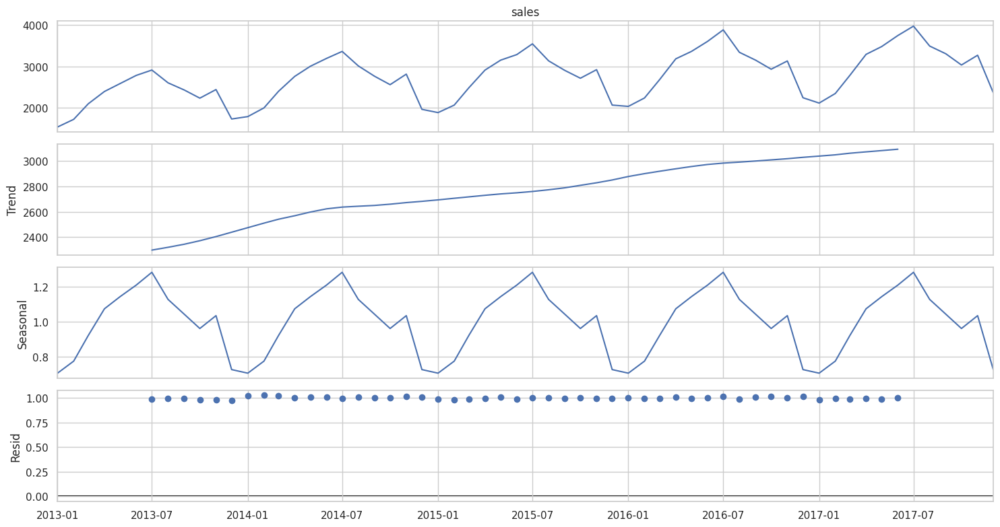

	
* Multiplicative ETS plot for store10:-


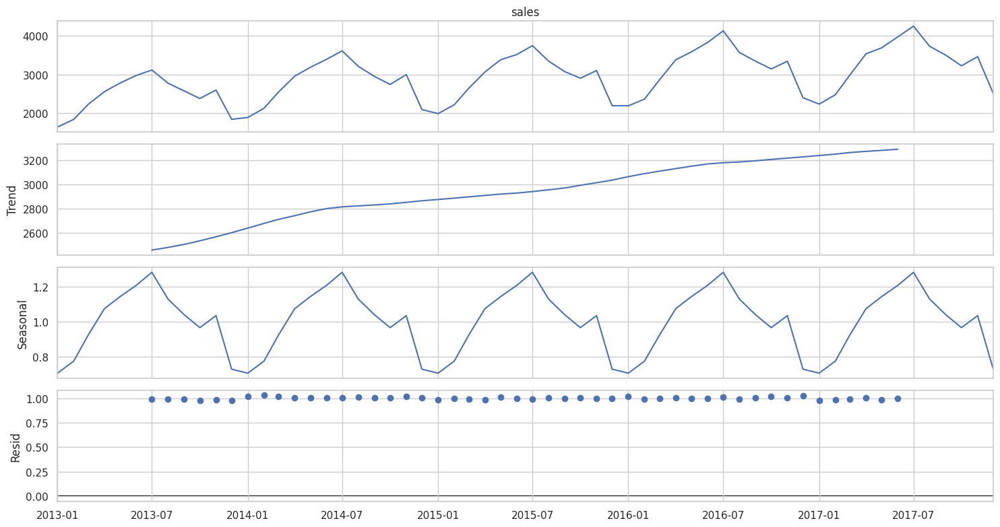

In [ ]:
for i in range(10):
  print(f'* Multiplicative ETS plot for store{i+1}:-')
  mul_etsplot(mstore_set[i])
  print("=="*50)
  print("\t")

Seasonal decompose

 Seasonal decompose plot for the Store1


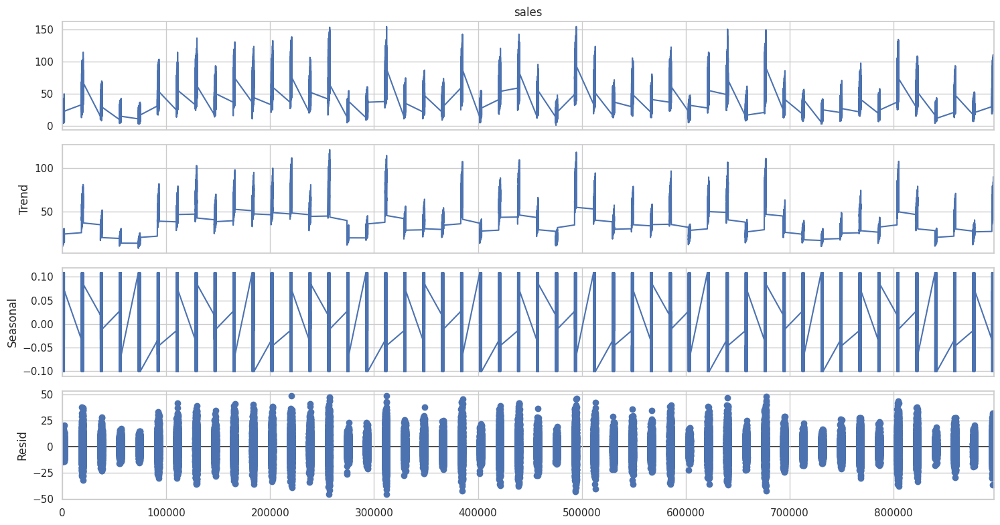

	
 Seasonal decompose plot for the Store2


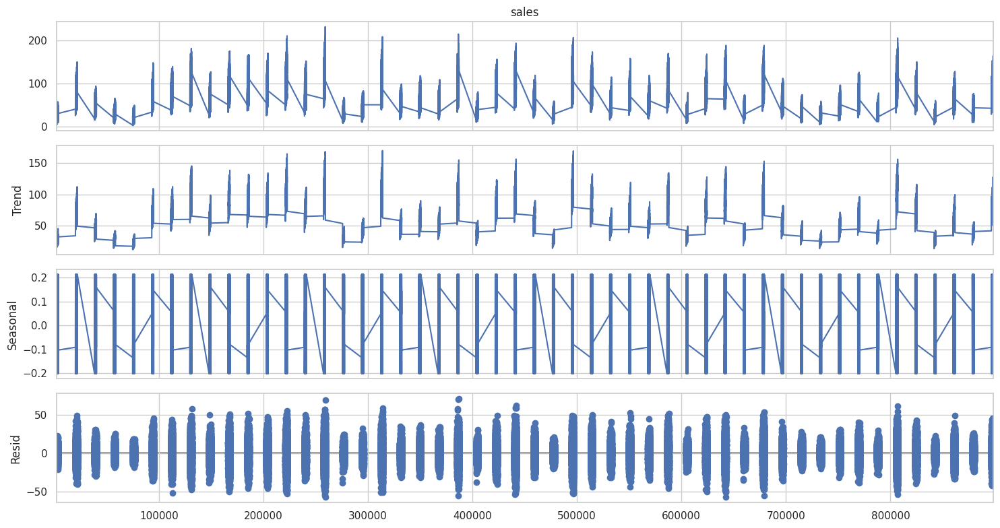

	
 Seasonal decompose plot for the Store3


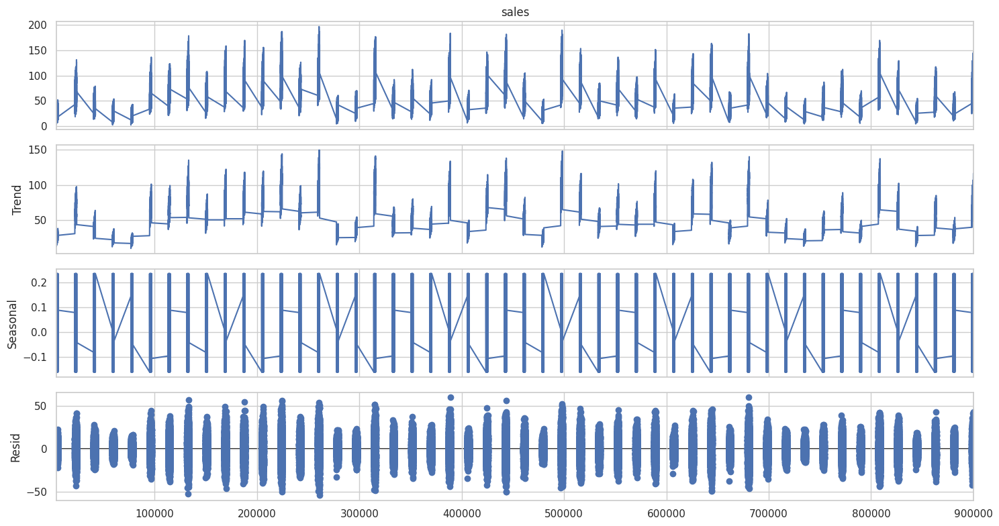

	
 Seasonal decompose plot for the Store4


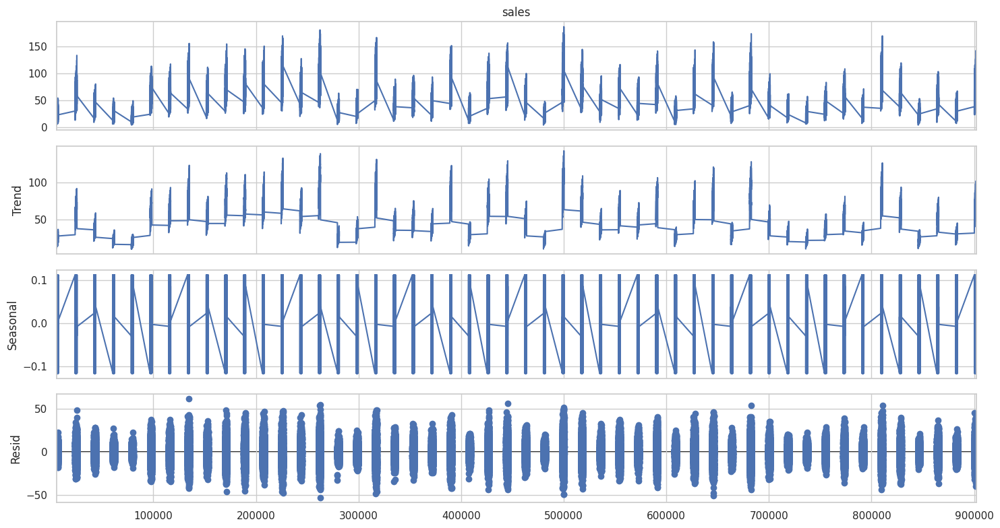

	
 Seasonal decompose plot for the Store5


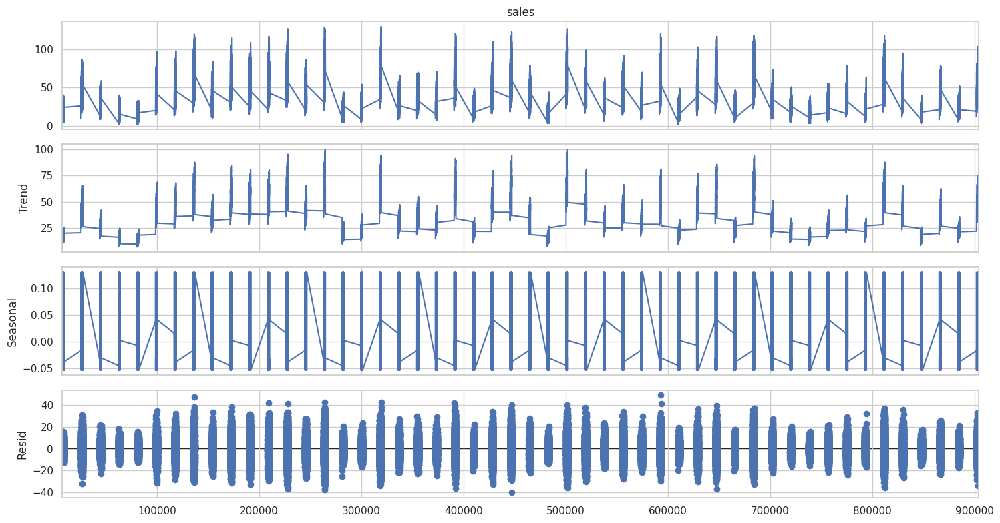

	
 Seasonal decompose plot for the Store6


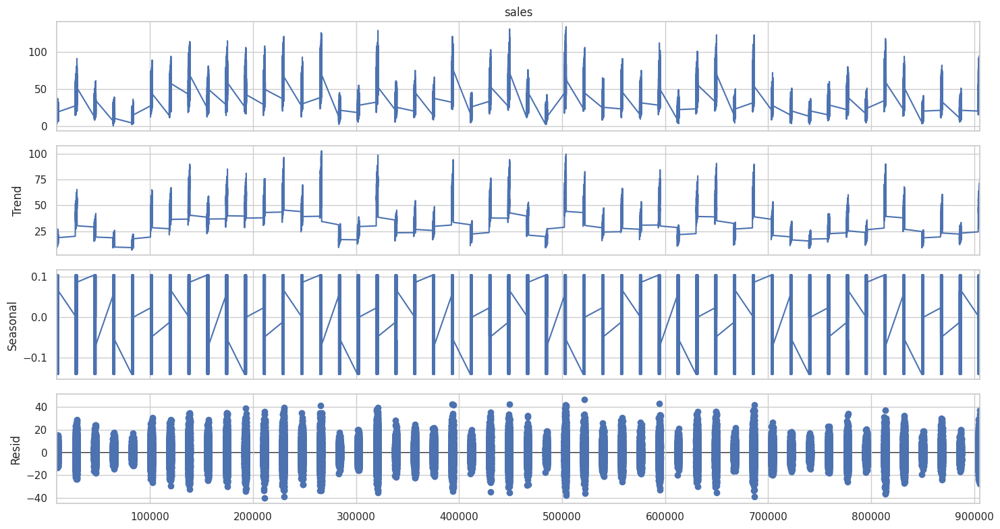

	
 Seasonal decompose plot for the Store7


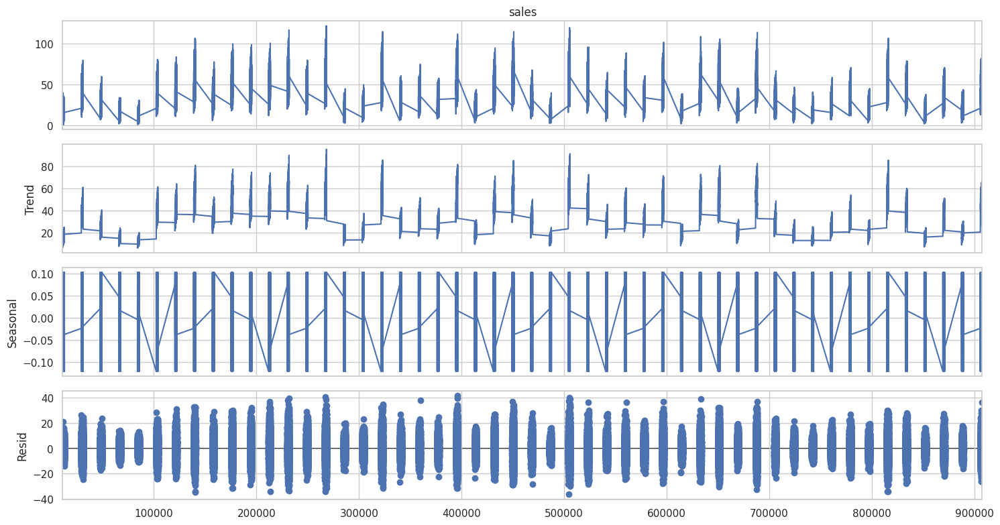

	
 Seasonal decompose plot for the Store8


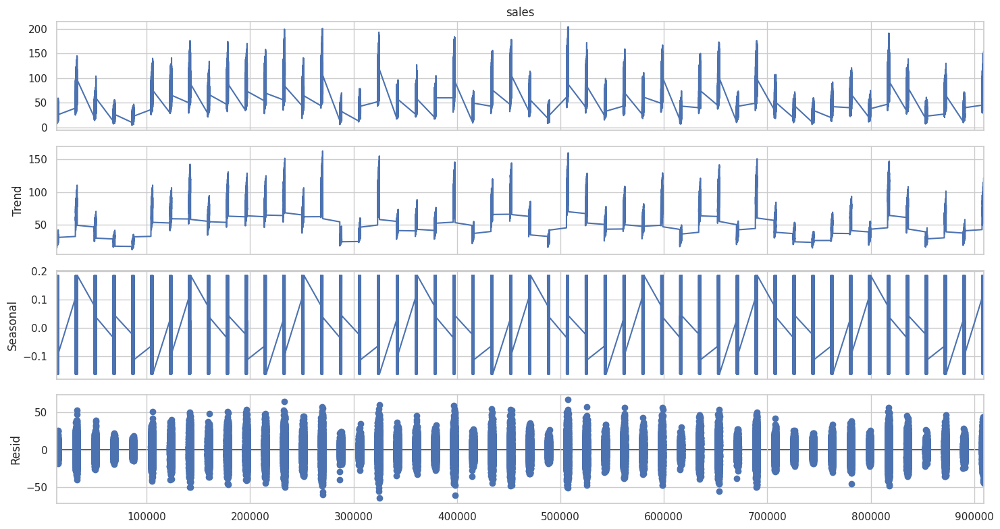

	
 Seasonal decompose plot for the Store9


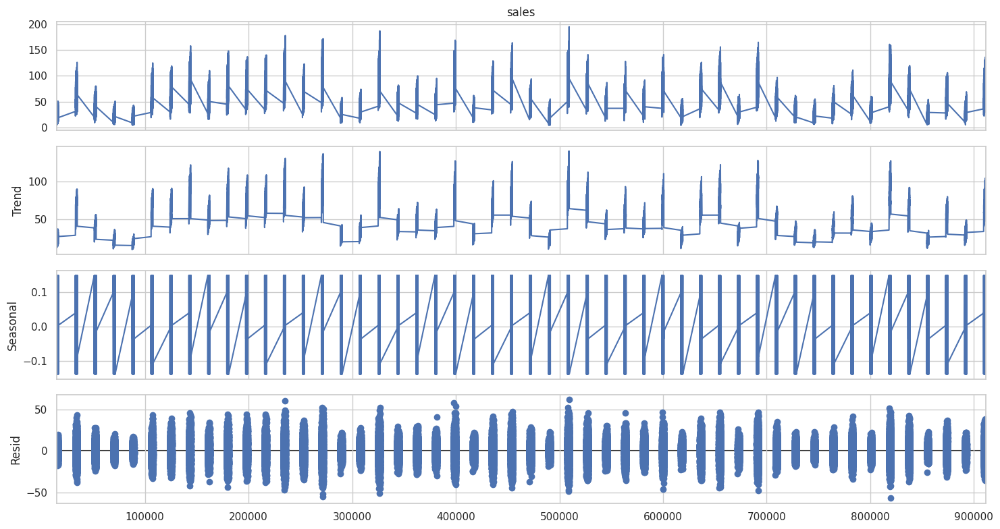

	
 Seasonal decompose plot for the Store10


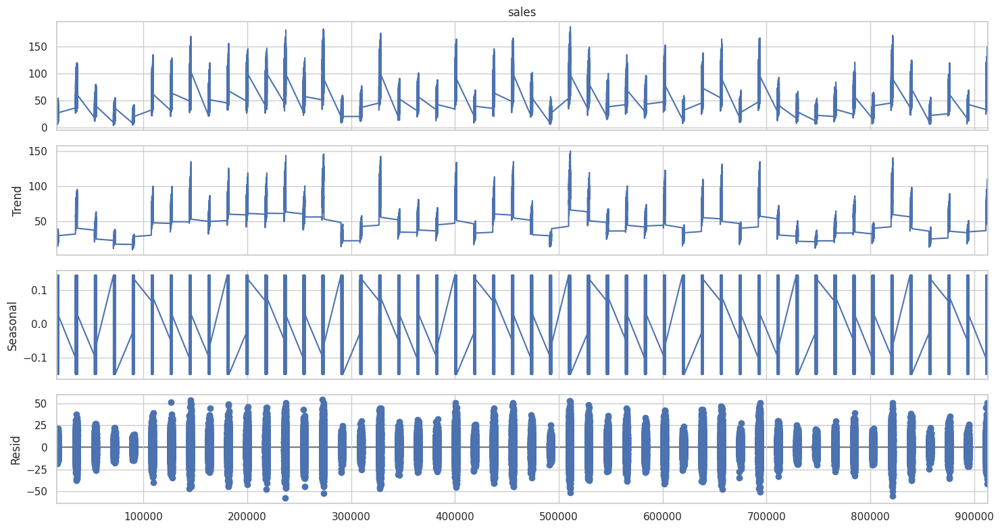

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
for i in train['store'].unique():
    store_i = train.loc[train['store'] == i]
    decompose_ts_add = seasonal_decompose(store_i.sales, model = "additive", period = 12)
    decompose_ts_add.plot()
    print(' Seasonal decompose plot for the Store'+ str(i))
    plt.show()
    print("=="*50)
    print("\t")

Autocorrelation & Partial-AutoCorrelation plot

In [ ]:
def corr_plot(data):
  plt.figure(figsize=(12, 5))

  plt.subplot(1, 2, 1)
  acf_plot = plot_acf(data, ax=plt.gca())
  plt.title("Autocorrelation Plot")
  plt.xlabel("Lag")
  plt.ylabel("Autocorrelation")
  plt.subplot(1, 2, 2)
  pacf_plot = plot_pacf(data, ax=plt.gca())
  plt.title("Partial Autocorrelation Plot")
  plt.xlabel("Lag")
  plt.ylabel("Partial Autocorrelation")
  plt.tight_layout()
  plt.show()

*  Plot for store1:-


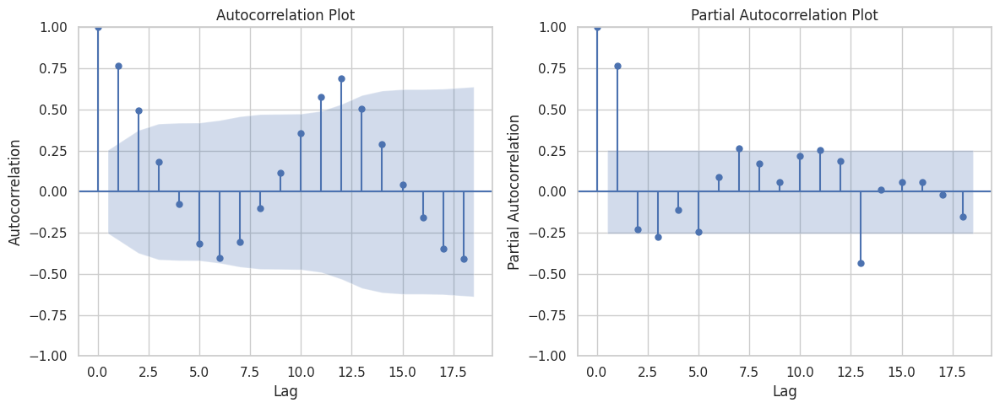

	
*  Plot for store2:-


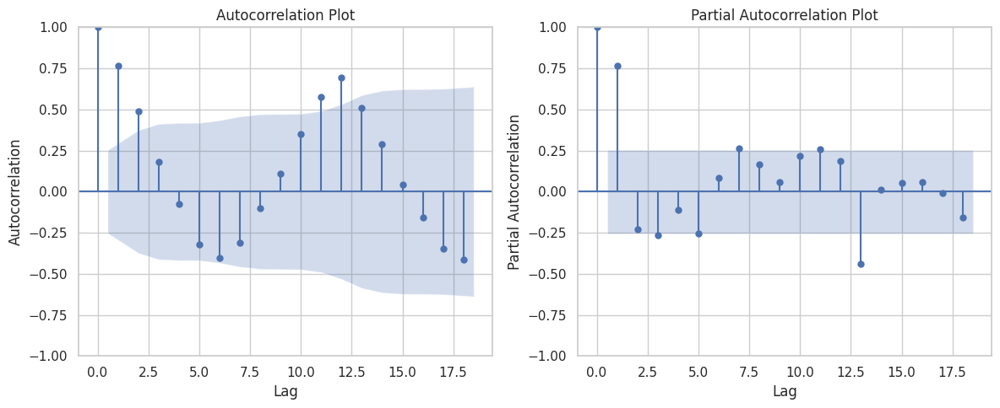

	
*  Plot for store3:-


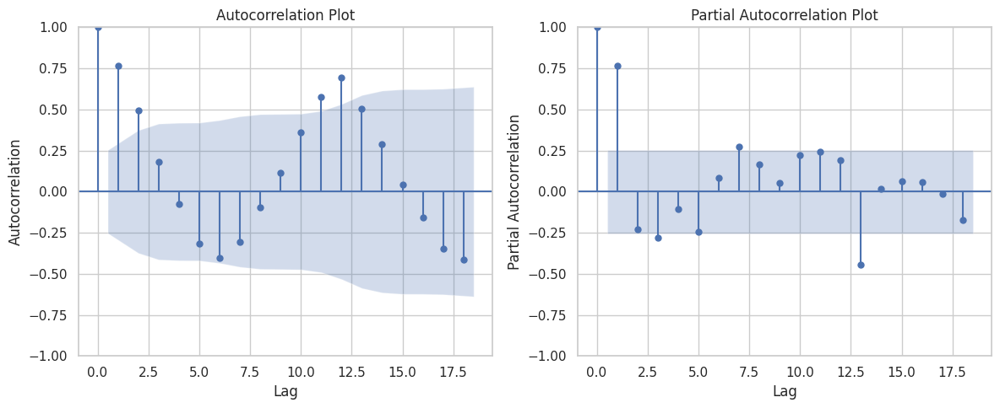

	
*  Plot for store4:-


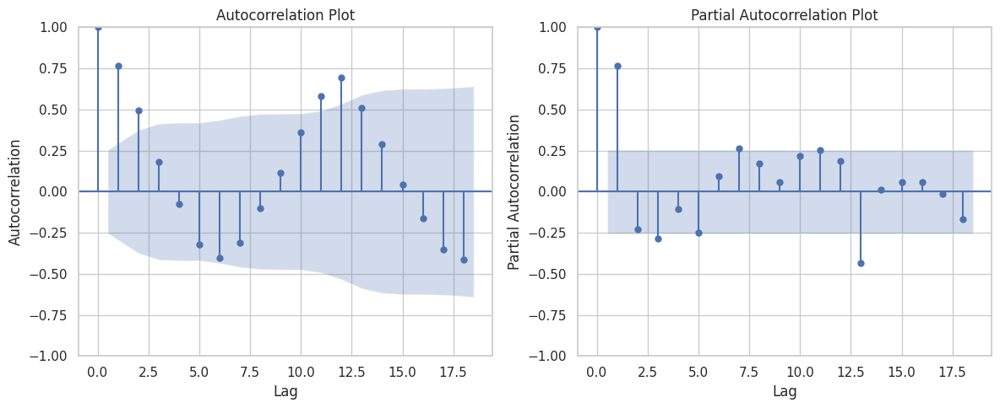

	
*  Plot for store5:-


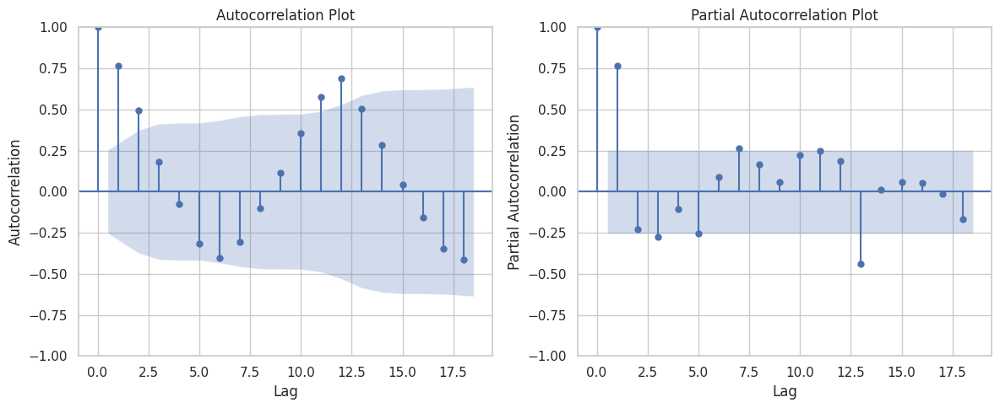

	
*  Plot for store6:-


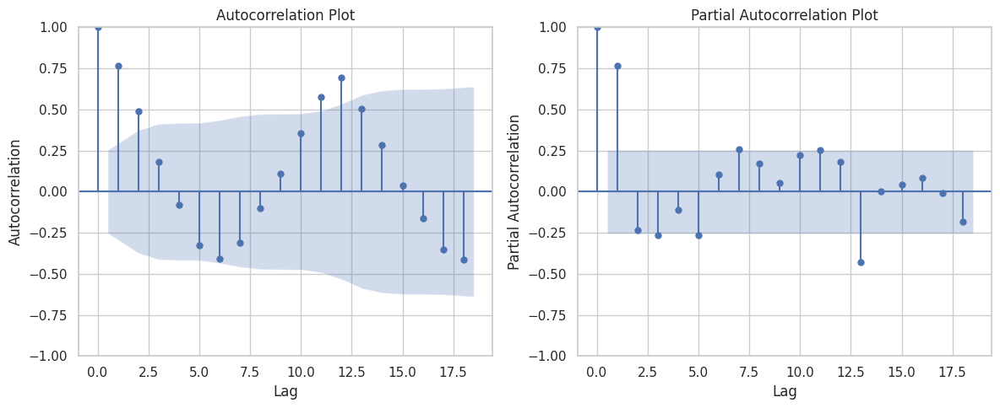

	
*  Plot for store7:-


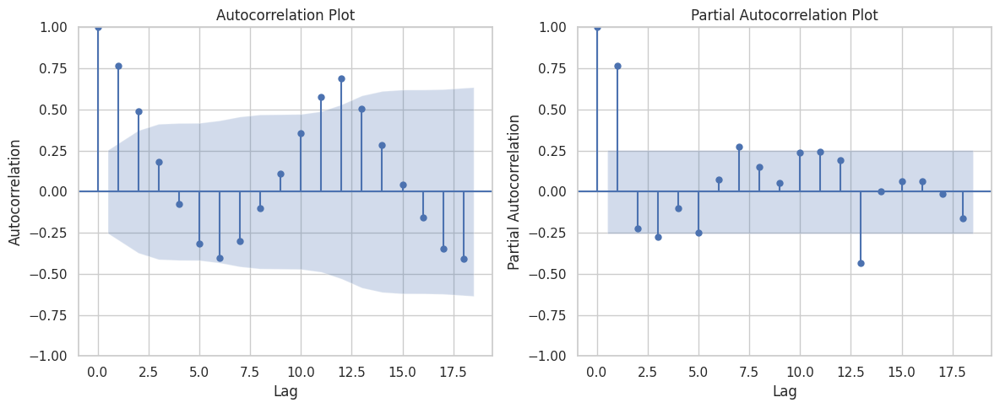

	
*  Plot for store8:-


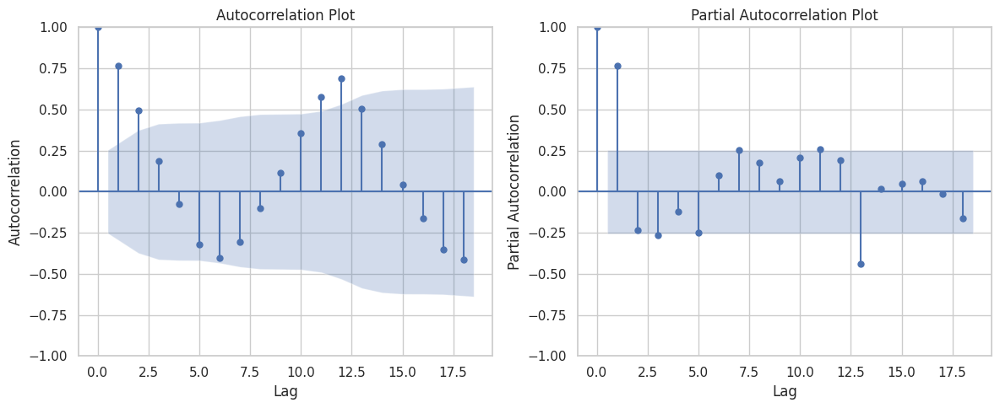

	
*  Plot for store9:-


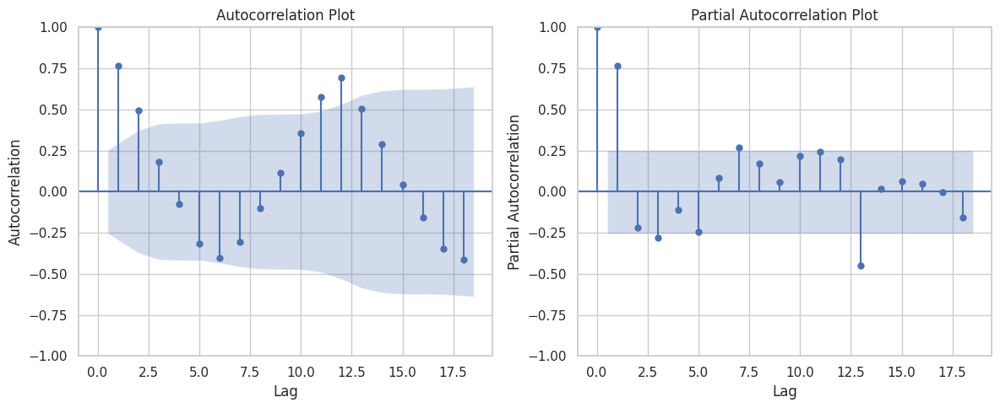

	
*  Plot for store10:-


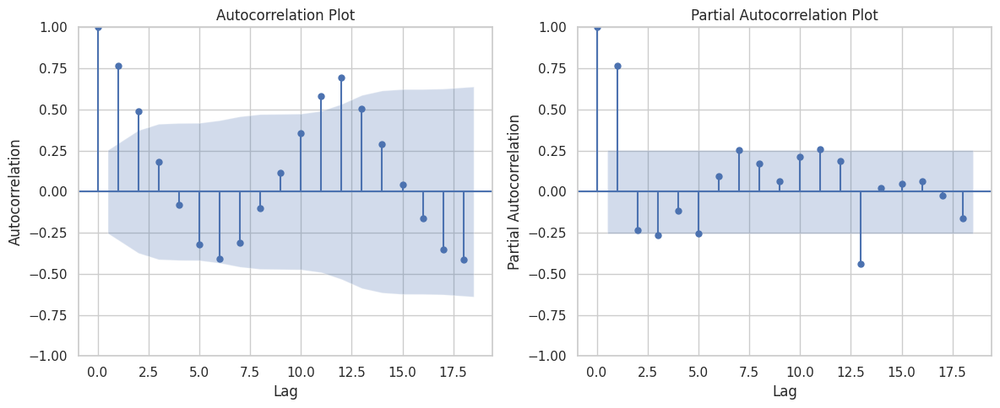

In [ ]:
for i in range(10):
  print(f'*  Plot for store{i+1}:-')
  corr_plot(mstore_set[i])
  print("=="*50)
  print("\t")

#Time Series Forecasting Model



* SARIMA MODEL
* FB Prophoet MODEL
* Using DL








##1.   SARIMA MODEL






Finding the best parameter for the SRIMAX model

In [ ]:
! pip install pmdarima

In [ ]:
for i in range(10):
    from pmdarima import auto_arima
    print(f'Auto Arima model for store{i+1}')
    model = auto_arima(mstore_set[i], m=12, seasonal=True, trace=True)

Auto Arima model for store1
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=510.342, Time=3.37 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=509.051, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=512.111, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=512.275, Time=0.43 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=510.737, Time=0.32 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=510.853, Time=0.35 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=510.569, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=510.533, Time=0.15 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=512.514, Time=0.21 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=510.926, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 5.718 seconds
Auto Arima model for store2
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.18 

In [ ]:
# This code shows all iterations with AIC values to get best parameter
'''
import itertools
# Define the p, d and q parameters to take any value between 0 and 3
p = d = q = range(0, 3)

# Generate all different combinations of p, q and q triplets
simple_pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
seasonal_pdq = [(i[0], i[1], i[2], 12) for i in list(itertools.product(p, d, q))]

print('Parameter combinations for Seasonal ARIMA...')

for param in simple_pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(mstore1,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)


            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
          continue

'''

#The code conducts an exhaustive search through various combinations of parameters for both non-seasonal and seasonal components of a SARIMA model

"\nimport itertools\n# Define the p, d and q parameters to take any value between 0 and 3\np = d = q = range(0, 3)\n\n# Generate all different combinations of p, q and q triplets\nsimple_pdq = list(itertools.product(p, d, q))\n\n# Generate all different combinations of seasonal p, q and q triplets\nseasonal_pdq = [(i[0], i[1], i[2], 12) for i in list(itertools.product(p, d, q))]\n\nprint('Parameter combinations for Seasonal ARIMA...')\n\nfor param in simple_pdq:\n    for param_seasonal in seasonal_pdq:\n        try:\n            mod = sm.tsa.statespace.SARIMAX(mstore1,\n                                            order=param,\n                                            seasonal_order=param_seasonal,\n                                            enforce_stationarity=False,\n                                            enforce_invertibility=False)\n\n\n            results = mod.fit()\n\n            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))\n        except:\

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

SARIMA MODEL for Store 1

In [ ]:
train_store1_m = mstore1.iloc[:48]
test_store1_m = mstore1.iloc[48:]

In [ ]:
print(train_store1_m.value_counts().sum(),test_store1_m.value_counts().sum())

48 12


In [ ]:
model_store1= SARIMAX(train_store1_m,order=(2, 1, 1),seasonal_order=(1, 1, 1, 12),enforce_invertibility=False)
result_store1 = model_store1.fit()
result_store1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(2, 1, 1)x(1, 1, 1, 12)   Log Likelihood                -187.426
Date:                            Mon, 01 Jan 2024   AIC                            386.852
Time:                                    06:24:09   BIC                            396.184
Sample:                                01-01-2013   HQIC                           390.074
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7958      0.899     -0.885      0.376      -2.558       0.966
ar.L2         -0.2022      0.205     -0.984      0.325      -0.605       0.200
ma.L1          0.7834      0.936      0.837      0.403      -1.052       2.618
ar.S.L12      -0.9983      1.273     -0.784      0.433      -3.493       1.496
ma.S.L12       1.0359     13.467      0.077      0.939     -25.359      27.431
sigma2      2052.1065   3.03e+04      0.068      0.946   -5.74e+04    6.15e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 4.36
Prob(Q):                              0.97   Prob(JB):                         0.11
Heteroskedasticity (H):               0.71   Skew:                            -0.85
Prob(H) (two-sided):                  0.56   Kurtosis:                         3.30
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

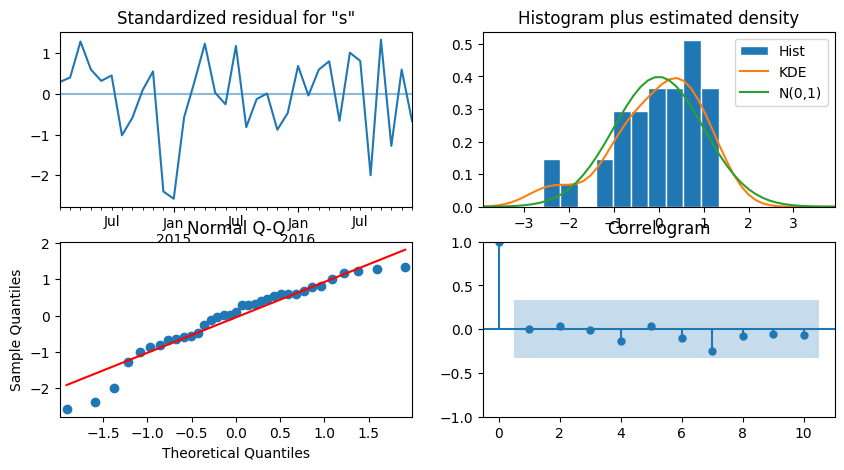

In [ ]:
result_store1.plot_diagnostics(figsize=(10,5))
plt.show()

In [ ]:
start = len(train_store1_m)
end = len(train_store1_m) + len(test_store1_m) - 1

In [ ]:
prediction_store1_m = result_store1.predict(start,end).rename('SARIMA model predictions')

Text(0.5, 1.0, 'store1 month supplies sales')

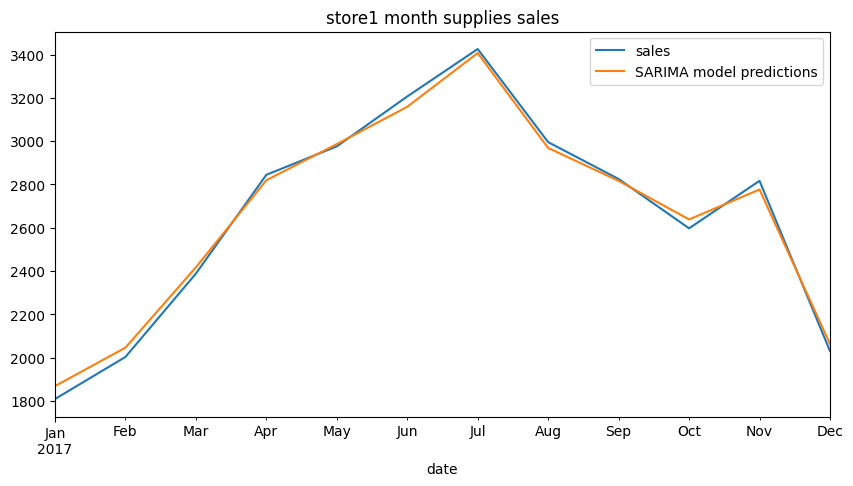

In [ ]:
test_store1_m.plot(figsize=(10,5),legend=True)
prediction_store1_m.plot(legend=True)
plt.title("store1 month supplies sales")

In [ ]:
prediction_store1_m=pd.DataFrame(prediction_store1_m)

In [ ]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse
msc1=mean_squared_error(test_store1_m,prediction_store1_m)
print('Mean_squared_error is :- ',msc1)

r1=rmse(test_store1_m,prediction_store1_m)
print('Root mean square error :-',r1)

t1=test_store1_m.mean()
print('mean of test values :-',t1)


Mean_squared_error is :-  1229.7627296608223
Root mean square error :- [35.06797299]
mean of test values :- sales    2659.885305
dtype: float64


Now lets forecast on unnknown values and visualize it

Text(0.5, 1.0, 'store1 Monthly supplies sales')

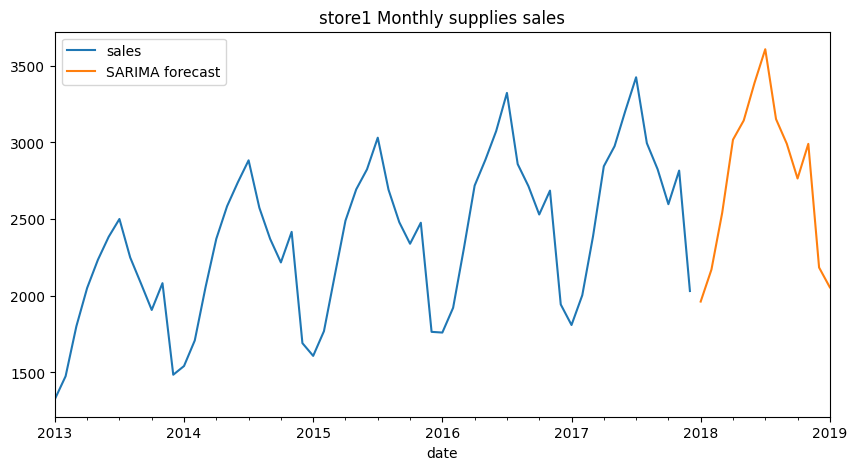

In [ ]:
#Now let us forecast into the unknown future
model_store1_m_final = SARIMAX(mstore1,order=(2, 1, 1),seasonal_order=(1, 1, 1, 12))
result_store1_m_final = model_store1_m_final.fit()
forecast_store1_m= result_store1_m_final.predict(len(mstore1),len(mstore1)+12,typ='levels').rename('SARIMA forecast')
mstore1.plot(legend=True,figsize=(10,5))
forecast_store1_m.plot(legend=True)
plt.title("store1 Monthly supplies sales")

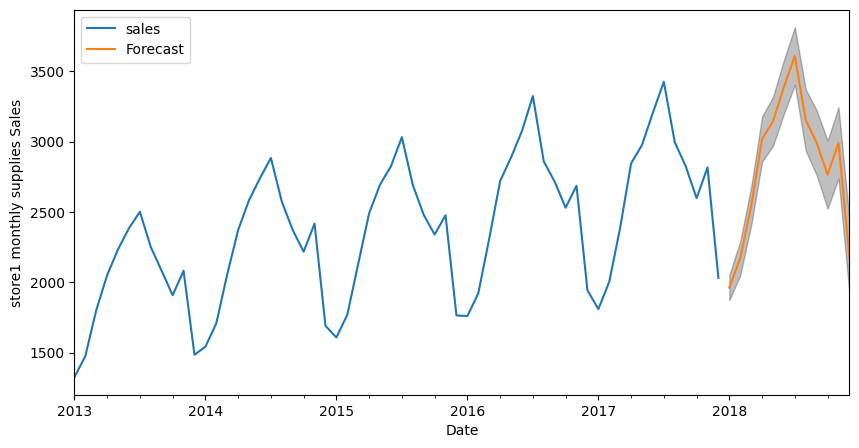

In [ ]:
pred_store1_m = result_store1_m_final.get_forecast(steps=12)
pred_ci_store1_m = pred_store1_m.conf_int()
ax = mstore1.plot(label='observed',figsize=(10,5))
pred_store1_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store1_m.index,
               pred_ci_store1_m.iloc[:,0],
               pred_ci_store1_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('store1 monthly supplies Sales')
plt.legend()
plt.show()

SARIMA MODEL for Store 2

In [ ]:
# Generate all possible combinations of p, d, q, P, D, Q
'''
p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]


# Perform grid search
best_aic = float('inf')
best_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(mstore2['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results = mod.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, param_seasonal)
        except:
            continue

print(f'Best AIC: {best_aic}')
print(f'Best Parameters: {best_params}')
'''

#This code aims to identify the SARIMA model configuration that offers the best trade-off
#between goodness-of-fit and model complexity based on AIC.


"\np = d = q = range(0, 3)\npdq = list(itertools.product(p, d, q))\nseasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]\n\n\n# Perform grid search\nbest_aic = float('inf')\nbest_params = None\n\nfor param in pdq:\n    for param_seasonal in seasonal_pdq:\n        try:\n            mod = sm.tsa.statespace.SARIMAX(mstore2['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)\n            results = mod.fit()\n            if results.aic < best_aic:\n                best_aic = results.aic\n                best_params = (param, param_seasonal)\n        except:\n            continue\n\nprint(f'Best AIC: {best_aic}')\nprint(f'Best Parameters: {best_params}')\n"

In [ ]:
train_store2_m = mstore2.iloc[:48]
test_store2_m = mstore2.iloc[48:]

In [ ]:
model_store2= SARIMAX(train_store2_m,order=(2, 1, 1),seasonal_order=(1, 1, 1, 12),enforce_invertibility=False)
result_store2 = model_store2.fit()
result_store2.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(2, 1, 1)x(1, 1, 1, 12)   Log Likelihood                -200.318
Date:                            Mon, 01 Jan 2024   AIC                            412.637
Time:                                    06:24:14   BIC                            421.969
Sample:                                01-01-2013   HQIC                           415.858
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7615      0.568     -1.340      0.180      -1.875       0.352
ar.L2         -0.2583      0.165     -1.562      0.118      -0.583       0.066
ma.L1          0.7022      0.569      1.235      0.217      -0.412       1.817
ar.S.L12      -0.9981      0.044    -22.585      0.000      -1.085      -0.911
ma.S.L12       0.9645      0.428      2.253      0.024       0.126       1.803
sigma2      4398.9248      0.000   4.03e+07      0.000    4398.925    4398.925
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 1.63
Prob(Q):                              0.88   Prob(JB):                         0.44
Heteroskedasticity (H):               0.72   Skew:                            -0.53
Prob(H) (two-sided):                  0.58   Kurtosis:                         2.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.9e+23. Standard errors may be unstable.
"""

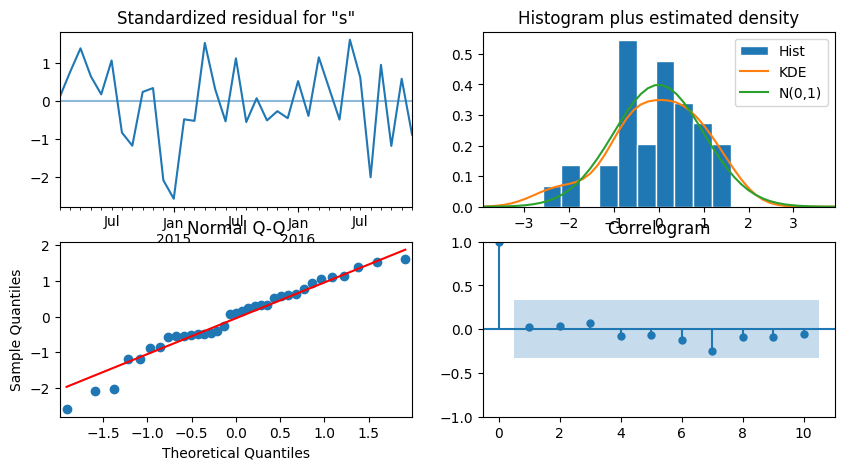

In [ ]:
result_store2.plot_diagnostics(figsize=(10,5))
plt.show()

In [ ]:
start = len(train_store2_m)
end = len(train_store2_m) + len(test_store2_m) - 1


In [ ]:
prediction_store2_m = result_store2.predict(start,end).rename('SARIMA model predictions')

Text(0.5, 1.0, 'store2 month supplies sales')

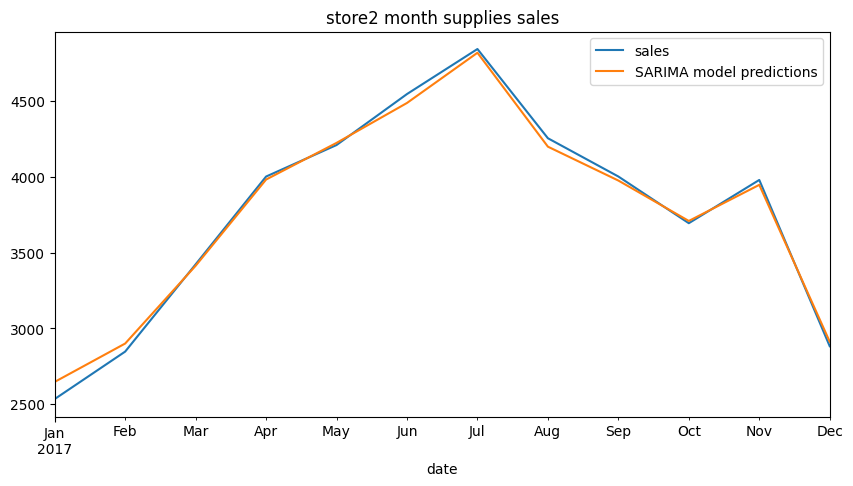

In [ ]:
test_store2_m.plot(figsize=(10,5),legend=True)
prediction_store2_m.plot(legend=True)
plt.title("store2 month supplies sales")

In [ ]:
prediction_store2_m=pd.DataFrame(prediction_store2_m)

In [ ]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse
msc2=mean_squared_error(test_store2_m,prediction_store2_m)
print('Mean_squared_error is :- ',msc2)

r2=rmse(test_store2_m,prediction_store2_m)
print('Root mean square error :-',r2)

t2=test_store2_m.mean()
print('mean of test values :-',t2)

Mean_squared_error is :-  2192.8952252207287
Root mean square error :- [46.8283592]
mean of test values :- sales    3767.342921
dtype: float64


Now lets forecast on unnknown values and visualize it

Text(0.5, 1.0, 'store2 Monthly supplies sales')

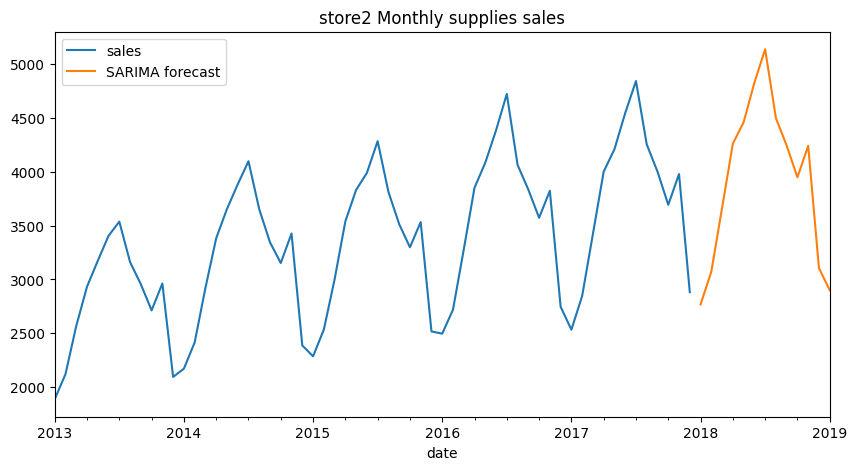

In [ ]:
#Now let us forecast into the unknown future
model_store2_m_final = SARIMAX(mstore2,order=(2, 1, 1),seasonal_order=(1, 1, 1, 12))
result_store2_m_final = model_store2_m_final.fit()
forecast_store2_m= result_store2_m_final.predict(len(mstore2),len(mstore2)+12,typ='levels').rename('SARIMA forecast')
mstore2.plot(legend=True,figsize=(10,5))
forecast_store2_m.plot(legend=True)
plt.title("store2 Monthly supplies sales")

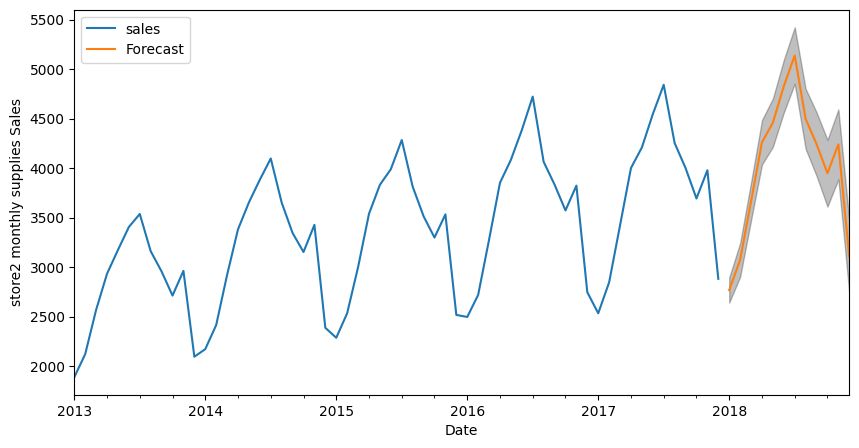

In [ ]:
pred_store2_m = result_store2_m_final.get_forecast(steps=12)
pred_ci_store2_m = pred_store2_m.conf_int()
ax = mstore2.plot(label='observed',figsize=(10,5))
pred_store2_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store2_m.index,
               pred_ci_store2_m.iloc[:,0],
               pred_ci_store2_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('store2 monthly supplies Sales')
plt.legend()
plt.show()

SARIMA MODEL for Store 3

In [ ]:
# Generate all possible combinations of p, d, q, P, D, Q
# This codes take more than 30-45 minutes to execute so avoid to run
'''

p = d = q = range(0, 4)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]


# Perform grid search
best_aic = float('inf')
best_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(mstore3['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results = mod.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, param_seasonal)
        except:
            continue

print(f'Best AIC: {best_aic}')
print(f'Best Parameters: {best_params}')
'''
#This code aims to find the SARIMA model configuration that provides the best balance
#between goodness-of-fit and model complexity based on AIC.


"\n\np = d = q = range(0, 4)\npdq = list(itertools.product(p, d, q))\nseasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]\n\n\n# Perform grid search\nbest_aic = float('inf')\nbest_params = None\n\nfor param in pdq:\n    for param_seasonal in seasonal_pdq:\n        try:\n            mod = sm.tsa.statespace.SARIMAX(mstore3['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)\n            results = mod.fit()\n            if results.aic < best_aic:\n                best_aic = results.aic\n                best_params = (param, param_seasonal)\n        except:\n            continue\n\nprint(f'Best AIC: {best_aic}')\nprint(f'Best Parameters: {best_params}')\n"

In [ ]:
train_store3_m = mstore3.iloc[:48]
test_store3_m = mstore3.iloc[48:]

In [ ]:
model_store3= SARIMAX(train_store3_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12),enforce_invertibility=False)
result_store3 = model_store3.fit()
result_store3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -194.640
Date:                            Mon, 01 Jan 2024   AIC                            403.280
Time:                                    06:24:26   BIC                            414.168
Sample:                                01-01-2013   HQIC                           407.039
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0433      0.181     -0.239      0.811      -0.398       0.311
ma.L2         -0.0772      0.212     -0.364      0.716      -0.493       0.339
ma.L3          0.2879      0.208      1.385      0.166      -0.119       0.695
ma.S.L12      -0.1082      0.360     -0.300      0.764      -0.815       0.598
ma.S.L24       0.7734      0.675      1.145      0.252      -0.550       2.097
ma.S.L36       0.4244      1.022      0.415      0.678      -1.580       2.428
sigma2      2329.6949      0.000   1.81e+07      0.000    2329.695    2329.695
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):                 2.76
Prob(Q):                              0.85   Prob(JB):                         0.25
Heteroskedasticity (H):               0.61   Skew:                            -0.66
Prob(H) (two-sided):                  0.40   Kurtosis:                         2.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.48e+23. Standard errors may be unstable.
"""

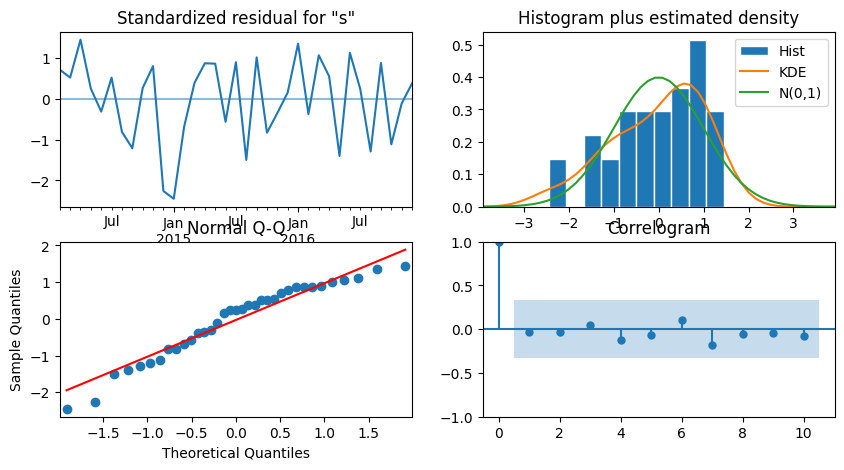

In [ ]:
result_store3.plot_diagnostics(figsize=(10,5))
plt.show()

In [ ]:
start = len(train_store3_m)
end = len(train_store3_m) + len(test_store3_m) - 1

In [ ]:
prediction_store3_m = result_store3.predict(start,end).rename('SARIMA model predictions')

Text(0.5, 1.0, 'store3 month supplies sales')

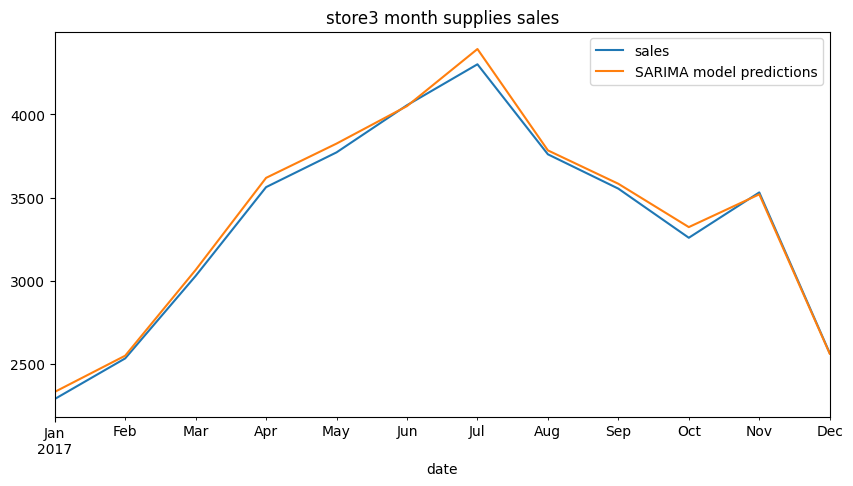

In [ ]:
test_store3_m.plot(figsize=(10,5),legend=True)
prediction_store3_m.plot(legend=True)
plt.title("store3 month supplies sales")

In [ ]:
prediction_store3_m=pd.DataFrame(prediction_store3_m)

In [ ]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse
msc3=mean_squared_error(test_store3_m,prediction_store3_m)
print('Mean_squared_error is :- ',msc3)

r3=rmse(test_store3_m,prediction_store3_m)
print('Root mean square error :-',r3)

t3 =test_store3_m.mean()
print('mean of test values :-',t3)

Mean_squared_error is :-  1958.0925498055867
Root mean square error :- [44.25033954]
mean of test values :- sales    3350.165559
dtype: float64


Now lets forecast on unnknown values and visualize it

In [ ]:
#Now let us forecast into the unknown future
model_store3_m_final = SARIMAX(mstore3,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store3_m_final = model_store3_m_final.fit()
forecast_store3_m= result_store3_m_final.predict(len(mstore3),len(mstore3)+12,typ='levels').rename('SARIMA forecast')
mstore3.plot(legend=True,figsize=(10,5))
forecast_store3_m.plot(legend=True)
plt.title("store3 Monthly supplies sales")

In [ ]:
pred_store3_m = result_store3_m_final.get_forecast(steps=12)
pred_ci_store3_m = pred_store3_m.conf_int()
ax = mstore3.plot(label='observed',figsize=(14,7))
pred_store3_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store3_m.index,
               pred_ci_store3_m.iloc[:,0],
               pred_ci_store3_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('store3 monthly supplies Sales')
plt.legend()
plt.show()

SARIMA MODEL for Store 4

In [ ]:
# Generate all possible combinations of p, d, q, P, D, Q
# This codes take more than 30-45 minutes to execute so avoid to run
'''

p = d = q = range(0, 4)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]


# Perform grid search
best_aic = float('inf')
best_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(mstore4['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results = mod.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, param_seasonal)
        except:
            continue

print(f'Best AIC: {best_aic}')
print(f'Best Parameters: {best_params}')
'''

In [ ]:
train_store4_m = mstore4.iloc[:48]
test_store4_m = mstore4.iloc[48:]

In [ ]:
model_store4= SARIMAX(train_store4_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12),enforce_invertibility=False)
result_store4 = model_store4.fit()
result_store4.summary()

In [ ]:
result_store4.plot_diagnostics(figsize=(10,5))
plt.show()

In [ ]:
start = len(train_store4_m)
end = len(train_store4_m) + len(test_store4_m) - 1

In [ ]:
prediction_store4_m = result_store4.predict(start,end).rename('SARIMA model predictions')

In [ ]:
test_store4_m.plot(figsize=(10,5),legend=True)
prediction_store4_m.plot(legend=True)
plt.title("store4 month supplies sales")

In [ ]:
prediction_store4_m=pd.DataFrame(prediction_store4_m)

In [ ]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse
msc4=mean_squared_error(test_store4_m,prediction_store4_m)
print('Mean_squared_error is :- ',msc4)

r4=rmse(test_store4_m,prediction_store4_m)
print('Root mean square error :-',r4)

t4 =test_store4_m.mean()
print('mean of test values :-',t4)

Now lets forecast on unnknown values and visualize it

Text(0.5, 1.0, 'store4 Monthly supplies sales')

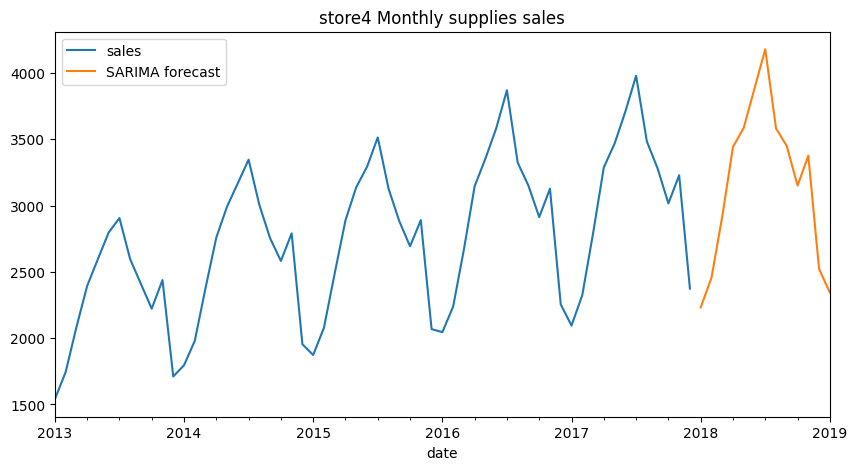

In [ ]:
#Now let us forecast into the unknown future
model_store4_m_final = SARIMAX(mstore4,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store4_m_final = model_store4_m_final.fit()
forecast_store4_m= result_store4_m_final.predict(len(mstore4),len(mstore4)+12,typ='levels').rename('SARIMA forecast')
mstore4.plot(legend=True,figsize=(10,5))
forecast_store4_m.plot(legend=True)
plt.title("store4 Monthly supplies sales")

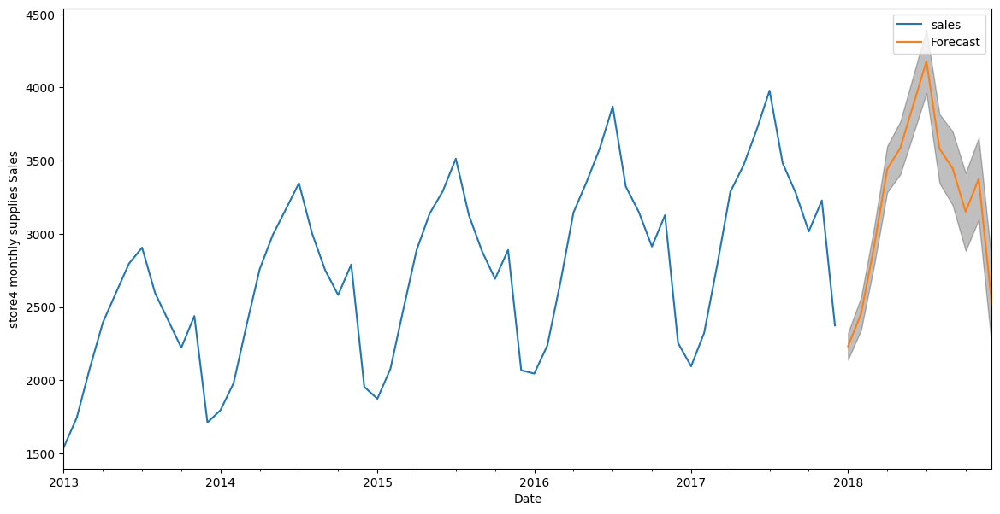

In [ ]:
pred_store4_m = result_store4_m_final.get_forecast(steps=12)
pred_ci_store4_m = pred_store4_m.conf_int()
ax = mstore4.plot(label='observed',figsize=(14,7))
pred_store4_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store4_m.index,
               pred_ci_store4_m.iloc[:,0],
               pred_ci_store4_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('store4 monthly supplies Sales')
plt.legend()
plt.show()

SARIMA MODEL for Store 5

In [ ]:
# Generate all possible combinations of p, d, q, P, D, Q
# This codes take more than 30-45 minutes to execute so avoid to run
'''

p = d = q = range(0, 4)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]


# Perform grid search
best_aic = float('inf')
best_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(mstore5['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results = mod.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, param_seasonal)
        except:
            continue

print(f'Best AIC: {best_aic}')
print(f'Best Parameters: {best_params}')
'''

"\n\np = d = q = range(0, 4)\npdq = list(itertools.product(p, d, q))\nseasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]\n\n\n# Perform grid search\nbest_aic = float('inf')\nbest_params = None\n\nfor param in pdq:\n    for param_seasonal in seasonal_pdq:\n        try:\n            mod = sm.tsa.statespace.SARIMAX(mstore5['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)\n            results = mod.fit()\n            if results.aic < best_aic:\n                best_aic = results.aic\n                best_params = (param, param_seasonal)\n        except:\n            continue\n\nprint(f'Best AIC: {best_aic}')\nprint(f'Best Parameters: {best_params}')\n"

In [ ]:
train_store5_m = mstore5.iloc[:48]
test_store5_m = mstore5.iloc[48:]

In [ ]:
model_store5= SARIMAX(train_store5_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12),enforce_invertibility=False)
result_store5 = model_store5.fit()
result_store5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -181.521
Date:                            Mon, 01 Jan 2024   AIC                            377.043
Time:                                    06:25:01   BIC                            387.930
Sample:                                01-01-2013   HQIC                           380.801
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.1203      0.160     -0.753      0.452      -0.434       0.193
ma.L2         -0.0474      0.202     -0.235      0.814      -0.444       0.349
ma.L3          0.1683      0.215      0.784      0.433      -0.252       0.589
ma.S.L12      -0.1444     18.769     -0.008      0.994     -36.930      36.641
ma.S.L24       0.6612     30.832      0.021      0.983     -59.768      61.091
ma.S.L36       0.0851     39.911      0.002      0.998     -78.139      78.309
sigma2      1374.6342   4.97e+04      0.028      0.978    -9.6e+04    9.88e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 1.47
Prob(Q):                              0.98   Prob(JB):                         0.48
Heteroskedasticity (H):               0.45   Skew:                            -0.50
Prob(H) (two-sided):                  0.18   Kurtosis:                         2.91
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

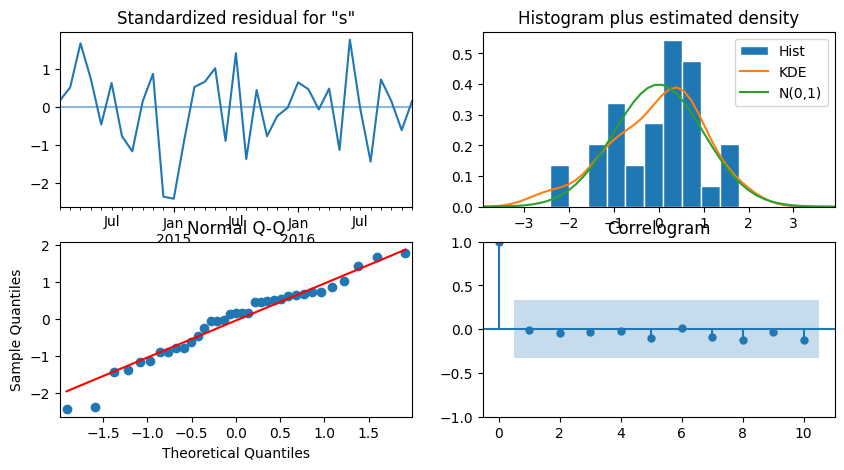

In [ ]:
result_store5.plot_diagnostics(figsize=(10,5))
plt.show()

In [ ]:
start = len(train_store5_m)
end = len(train_store5_m) + len(test_store5_m) - 1

In [ ]:
prediction_store5_m = result_store5.predict(start,end).rename('SARIMA model predictions')

Text(0.5, 1.0, 'store5 month supplies sales')

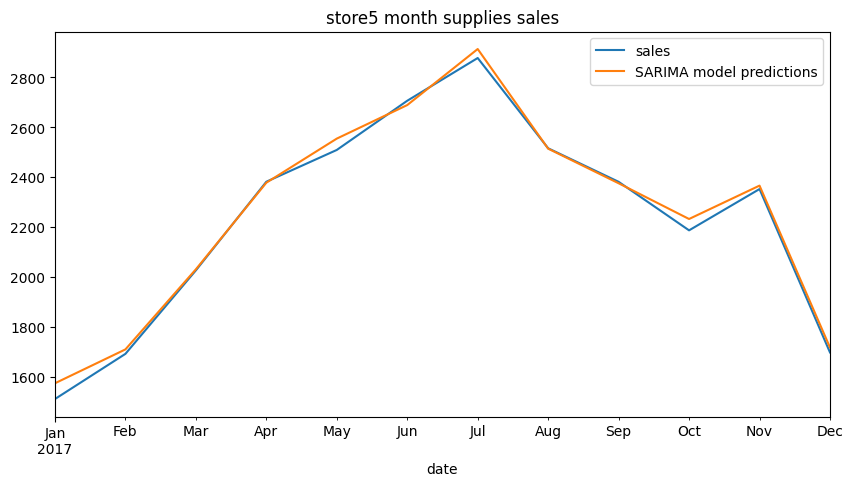

In [ ]:
test_store5_m.plot(figsize=(10,5),legend=True)
prediction_store5_m.plot(legend=True)
plt.title("store5 month supplies sales")

In [ ]:
prediction_store5_m=pd.DataFrame(prediction_store5_m)

In [ ]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse
msc5=mean_squared_error(test_store5_m,prediction_store5_m)
print('Mean_squared_error is :- ',msc5)

r5=rmse(test_store5_m,prediction_store5_m)
print('Root mean square error :-',r5)

t5 =test_store5_m.mean()
print('mean of test values :-',t5)

Mean_squared_error is :-  892.1767109728281
Root mean square error :- [29.86932726]
mean of test values :- sales    2236.334901
dtype: float64


Now lets forecast on unnknown values and visualize it

Text(0.5, 1.0, 'store5 Monthly supplies sales')

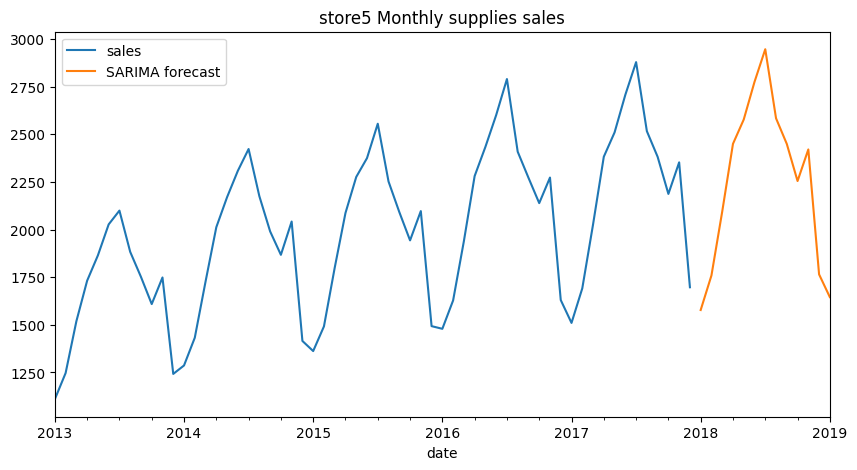

In [ ]:
#Now let us forecast into the unknown future
model_store5_m_final = SARIMAX(mstore5,order=(0, 1, 1),seasonal_order=(0, 1, 0, 12))
result_store5_m_final = model_store5_m_final.fit()
forecast_store5_m= result_store5_m_final.predict(len(mstore5),len(mstore5)+12,typ='levels').rename('SARIMA forecast')
mstore5.plot(legend=True,figsize=(10,5))
forecast_store5_m.plot(legend=True)
plt.title("store5 Monthly supplies sales")

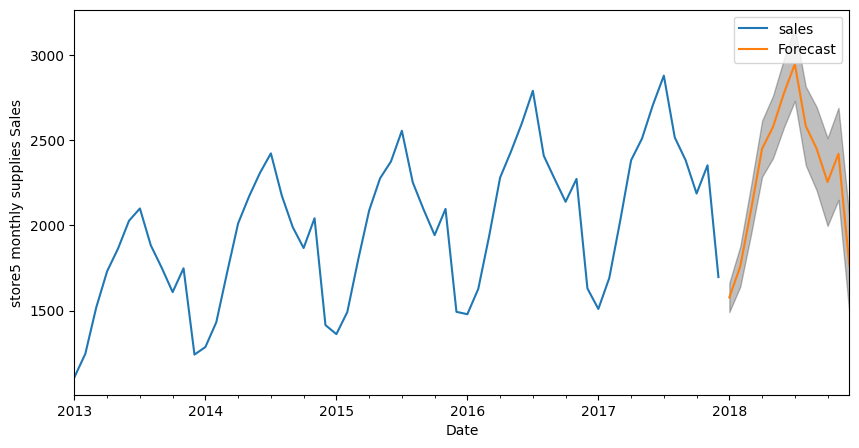

In [ ]:
pred_store5_m = result_store5_m_final.get_forecast(steps=12)
pred_ci_store5_m = pred_store5_m.conf_int()
ax = mstore5.plot(label='observed',figsize=(10,5))
pred_store5_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store5_m.index,
               pred_ci_store5_m.iloc[:,0],
               pred_ci_store5_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('store5 monthly supplies Sales')
plt.legend()
plt.show()

SARIMA MODEL for Store 6

In [ ]:
# Generate all possible combinations of p, d, q, P, D, Q
'''
q = p = range(1, 5)
d = range(1,2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]


# Perform grid search
best_aic = float('inf')
best_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(mstore6['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results = mod.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, param_seasonal)
        except:
            continue

print(f'Best AIC: {best_aic}')
print(f'Best Parameters: {best_params}')
'''

"\nq = p = range(1, 5)\nd = range(1,2)\npdq = list(itertools.product(p, d, q))\nseasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]\n\n\n# Perform grid search\nbest_aic = float('inf')\nbest_params = None\n\nfor param in pdq:\n    for param_seasonal in seasonal_pdq:\n        try:\n            mod = sm.tsa.statespace.SARIMAX(mstore6['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)\n            results = mod.fit()\n            if results.aic < best_aic:\n                best_aic = results.aic\n                best_params = (param, param_seasonal)\n        except:\n            continue\n\nprint(f'Best AIC: {best_aic}')\nprint(f'Best Parameters: {best_params}')\n"

In [ ]:
train_store6_m = mstore6.iloc[:48]
test_store6_m = mstore6.iloc[48:]

In [ ]:
model_store6= SARIMAX(train_store6_m,order=(2, 1, 1),seasonal_order=(1, 1, 1, 12),enforce_invertibility=False)
result_store6 = model_store6.fit()
result_store6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(2, 1, 1)x(1, 1, 1, 12)   Log Likelihood                -181.761
Date:                            Mon, 01 Jan 2024   AIC                            375.523
Time:                                    06:25:08   BIC                            384.855
Sample:                                01-01-2013   HQIC                           378.744
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9683      0.217     -4.456      0.000      -1.394      -0.542
ar.L2         -0.2891      0.207     -1.397      0.162      -0.695       0.117
ma.L1          0.8665      0.183      4.733      0.000       0.508       1.225
ar.S.L12       0.9927      2.078      0.478      0.633      -3.081       5.066
ma.S.L12      -0.9380      8.771     -0.107      0.915     -18.130      16.254
sigma2      1624.8697   1.07e+04      0.152      0.879   -1.93e+04    2.25e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                 1.02
Prob(Q):                              0.81   Prob(JB):                         0.60
Heteroskedasticity (H):               0.65   Skew:                            -0.30
Prob(H) (two-sided):                  0.47   Kurtosis:                         3.58
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

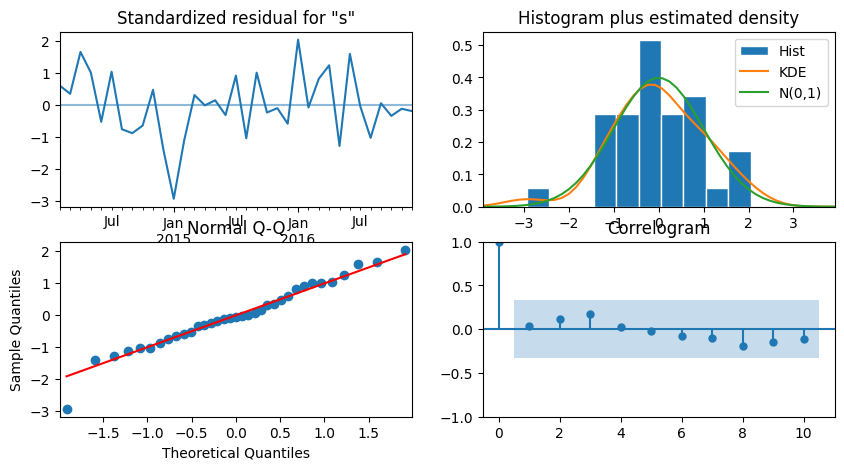

In [ ]:
result_store6.plot_diagnostics(figsize=(10,5))
plt.show()

In [ ]:
start = len(train_store6_m)
end = len(train_store6_m) + len(test_store6_m) - 1

In [ ]:
prediction_store6_m = result_store6.predict(start,end).rename('SARIMA model predictions')

Text(0.5, 1.0, 'store6 month supplies sales')

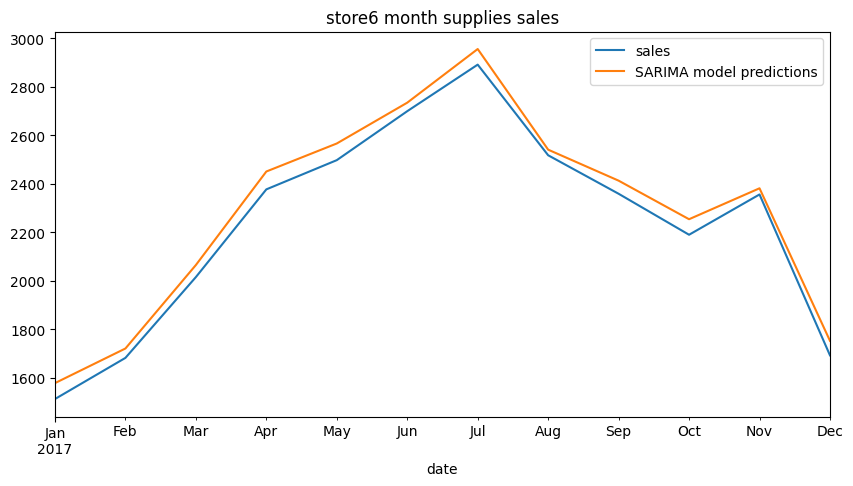

In [ ]:
test_store6_m.plot(figsize=(10,5),legend=True)
prediction_store6_m.plot(legend=True)
plt.title("store6 month supplies sales")

In [ ]:
prediction_store6_m=pd.DataFrame(prediction_store6_m)

In [ ]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse
msc6=mean_squared_error(test_store6_m,prediction_store6_m)
print('Mean_squared_error is :- ',msc6)

r6=rmse(test_store6_m,prediction_store6_m)
print('Root mean square error :-',r6)

t6 =test_store6_m.mean()
print('mean of test values :-',t6)

Mean_squared_error is :-  2963.688415062353
Root mean square error :- [54.43976869]
mean of test values :- sales    2233.088671
dtype: float64


Now lets forecast on unnknown values and visualize it

Text(0.5, 1.0, 'store6 Monthly supplies sales')

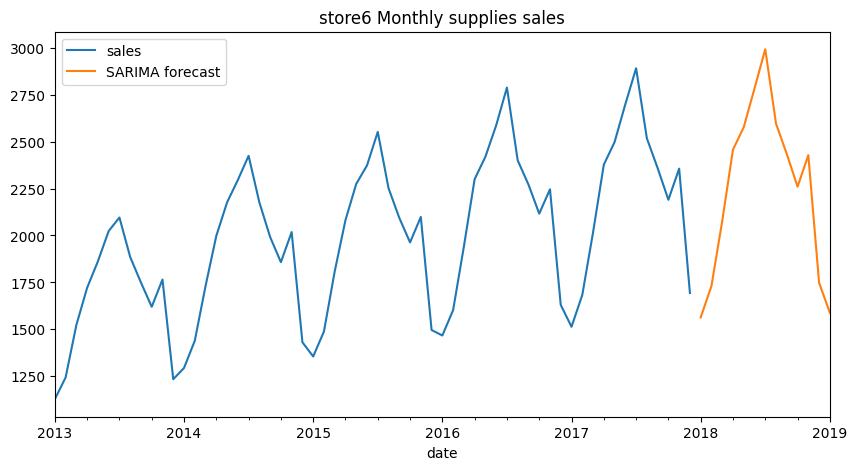

In [ ]:
#Now let us forecast into the unknown future
model_store6_m_final = SARIMAX(mstore6,order=(2, 1, 1),seasonal_order=(1, 1, 1, 12))
result_store6_m_final = model_store6_m_final.fit()
forecast_store6_m= result_store6_m_final.predict(len(mstore6),len(mstore6)+12,typ='levels').rename('SARIMA forecast')
mstore6.plot(legend=True,figsize=(10,5))
forecast_store6_m.plot(legend=True)
plt.title("store6 Monthly supplies sales")

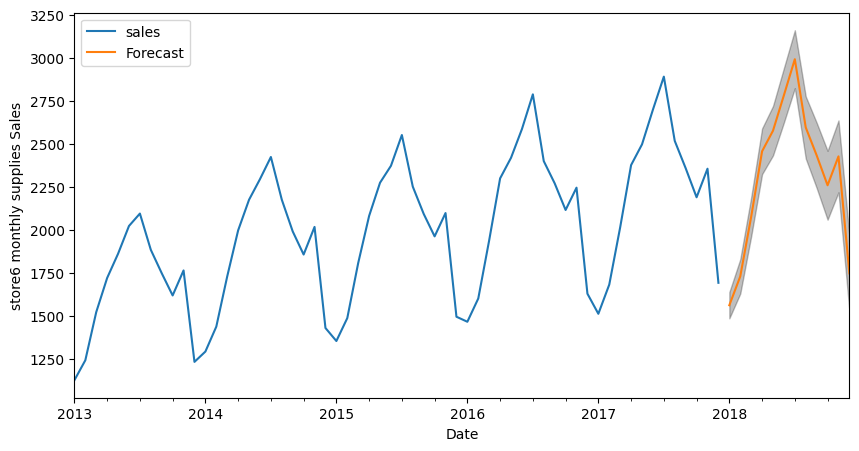

In [ ]:
pred_store6_m = result_store6_m_final.get_forecast(steps=12)
pred_ci_store6_m = pred_store6_m.conf_int()
ax = mstore6.plot(label='observed',figsize=(10,5))
pred_store6_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store6_m.index,
               pred_ci_store6_m.iloc[:,0],
               pred_ci_store6_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('store6 monthly supplies Sales')
plt.legend()
plt.show()

SARIMA MODEL for Store 7

In [ ]:
# Generate all possible combinations of p, d, q, P, D, Q
'''
q = p = range(1, 5)
d = range(1,2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]


# Perform grid search
best_aic = float('inf')
best_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(mstore7['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results = mod.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, param_seasonal)
        except:
            continue

print(f'Best AIC: {best_aic}')
print(f'Best Parameters: {best_params}')
'''

"\nq = p = range(1, 5)\nd = range(1,2)\npdq = list(itertools.product(p, d, q))\nseasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]\n\n\n# Perform grid search\nbest_aic = float('inf')\nbest_params = None\n\nfor param in pdq:\n    for param_seasonal in seasonal_pdq:\n        try:\n            mod = sm.tsa.statespace.SARIMAX(mstore7['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)\n            results = mod.fit()\n            if results.aic < best_aic:\n                best_aic = results.aic\n                best_params = (param, param_seasonal)\n        except:\n            continue\n\nprint(f'Best AIC: {best_aic}')\nprint(f'Best Parameters: {best_params}')\n"

In [ ]:
train_store7_m = mstore7.iloc[:48]
test_store7_m = mstore7.iloc[48:]

In [ ]:
model_store7= SARIMAX(train_store7_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12),enforce_invertibility=False)
result_store7 = model_store7.fit()
result_store7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -178.510
Date:                            Mon, 01 Jan 2024   AIC                            371.019
Time:                                    06:25:18   BIC                            381.907
Sample:                                01-01-2013   HQIC                           374.778
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0649      0.217     -0.300      0.764      -0.489       0.360
ma.L2         -0.0567      0.350     -0.162      0.871      -0.743       0.630
ma.L3          0.1078      0.291      0.371      0.711      -0.462       0.678
ma.S.L12       0.3766    113.697      0.003      0.997    -222.466     223.219
ma.S.L24       0.4145    167.815      0.002      0.998    -328.497     329.326
ma.S.L36      -0.4888    151.415     -0.003      0.997    -297.256     296.278
sigma2      1049.9291   2.52e+05      0.004      0.997   -4.93e+05    4.95e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 4.68
Prob(Q):                              1.00   Prob(JB):                         0.10
Heteroskedasticity (H):               0.63   Skew:                            -0.83
Prob(H) (two-sided):                  0.44   Kurtosis:                         3.69
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

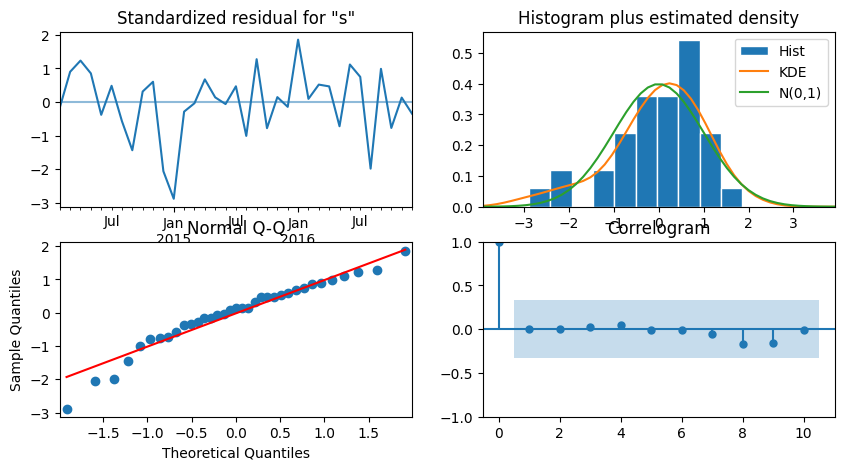

In [ ]:
result_store7.plot_diagnostics(figsize=(10,5))
plt.show()

In [ ]:
start = len(train_store7_m)
end = len(train_store7_m) + len(test_store7_m) - 1

In [ ]:
prediction_store7_m = result_store7.predict(start,end).rename('SARIMA model predictions')

Text(0.5, 1.0, 'store7 month supplies sales')

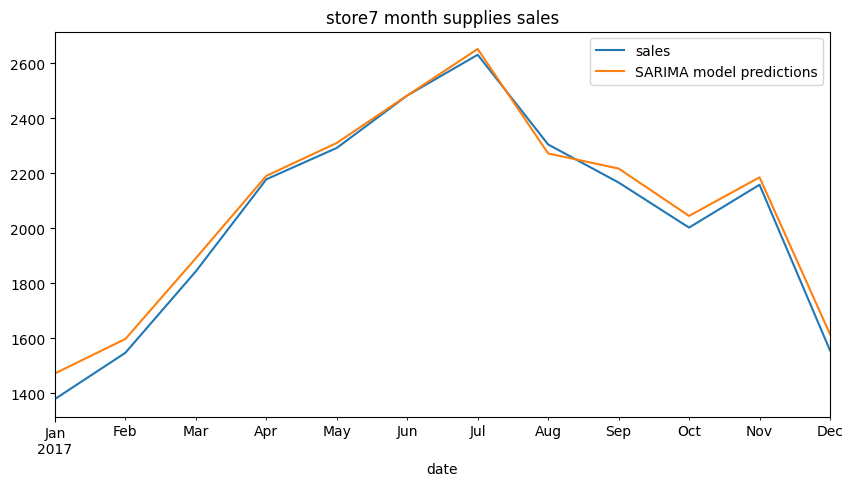

In [ ]:
test_store7_m.plot(figsize=(10,5),legend=True)
prediction_store7_m.plot(legend=True)
plt.title("store7 month supplies sales")

In [ ]:
prediction_store7_m=pd.DataFrame(prediction_store7_m)

In [ ]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse
msc7 = mean_squared_error(test_store7_m,prediction_store7_m)
print('Mean_squared_error is :- ',msc7)

r7=rmse(test_store7_m,prediction_store7_m)
print('Root mean square error :-',r7)

t7 =test_store7_m.mean()
print('mean of test values :-',t7)


Mean_squared_error is :-  2006.5385239955824
Root mean square error :- [44.79440282]
mean of test values :- sales    2045.124296
dtype: float64


Now lets forecast on unnknown values and visualize it

Text(0.5, 1.0, 'store7 Monthly supplies sales')

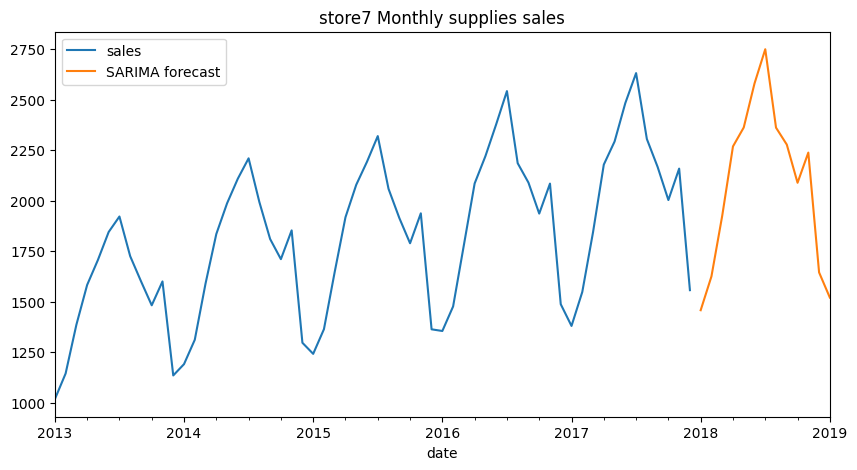

In [ ]:
#Now let us forecast into the unknown future
model_store7_m_final = SARIMAX(mstore7,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store7_m_final = model_store7_m_final.fit()
forecast_store7_m= result_store7_m_final.predict(len(mstore7),len(mstore7)+12,typ='levels').rename('SARIMA forecast')
mstore7.plot(legend=True,figsize=(10,5))
forecast_store7_m.plot(legend=True)
plt.title("store7 Monthly supplies sales")

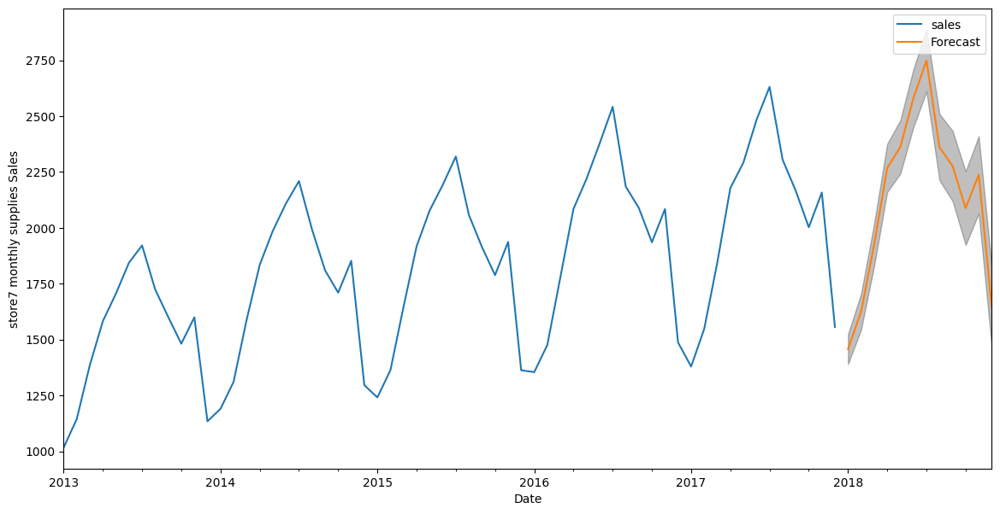

In [ ]:
pred_store7_m = result_store7_m_final.get_forecast(steps=12)
pred_ci_store7_m = pred_store7_m.conf_int()
ax = mstore7.plot(label='observed',figsize=(14,7))
pred_store7_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store7_m.index,
               pred_ci_store7_m.iloc[:,0],
               pred_ci_store7_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('store7 monthly supplies Sales')
plt.legend()
plt.show()

SARIMA MODEL for Store 8

In [ ]:
# Generate all possible combinations of p, d, q, P, D, Q
'''
q = p = range(1, 5)
d = range(1,2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]


# Perform grid search
best_aic = float('inf')
best_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(mstore8['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results = mod.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, param_seasonal)
        except:
            continue

print(f'Best AIC: {best_aic}')
print(f'Best Parameters: {best_params}')
'''

"\nq = p = range(1, 5)\nd = range(1,2)\npdq = list(itertools.product(p, d, q))\nseasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]\n\n\n# Perform grid search\nbest_aic = float('inf')\nbest_params = None\n\nfor param in pdq:\n    for param_seasonal in seasonal_pdq:\n        try:\n            mod = sm.tsa.statespace.SARIMAX(mstore8['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)\n            results = mod.fit()\n            if results.aic < best_aic:\n                best_aic = results.aic\n                best_params = (param, param_seasonal)\n        except:\n            continue\n\nprint(f'Best AIC: {best_aic}')\nprint(f'Best Parameters: {best_params}')\n"

In [ ]:
train_store8_m = mstore8.iloc[:48]
test_store8_m = mstore8.iloc[48:]

In [ ]:
model_store8= SARIMAX(train_store8_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12),enforce_invertibility=False)
result_store8 = model_store8.fit()
result_store8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -195.934
Date:                            Mon, 01 Jan 2024   AIC                            405.867
Time:                                    06:25:26   BIC                            416.755
Sample:                                01-01-2013   HQIC                           409.626
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.0096      0.159      0.060      0.952      -0.301       0.320
ma.L2         -0.1982      0.189     -1.049      0.294      -0.568       0.172
ma.L3          0.2836      0.222      1.277      0.202      -0.152       0.719
ma.S.L12       0.1471      9.214      0.016      0.987     -17.911      18.205
ma.S.L24       0.6253     18.811      0.033      0.973     -36.243      37.494
ma.S.L36      -0.2217     18.047     -0.012      0.990     -35.593      35.150
sigma2      3059.6159   7.14e+04      0.043      0.966   -1.37e+05    1.43e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 0.87
Prob(Q):                              1.00   Prob(JB):                         0.65
Heteroskedasticity (H):               0.57   Skew:                            -0.36
Prob(H) (two-sided):                  0.34   Kurtosis:                         2.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

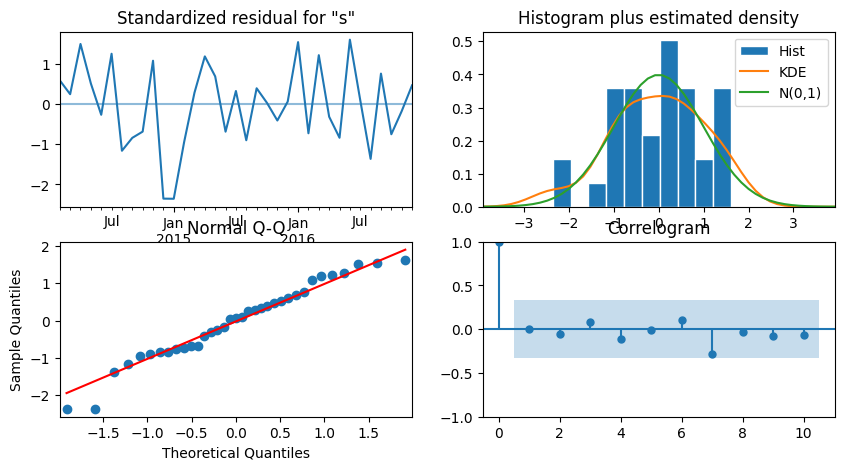

In [ ]:
result_store8.plot_diagnostics(figsize=(10,5))
plt.show()

In [ ]:
start = len(train_store8_m)
end = len(train_store8_m) + len(test_store8_m) - 1

In [ ]:
prediction_store8_m = result_store8.predict(start,end).rename('SARIMA model predictions')

Text(0.5, 1.0, 'store8 month supplies sales')

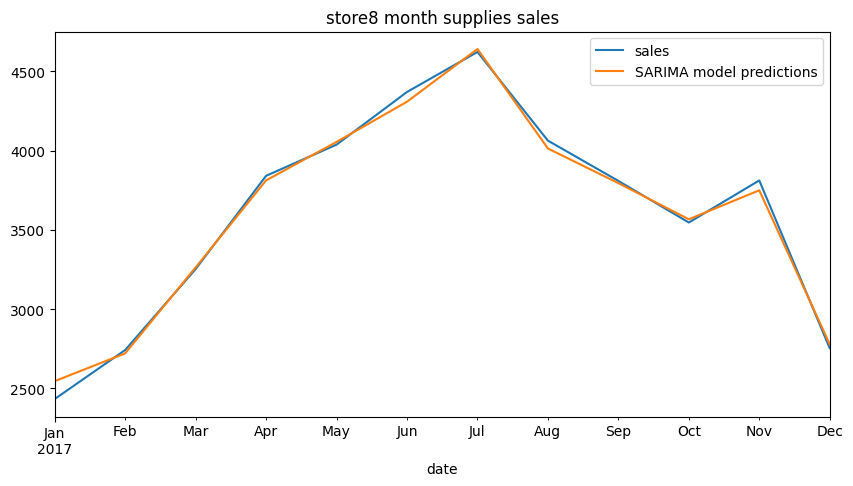

In [ ]:
test_store8_m.plot(figsize=(10,5),legend=True)
prediction_store8_m.plot(legend=True)
plt.title("store8 month supplies sales")

In [ ]:
prediction_store8_m=pd.DataFrame(prediction_store8_m)

In [ ]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse
msc8=mean_squared_error(test_store8_m,prediction_store8_m)
print('Mean_squared_error is :- ',msc8)

r8=rmse(test_store8_m,prediction_store8_m)
print('Root mean square error :-',r8)

t8 =test_store8_m.mean()
print('mean of test values :-',t8)

Mean_squared_error is :-  2175.008080356403
Root mean square error :- [46.6369819]
mean of test values :- sales    3607.358916
dtype: float64


Now lets forecast on unnknown values and visualize it

Text(0.5, 1.0, 'store8 Monthly supplies sales')

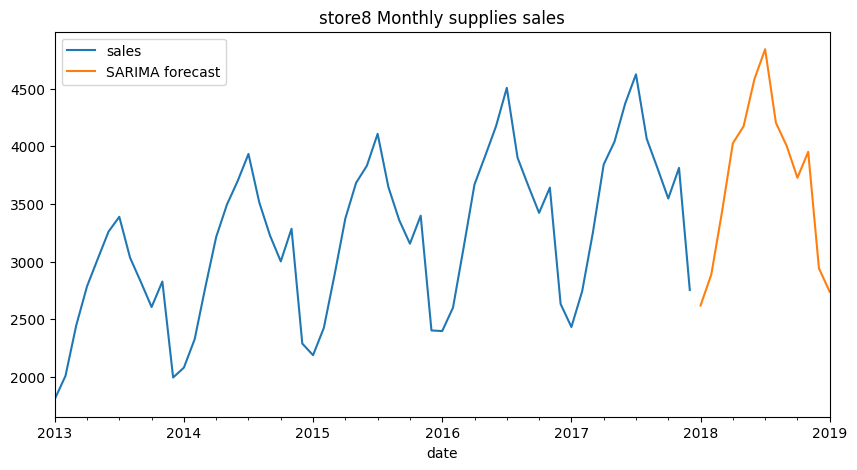

In [ ]:
#Now let us forecast into the unknown future
model_store8_m_final = SARIMAX(mstore8,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store8_m_final = model_store8_m_final.fit()
forecast_store8_m= result_store8_m_final.predict(len(mstore8),len(mstore8)+12,typ='levels').rename('SARIMA forecast')
mstore8.plot(legend=True,figsize=(10,5))
forecast_store8_m.plot(legend=True)
plt.title("store8 Monthly supplies sales")

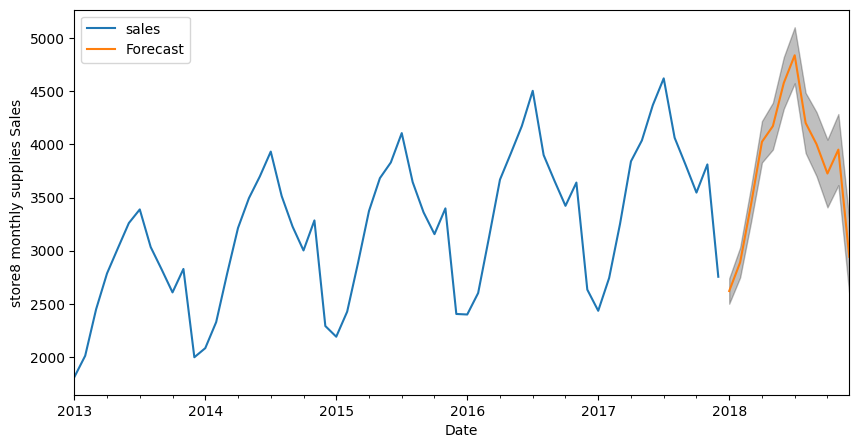

In [ ]:
pred_store8_m = result_store8_m_final.get_forecast(steps=12)
pred_ci_store8_m = pred_store8_m.conf_int()
ax = mstore8.plot(label='observed',figsize=(10,5))
pred_store8_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store8_m.index,
               pred_ci_store8_m.iloc[:,0],
               pred_ci_store8_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('store8 monthly supplies Sales')
plt.legend()
plt.show()

SARIMA MODEL for Store 9

In [ ]:
# Generate all possible combinations of p, d, q, P, D, Q
'''
q = p = range(1, 5)
d = range(1,2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]


# Perform grid search
best_aic = float('inf')
best_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(mstore9['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results = mod.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, param_seasonal)
        except:
            continue

print(f'Best AIC: {best_aic}')
print(f'Best Parameters: {best_params}')
'''

"\nq = p = range(1, 5)\nd = range(1,2)\npdq = list(itertools.product(p, d, q))\nseasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]\n\n\n# Perform grid search\nbest_aic = float('inf')\nbest_params = None\n\nfor param in pdq:\n    for param_seasonal in seasonal_pdq:\n        try:\n            mod = sm.tsa.statespace.SARIMAX(mstore9['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)\n            results = mod.fit()\n            if results.aic < best_aic:\n                best_aic = results.aic\n                best_params = (param, param_seasonal)\n        except:\n            continue\n\nprint(f'Best AIC: {best_aic}')\nprint(f'Best Parameters: {best_params}')\n"

In [ ]:
train_store9_m = mstore9.iloc[:48]
test_store9_m = mstore9.iloc[48:]

In [ ]:
model_store9= SARIMAX(train_store9_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12),enforce_invertibility=False)
result_store9 = model_store9.fit()
result_store9.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -190.642
Date:                            Mon, 01 Jan 2024   AIC                            395.283
Time:                                    06:25:35   BIC                            406.171
Sample:                                01-01-2013   HQIC                           399.042
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0262      0.165     -0.159      0.874      -0.349       0.297
ma.L2         -0.2150      0.179     -1.200      0.230      -0.566       0.136
ma.L3          0.3452      0.183      1.882      0.060      -0.014       0.705
ma.S.L12      -0.0391      0.297     -0.132      0.895      -0.622       0.544
ma.S.L24       0.7947      0.736      1.080      0.280      -0.648       2.237
ma.S.L36       0.4336      0.963      0.450      0.653      -1.454       2.321
sigma2      1841.1020      0.000   9.27e+06      0.000    1841.102    1841.102
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 0.82
Prob(Q):                              1.00   Prob(JB):                         0.66
Heteroskedasticity (H):               0.75   Skew:                            -0.25
Prob(H) (two-sided):                  0.62   Kurtosis:                         2.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.55e+22. Standard errors may be unstable.
"""

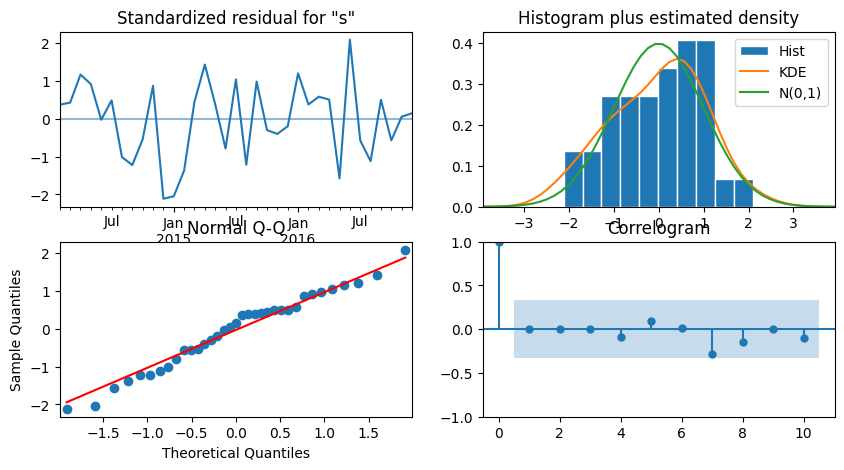

In [ ]:
result_store9.plot_diagnostics(figsize=(10,5))
plt.show()

In [ ]:
start = len(train_store9_m)
end = len(train_store9_m) + len(test_store9_m) - 1

In [ ]:
prediction_store9_m = result_store9.predict(start,end).rename('SARIMA model predictions')

Text(0.5, 1.0, 'store9 month supplies sales')

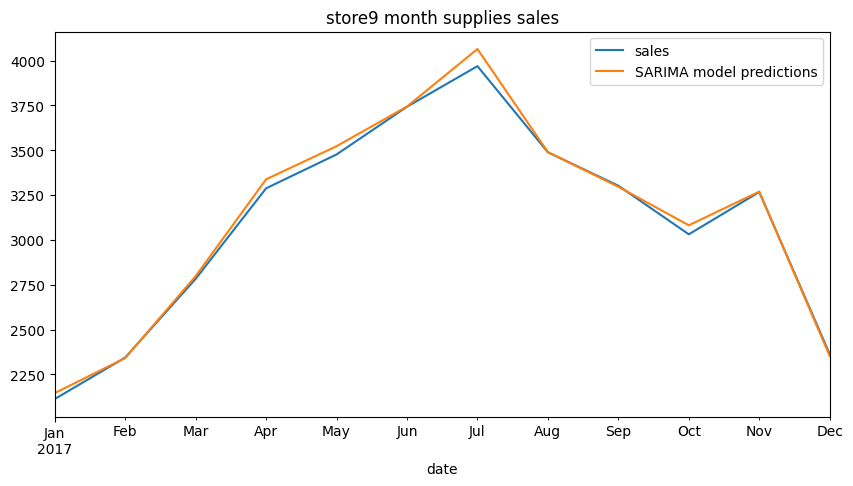

In [ ]:
test_store9_m.plot(figsize=(10,5),legend=True)
prediction_store9_m.plot(legend=True)
plt.title("store9 month supplies sales")

In [ ]:
prediction_store9_m=pd.DataFrame(prediction_store9_m)

In [ ]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse
msc9=mean_squared_error(test_store9_m,prediction_store9_m)
print('Mean_squared_error is :- ',msc9)

r9=rmse(test_store9_m,prediction_store9_m)
print('Root mean square error :-',r9)

t9 =test_store9_m.mean()
print('mean of test values :-',t9)

Mean_squared_error is :-  1480.1789522737715
Root mean square error :- [38.47309387]
mean of test values :- sales    3097.281746
dtype: float64


Now lets forecast on unnknown values and visualize it

Text(0.5, 1.0, 'store9 Monthly supplies sales')

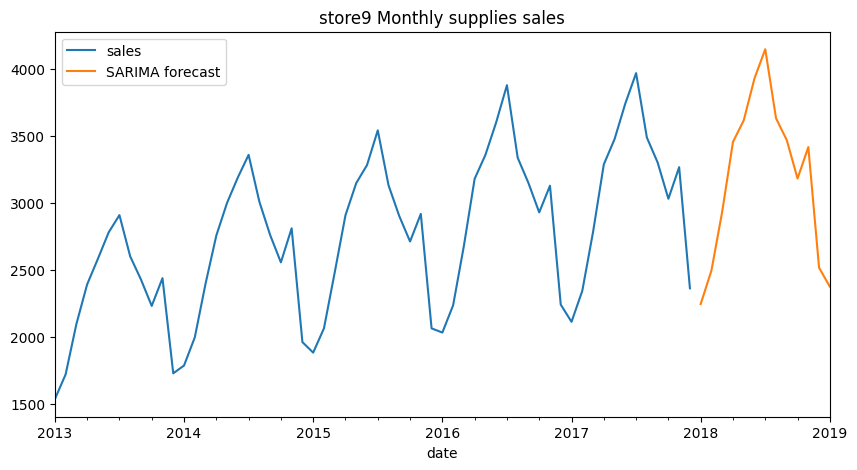

In [ ]:
#Now let us forecast into the unknown future
model_store9_m_final = SARIMAX(mstore9,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store9_m_final = model_store9_m_final.fit()
forecast_store9_m= result_store9_m_final.predict(len(mstore9),len(mstore9)+12,typ='levels').rename('SARIMA forecast')
mstore9.plot(legend=True,figsize=(10,5))
forecast_store9_m.plot(legend=True)
plt.title("store9 Monthly supplies sales")

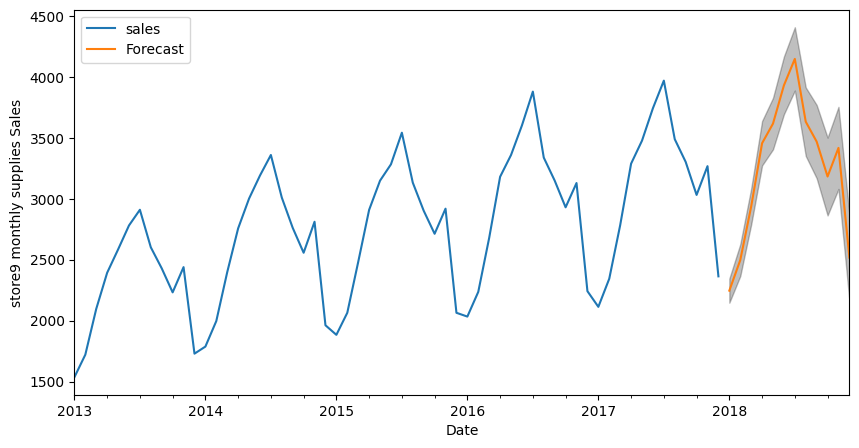

In [ ]:
pred_store9_m = result_store9_m_final.get_forecast(steps=12)
pred_ci_store9_m = pred_store9_m.conf_int()
ax = mstore9.plot(label='observed',figsize=(10,5))
pred_store9_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store9_m.index,
               pred_ci_store9_m.iloc[:,0],
               pred_ci_store9_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('store9 monthly supplies Sales')
plt.legend()
plt.show()

SARIMA MODEL for Store 10

In [ ]:
# Generate all possible combinations of p, d, q, P, D, Q
'''
q = d = p = range(0, 4)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]


# Perform grid search
best_aic = float('inf')
best_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(mstore10['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results = mod.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, param_seasonal)
        except:
            continue

print(f'Best AIC: {best_aic}')
print(f'Best Parameters: {best_params}')
'''

"\nq = d = p = range(0, 4)\npdq = list(itertools.product(p, d, q))\nseasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]\n\n\n# Perform grid search\nbest_aic = float('inf')\nbest_params = None\n\nfor param in pdq:\n    for param_seasonal in seasonal_pdq:\n        try:\n            mod = sm.tsa.statespace.SARIMAX(mstore10['sales'], order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)\n            results = mod.fit()\n            if results.aic < best_aic:\n                best_aic = results.aic\n                best_params = (param, param_seasonal)\n        except:\n            continue\n\nprint(f'Best AIC: {best_aic}')\nprint(f'Best Parameters: {best_params}')\n"

In [ ]:
train_store10_m = mstore10.iloc[:48]
test_store10_m = mstore10.iloc[48:]


In [ ]:
model_store10 = SARIMAX(train_store10_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12),enforce_invertibility=False)
result_store10 = model_store10.fit()
result_store10.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -193.167
Date:                            Mon, 01 Jan 2024   AIC                            400.334
Time:                                    06:25:41   BIC                            411.221
Sample:                                01-01-2013   HQIC                           404.092
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0538      0.153     -0.352      0.725      -0.353       0.246
ma.L2         -0.1359      0.187     -0.726      0.468      -0.503       0.231
ma.L3          0.3598      0.200      1.803      0.071      -0.031       0.751
ma.S.L12      -0.1599      3.412     -0.047      0.963      -6.848       6.528
ma.S.L24       1.0063      0.343      2.936      0.003       0.334       1.678
ma.S.L36      -0.0743      6.995     -0.011      0.992     -13.784      13.635
sigma2      1944.7676      0.000   6.68e+06      0.000    1944.767    1944.768
===================================================================================
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):                 1.33
Prob(Q):                              0.78   Prob(JB):                         0.51
Heteroskedasticity (H):               0.82   Skew:                            -0.30
Prob(H) (two-sided):                  0.74   Kurtosis:                         2.26
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.63e+24. Standard errors may be unstable.
"""

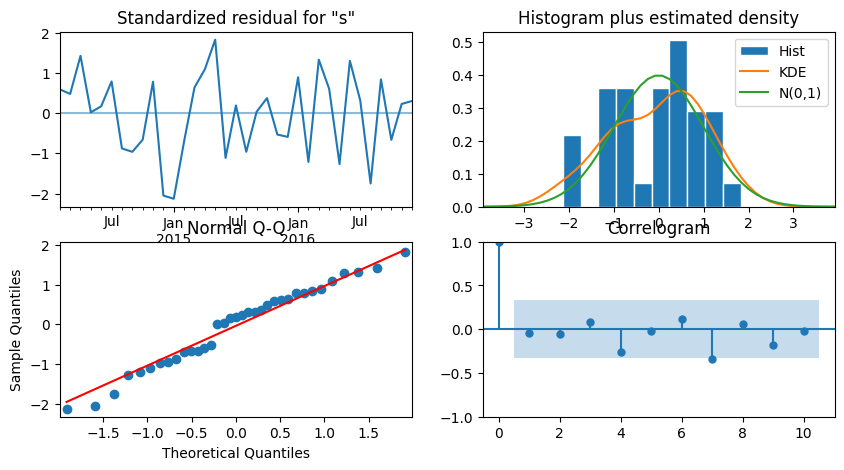

In [ ]:
result_store10.plot_diagnostics(figsize=(10,5))
plt.show()

In [ ]:
start = len(train_store10_m)
end = len(train_store10_m) + len(test_store10_m) - 1


In [ ]:
prediction_store10_m = result_store10.predict(start,end).rename('SARIMA model predictions')

Text(0.5, 1.0, 'store10 month supplies sales')

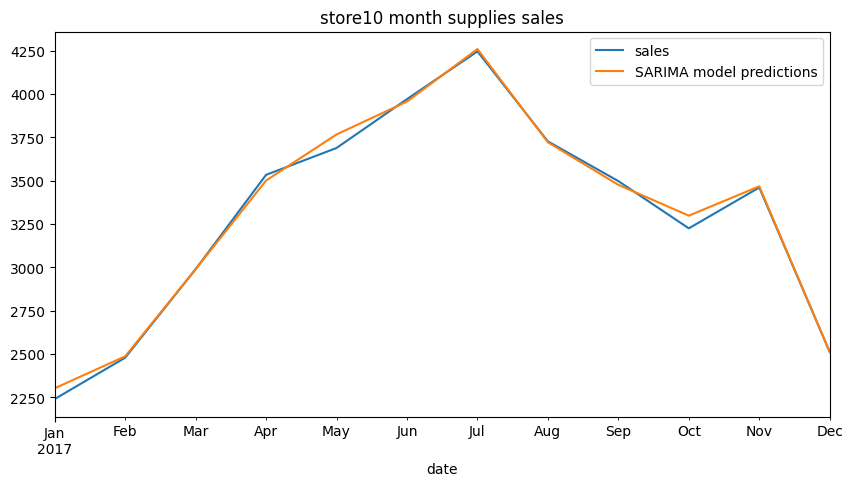

In [ ]:
test_store10_m.plot(figsize=(10,5),legend=True)
prediction_store10_m.plot(legend=True)
plt.title("store10 month supplies sales")

In [ ]:
prediction_store10_m=pd.DataFrame(prediction_store10_m)

In [ ]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse
msc10 =mean_squared_error(test_store10_m,prediction_store10_m)
print('Mean_squared_error is :- ',msc10)

r10=rmse(test_store10_m,prediction_store10_m)
print('Root mean square error :-',r10)

t10 =test_store10_m.mean()
print('mean of test values :-',t10)

Mean_squared_error is :-  1450.9025538560447
Root mean square error :- [38.0907148]
mean of test values :- sales    3297.260183
dtype: float64


Now lets forecast on unnknown values and visualize it

Text(0.5, 1.0, 'store10 Monthly supplies sales')

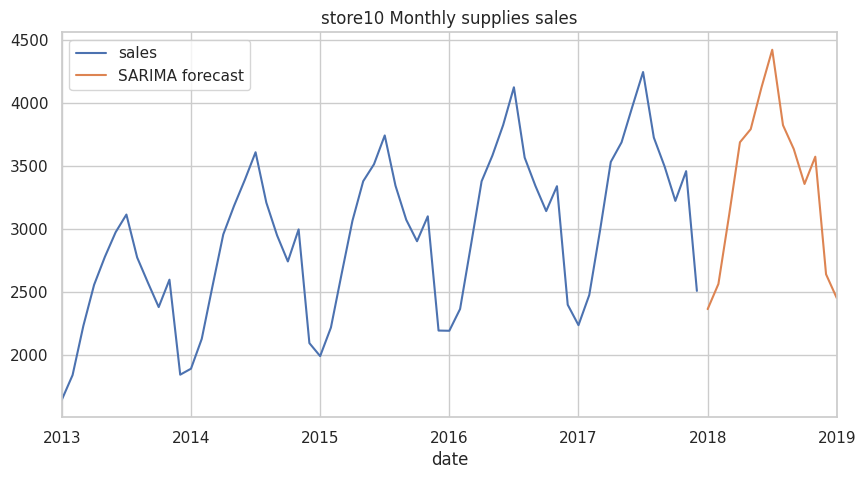

In [ ]:
#Now let us forecast into the unknown future
model_store10_m_final = SARIMAX(mstore10,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store10_m_final = model_store10_m_final.fit()
forecast_store10_m= result_store10_m_final.predict(len(mstore10),len(mstore10)+12,typ='levels').rename('SARIMA forecast')
mstore10.plot(legend=True,figsize=(10,5))
forecast_store10_m.plot(legend=True)
plt.title("store10 Monthly supplies sales")

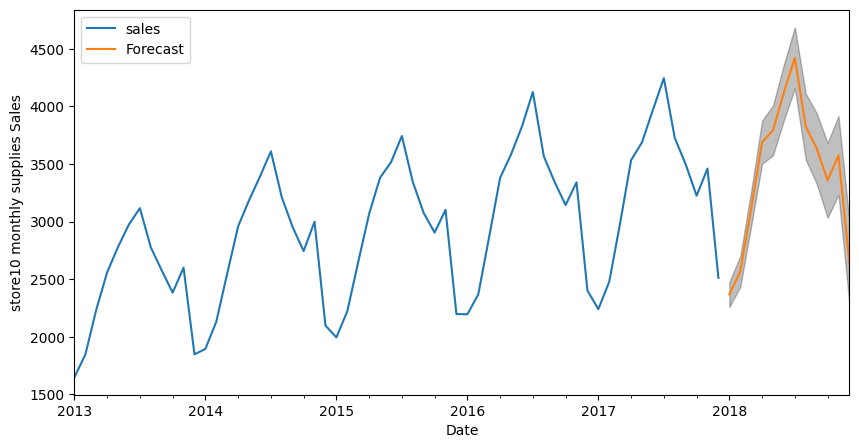

In [ ]:
pred_store10_m = result_store10_m_final.get_forecast(steps=12)
pred_ci_store10_m = pred_store10_m.conf_int()
ax = mstore10.plot(label='observed',figsize=(10,5))
pred_store10_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store10_m.index,
               pred_ci_store10_m.iloc[:,0],
               pred_ci_store10_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('store10 monthly supplies Sales')
plt.legend()
plt.show()

In [ ]:
sarimax_model = pd.DataFrame({
    'Model Name' : ['Store 1','Store 2','Store 3','Store 4','Store 5','Store 6','Store 7','Store 8','Store 9','Store 10' ],
    'MSE values' : [msc1,msc2,msc3,msc4,msc5,msc6,msc7,msc8,msc9,msc10],
    'RMSE values' : [r1,r2,r3,r4,r5,r6,r7,r8,r9,r10],
    'Mean Vales' : [t1[0],t2[0],t3[0],t4[0],t5[0],t6[0],t7[0],t8[0],t9[0],t10[0]]
})
sarimax_model.set_index('Model Name')

,MSE values,RMSE values,Mean Vales
Model Name,,,
Store 1,1229.762730,[35.06797299047697],2659.885305
Store 2,2192.895225,[46.82835919846785],3767.342921
Store 3,1958.092550,[44.25033954452312],3350.165559
Store 4,866.431842,[29.435214322353197],3085.820897
Store 5,892.176711,[29.86932726013139],2236.334901
Store 6,2963.688415,[54.43976869038252],2233.088671
Store 7,2006.538524,[44.79440281994596],2045.124296
Store 8,2175.008080,[46.63698189587747],3607.358916
Store 9,1480.178952,[38.473093874469875],3097.281746


Overall Impression:





* Stores 4 and 5 showcase better performanc
in terms of MSE and RMSE. Store 5 particularly shows lower errors and lower mean values, indicating better predictive accuracy and potentially lower variability in sales compared to other stores.
* Store 7 has a relatively higher MSE and RMSE, indicating higher errors in predictions compared to some other stores. However, its mean value seems to be close to its predicted values.

##2.Holt Winter’s Exponential Smoothing (HWES)

In [ ]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_error,mean_squared_error
from statsmodels.tools.eval_measures import rmse

Model for Store 1

In [ ]:
train_hwes1 = mstore1.iloc[:48]
test_hwes1 = mstore1.iloc[48:]

In [ ]:
hwes1 = ExponentialSmoothing(train_hwes1, seasonal_periods=12, trend='add', seasonal='add').fit()

Text(0.5, 1.0, 'Store 1 month supplies sales')

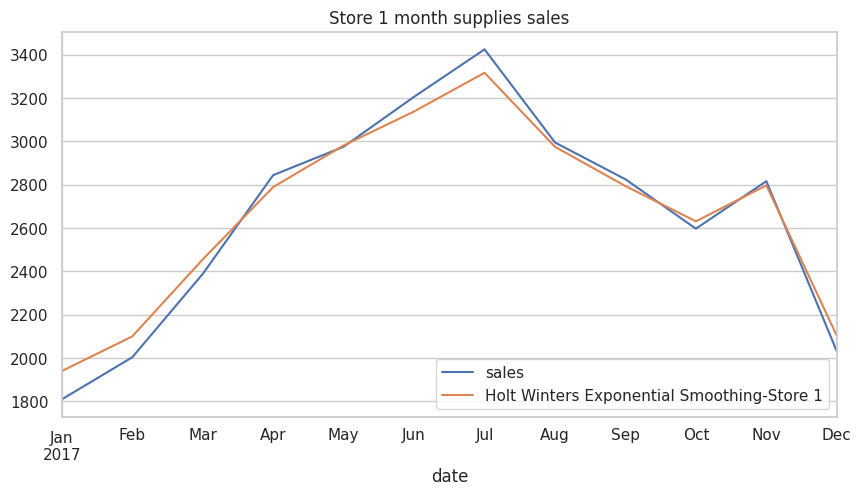

In [ ]:
pred1 = hwes1.forecast(12).rename('Holt Winters Exponential Smoothing-Store 1')
test_hwes1.plot(figsize=(10,5),legend=True)
pred1.plot(legend=True)
plt.title("Store 1 month supplies sales")

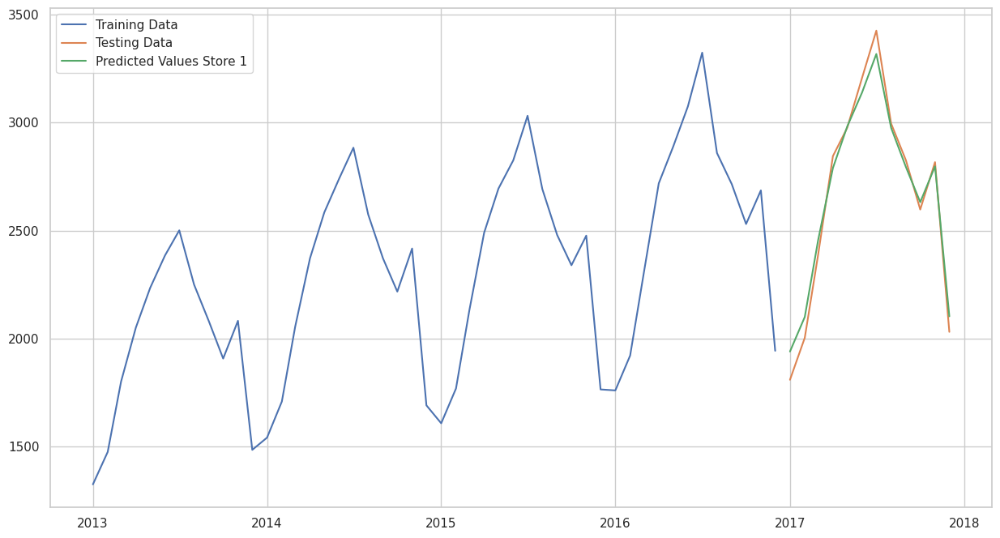

In [ ]:
plt.plot(train_hwes1.index, train_hwes1.values, label='Training Data ')
plt.plot(test_hwes1.index, test_hwes1.values, label='Testing Data')
plt.plot(pred1.index, pred1.values, label='Predicted Values Store 1')
plt.legend(loc='best')
plt.show()

In [ ]:
pred1=pd.DataFrame(pred1)

In [ ]:
esma1=mean_absolute_error(test_hwes1 ,pred1)
print('Mean absolute error ',esma1)
esmh1=mean_squared_error(test_hwes1 ,pred1)
print('Mean squared error',esmh1)
esrh1=rmse(test_hwes1 ,pred1)
print('Root-mean squared error',esrh1)

Mean absolute error  58.98660405267068
Mean squared error 4861.69045122786
Root-mean squared error [867.44047126 740.09363221 525.3385415  501.01396856 581.16073344
 680.69786434 816.35003188 577.7100418  502.23113646 484.80608692
 503.0394575  737.95028769]


Model for Store 2

In [ ]:
train_hwes2 = mstore2.iloc[:48]
test_hwes2 = mstore2.iloc[48:]

In [ ]:
hwes2 = ExponentialSmoothing(train_hwes2, seasonal_periods=12, trend='add', seasonal='add').fit()

Text(0.5, 1.0, 'Store 2 month supplies sales')

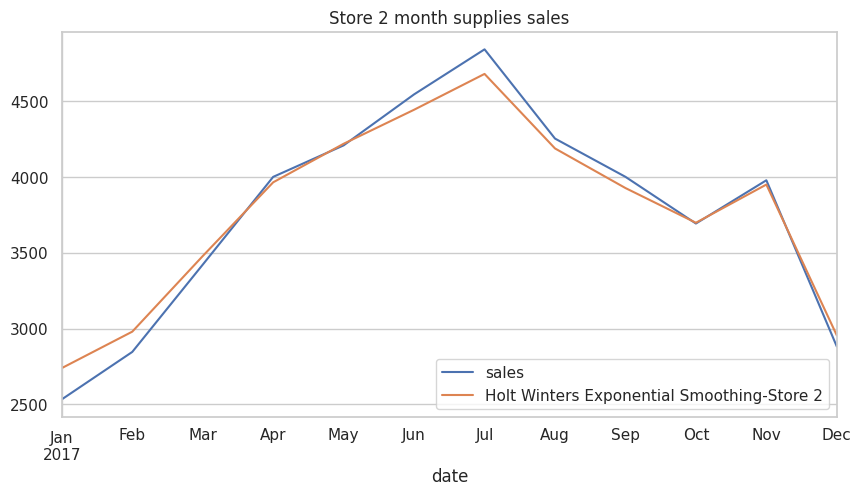

In [ ]:
pred2 = hwes2.forecast(12).rename('Holt Winters Exponential Smoothing-Store 2')
test_hwes2.plot(figsize=(10,5),legend=True)
pred2.plot(legend=True)
plt.title("Store 2 month supplies sales")

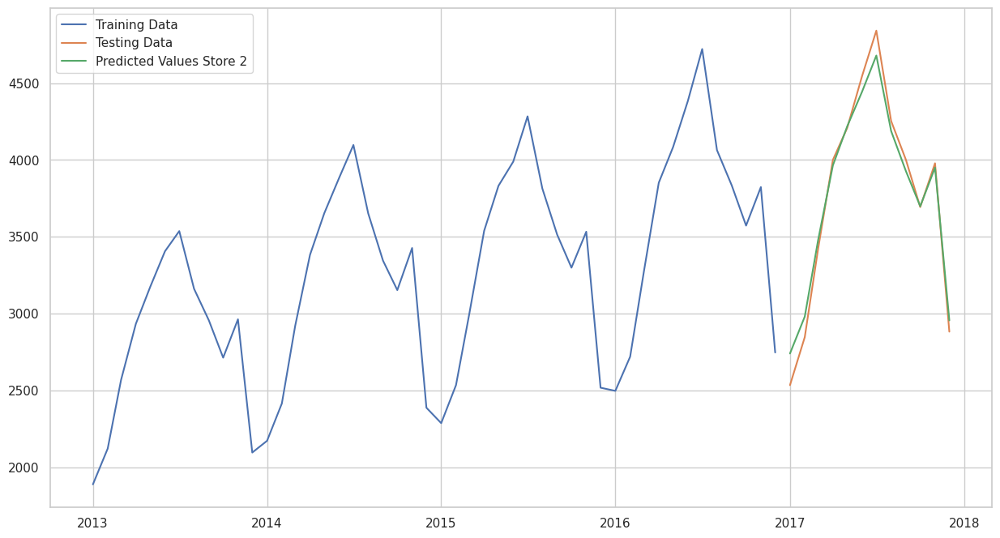

In [ ]:
plt.plot(train_hwes2.index, train_hwes2.values, label='Training Data ')
plt.plot(test_hwes2.index, test_hwes2.values, label='Testing Data')
plt.plot(pred2.index, pred2.values, label='Predicted Values Store 2')
plt.legend(loc='best')
plt.show()

In [ ]:
pred2=pd.DataFrame(pred2)

In [ ]:
esma2=mean_absolute_error(test_hwes2 ,pred2)
print('Mean absolute error ',esma2)
esmh2=mean_squared_error(test_hwes2 ,pred2)
print('Mean squared error',esmh2)
esrh2=rmse(test_hwes2 ,pred2)
print('Root-mean squared error',esrh2)

Mean absolute error  79.35790455090402
Mean squared error 9789.374827826663
Root-mean squared error [98.94126959]


Model for Store 3

In [ ]:
train_hwes3 = mstore3.iloc[:48]
test_hwes3 = mstore3.iloc[48:]

In [ ]:
hwes3 = ExponentialSmoothing(train_hwes3, seasonal_periods=12, trend='add', seasonal='add').fit()

Text(0.5, 1.0, 'Store 3 month supplies sales')

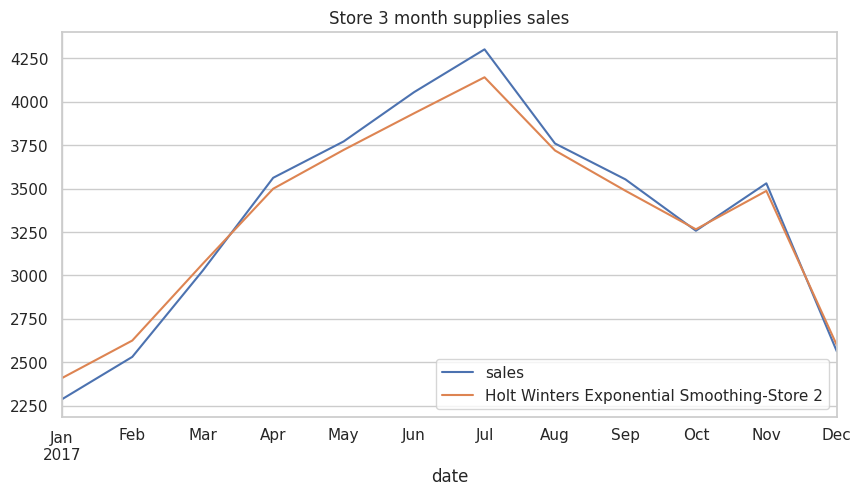

In [ ]:
pred3 = hwes3.forecast(12).rename('Holt Winters Exponential Smoothing-Store 2')
test_hwes3.plot(figsize=(10,5),legend=True)
pred3.plot(legend=True)
plt.title("Store 3 month supplies sales")

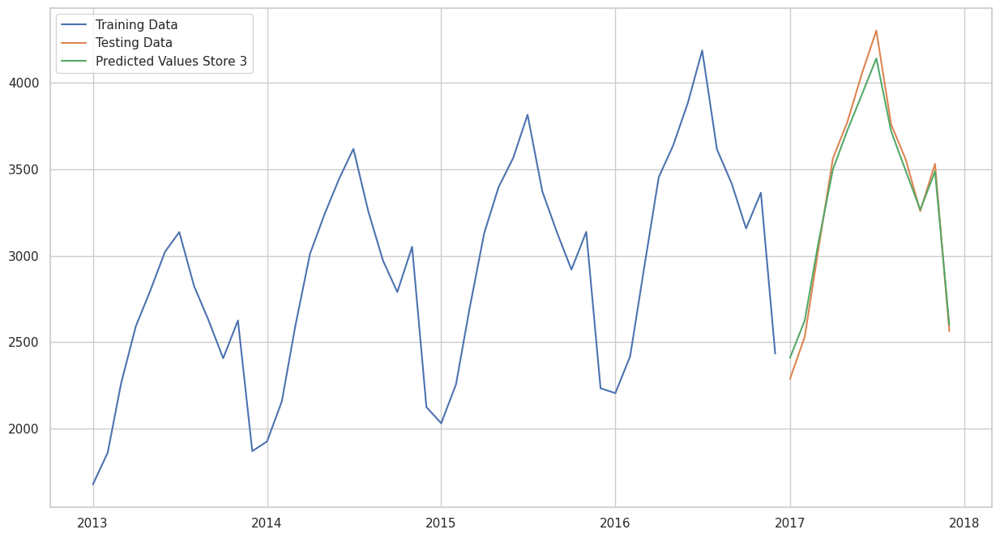

In [ ]:
plt.plot(train_hwes3.index, train_hwes3.values, label='Training Data ')
plt.plot(test_hwes3.index, test_hwes3.values, label='Testing Data')
plt.plot(pred3.index, pred3.values, label='Predicted Values Store 3')
plt.legend(loc='best')
plt.show()

In [ ]:
pred3=pd.DataFrame(pred3)

In [ ]:
esma3=mean_absolute_error(test_hwes3 ,pred3)
print('Mean absolute error ',esma3)
esmh3=mean_squared_error(test_hwes3 ,pred3)
print('Mean squared error',esmh3)
esrh3=rmse(test_hwes3 ,pred3)
print('Root-mean squared error',esrh3)

Mean absolute error  70.32098852521294
Mean squared error 6794.617997334278
Root-mean squared error [82.42947287]


Model for Store 4

In [ ]:
train_hwes4 = mstore4.iloc[:48]
test_hwes4 = mstore4.iloc[48:]

In [ ]:
hwes4 = ExponentialSmoothing(train_hwes4, seasonal_periods=12, trend='add', seasonal='add').fit()

Text(0.5, 1.0, 'Store 4 month supplies sales')

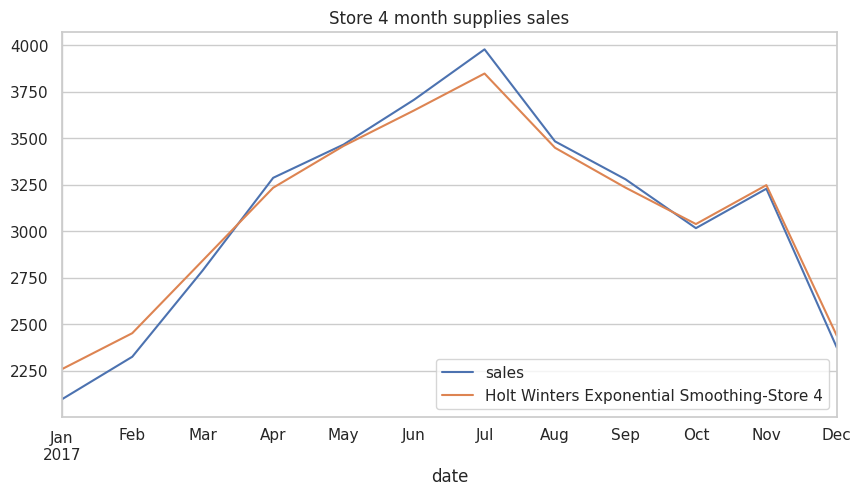

In [ ]:
pred4 = hwes4.forecast(12).rename('Holt Winters Exponential Smoothing-Store 4')
test_hwes4.plot(figsize=(10,5),legend=True)
pred4.plot(legend=True)
plt.title("Store 4 month supplies sales")


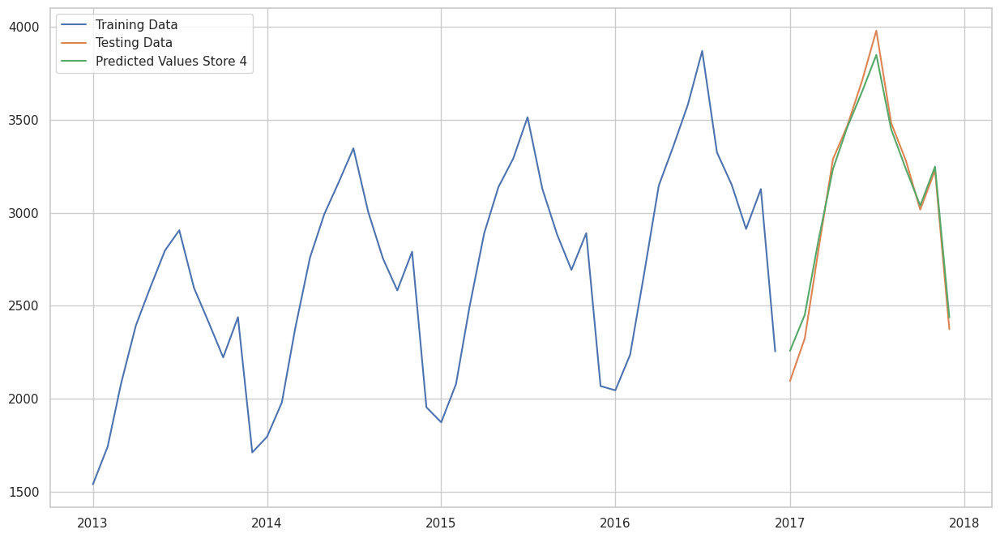

In [ ]:
plt.plot(train_hwes4.index, train_hwes4.values, label='Training Data ')
plt.plot(test_hwes4.index, test_hwes4.values, label='Testing Data')
plt.plot(pred4.index, pred4.values, label='Predicted Values Store 4')
plt.legend(loc='best')
plt.show()

In [ ]:
pred4 = pd.DataFrame(pred4)

In [ ]:
esma4 = mean_absolute_error(test_hwes4 ,pred4)
print('Mean absolute error ',esma4)
esmh4=mean_squared_error(test_hwes4 ,pred4)
print('Mean squared error',esmh4)
esrh4=rmse(test_hwes4 ,pred4)
print('Root-mean squared error',esrh4)

Mean absolute error  64.63014859986852
Mean squared error 6379.797449164235
Root-mean squared error [79.87363426]


Model for Store 5

In [ ]:
train_hwes5 = mstore5.iloc[:48]
test_hwes5 = mstore5.iloc[48:]

In [ ]:
hwes5 = ExponentialSmoothing(train_hwes5, seasonal_periods=12, trend='add', seasonal='add').fit()

Text(0.5, 1.0, 'Store 5 month supplies sales')

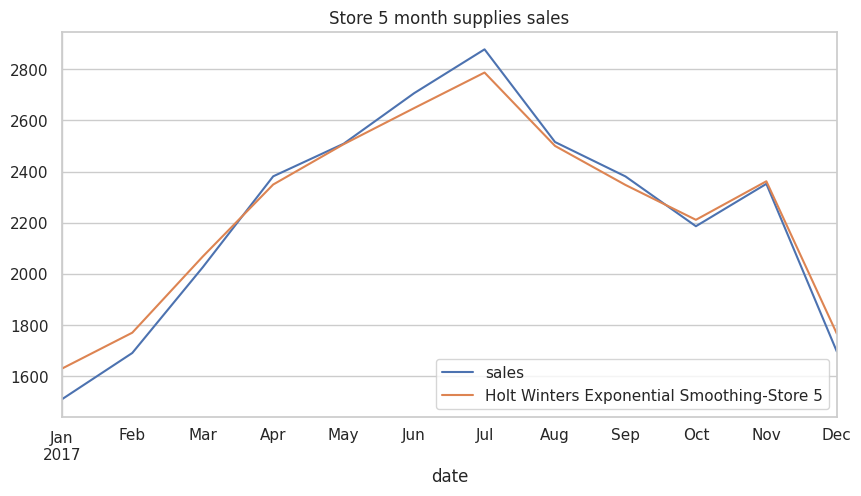

In [ ]:
pred5 = hwes5.forecast(12).rename('Holt Winters Exponential Smoothing-Store 5')
test_hwes5.plot(figsize=(10,5),legend=True)
pred5.plot(legend=True)
plt.title("Store 5 month supplies sales")

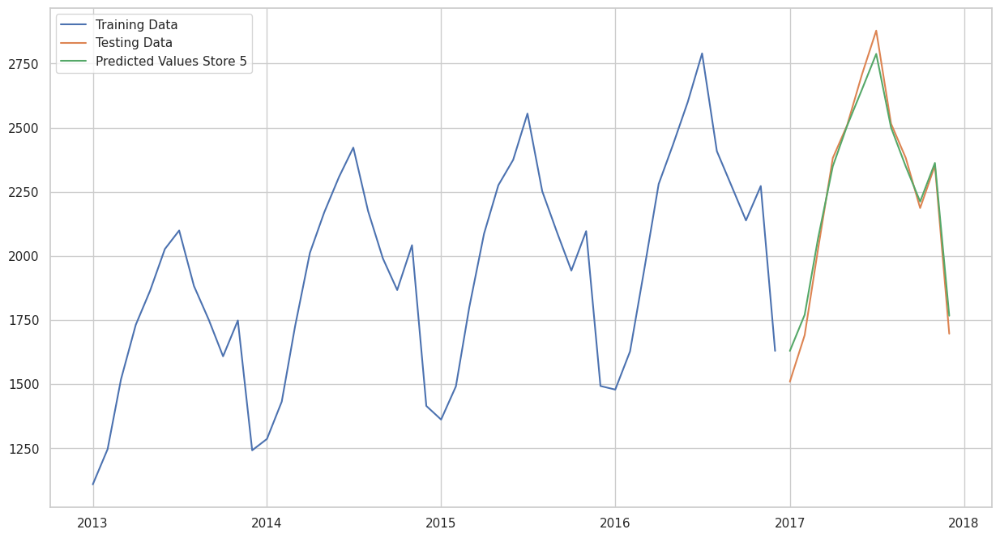

In [ ]:
plt.plot(train_hwes5.index, train_hwes5.values, label='Training Data ')
plt.plot(test_hwes5.index, test_hwes5.values, label='Testing Data')
plt.plot(pred5.index, pred5.values, label='Predicted Values Store 5')
plt.legend(loc='best')
plt.show()

In [ ]:
pred5 = pd.DataFrame(pred5)

In [ ]:
esma5 = mean_absolute_error(test_hwes5 ,pred5)
print('Mean absolute error ',esma5)
esmh5=mean_squared_error(test_hwes5 ,pred5)
print('Mean squared error',esmh5)
esrh5=rmse(test_hwes5 ,pred5)
print('Root-mean squared error',esrh5)

Mean absolute error  48.134517608319015
Mean squared error 3501.749597880523
Root-mean squared error [59.17558278]


Model for Store 6

In [ ]:
train_hwes6 = mstore6.iloc[:48]
test_hwes6 = mstore6.iloc[48:]

In [ ]:
hwes6 = ExponentialSmoothing(train_hwes6, seasonal_periods=12, trend='add', seasonal='add').fit()

Text(0.5, 1.0, 'Store 6 month supplies sales')

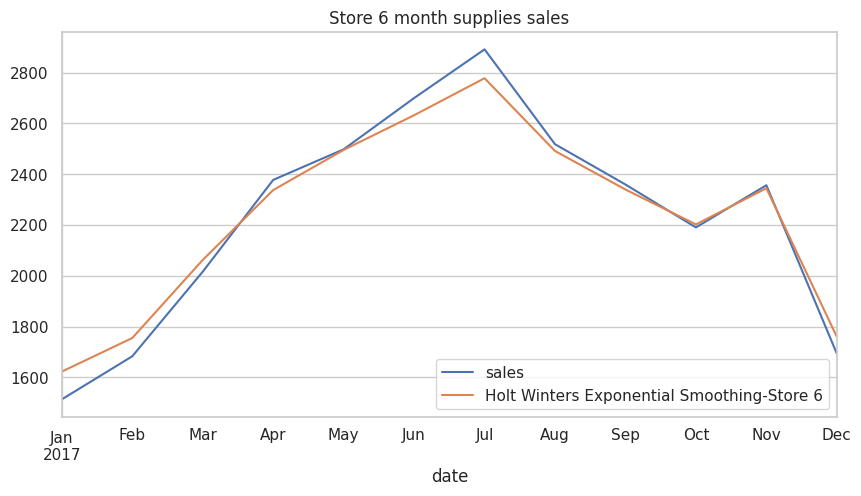

In [ ]:
pred6 = hwes6.forecast(12).rename('Holt Winters Exponential Smoothing-Store 6')
test_hwes6.plot(figsize=(10,5),legend=True)
pred6.plot(legend=True)
plt.title("Store 6 month supplies sales")

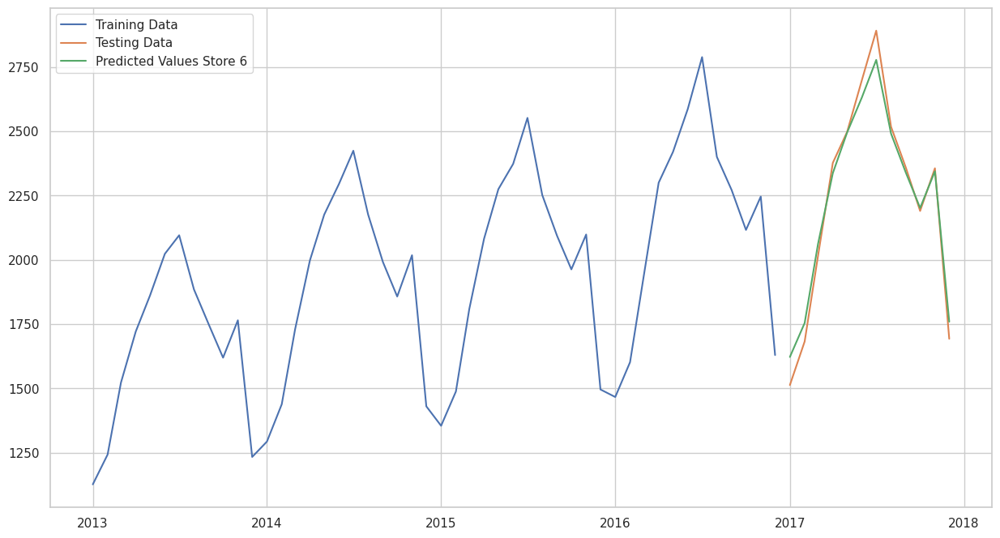

In [ ]:
plt.plot(train_hwes6.index, train_hwes6.values, label='Training Data ')
plt.plot(test_hwes6.index, test_hwes6.values, label='Testing Data')
plt.plot(pred6.index, pred6.values, label='Predicted Values Store 6')
plt.legend(loc='best')
plt.show()

In [ ]:
pred6 = pd.DataFrame(pred6)

In [ ]:
esma6 = mean_absolute_error(test_hwes6 ,pred6)
print('Mean absolute error ',esma6)
esmh6=mean_squared_error(test_hwes6 ,pred6)
print('Mean squared error',esmh6)
esrh6=rmse(test_hwes6 ,pred6)
print('Root-mean squared error',esrh6)

Mean absolute error  48.98358743454588
Mean squared error 3680.0436208079295
Root-mean squared error [60.66336309]


Model for Store 7

In [ ]:
train_hwes7 = mstore7.iloc[:48]
test_hwes7 = mstore7.iloc[48:]

In [ ]:
hwes7 = ExponentialSmoothing(train_hwes7, seasonal_periods=12, trend='add', seasonal='add').fit()

Text(0.5, 1.0, 'Store 7 month supplies sales')

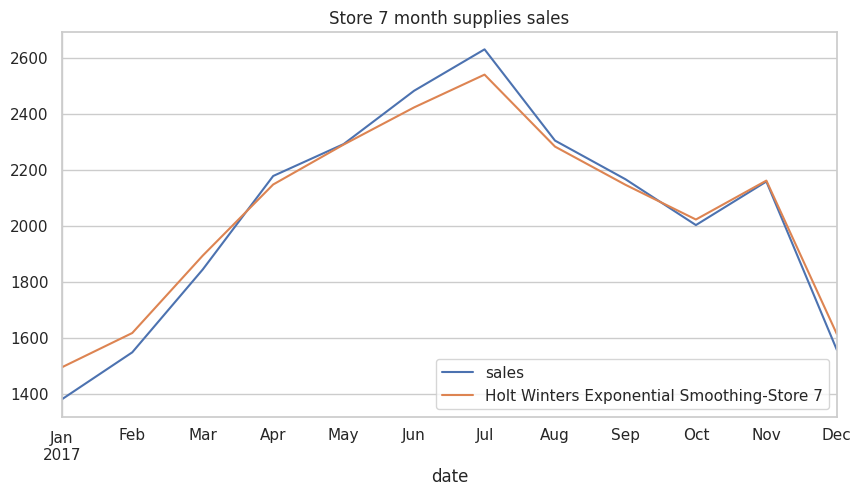

In [ ]:
pred7 = hwes7.forecast(12).rename('Holt Winters Exponential Smoothing-Store 7')
test_hwes7.plot(figsize=(10,5),legend=True)
pred7.plot(legend=True)
plt.title("Store 7 month supplies sales")

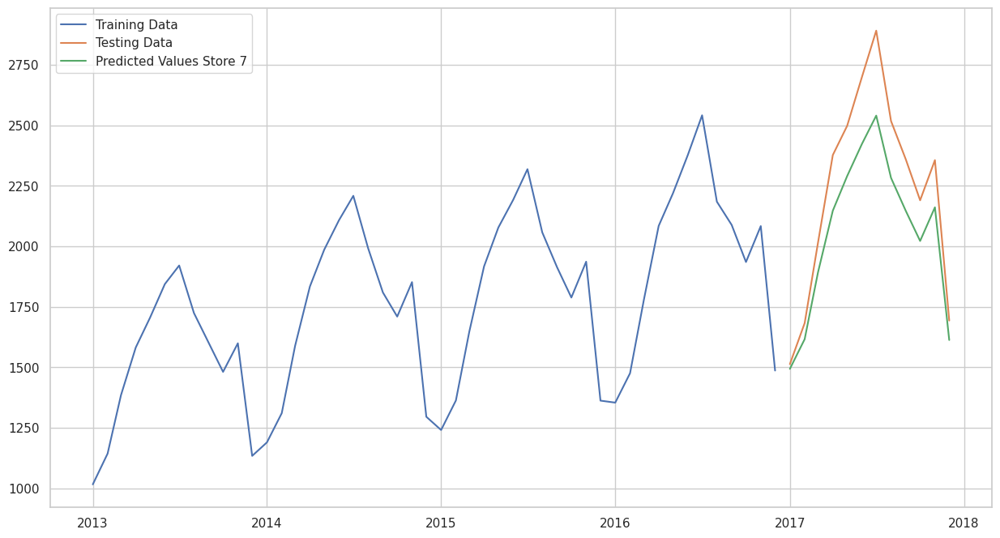

In [ ]:
plt.plot(train_hwes7.index, train_hwes7.values, label='Training Data ')
plt.plot(test_hwes7.index, test_hwes6.values, label='Testing Data')
plt.plot(pred7.index, pred7.values, label='Predicted Values Store 7')
plt.legend(loc='best')
plt.show()

In [ ]:
pred7 = pd.DataFrame(pred7)

In [ ]:
esma7 = mean_absolute_error(test_hwes7 ,pred7)
print('Mean absolute error ',esma7)
esmh7 = mean_squared_error(test_hwes7 ,pred7)
print('Mean squared error',esmh7)
esrh7 = rmse(test_hwes7 ,pred7)
print('Root-mean squared error',esrh7)

Mean absolute error  44.7195479775981
Mean squared error 3122.429175115473
Root-mean squared error [55.87870055]


Model for Store 8

In [ ]:
train_hwes8 = mstore8.iloc[:48]
test_hwes8 = mstore8.iloc[48:]

In [ ]:
hwes8 = ExponentialSmoothing(train_hwes8, seasonal_periods=12, trend='add', seasonal='add').fit()

Text(0.5, 1.0, 'Store 8 month supplies sales')

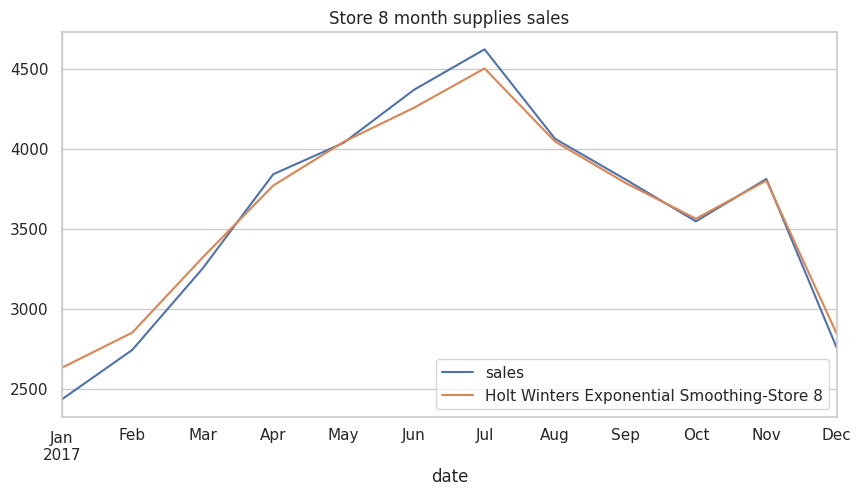

In [ ]:
pred8 = hwes8.forecast(12).rename('Holt Winters Exponential Smoothing-Store 8')
test_hwes8.plot(figsize=(10,5),legend=True)
pred8.plot(legend=True)
plt.title("Store 8 month supplies sales")

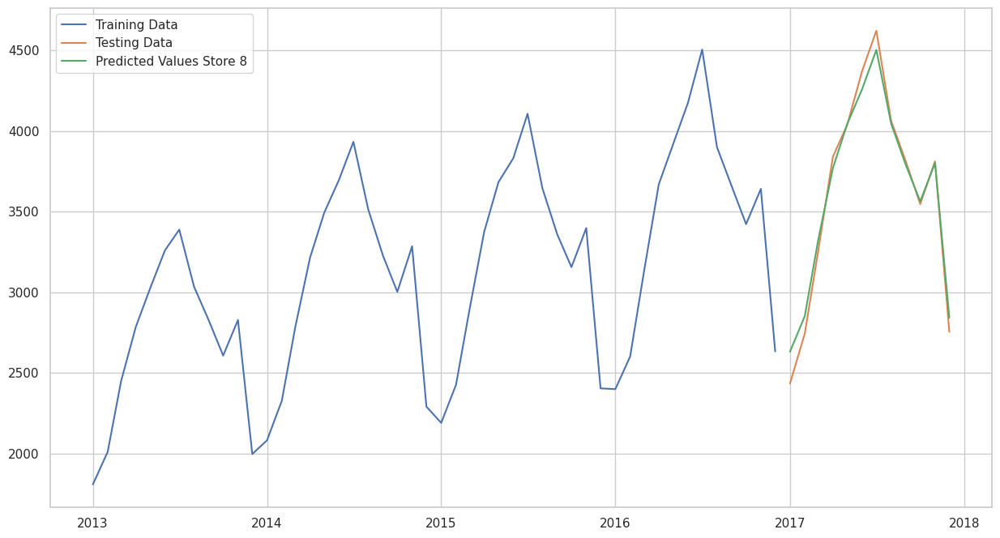

In [ ]:
plt.plot(train_hwes8.index, train_hwes8.values, label='Training Data ')
plt.plot(test_hwes8.index, test_hwes8.values, label='Testing Data')
plt.plot(pred8.index, pred8.values, label='Predicted Values Store 8')
plt.legend(loc='best')
plt.show()

In [ ]:
pred8 = pd.DataFrame(pred8)

In [ ]:
esma8 = mean_absolute_error(test_hwes8 ,pred8)
print('Mean absolute error ',esma8)
esmh8 = mean_squared_error(test_hwes8 ,pred8)
print('Mean squared error',esmh8)
esrh8 = rmse(test_hwes8 ,pred8)
print('Root-mean squared error',esrh8)

Mean absolute error  69.75580573269895
Mean squared error 8022.145692499853
Root-mean squared error [89.56643173]


Model for Store 9

In [ ]:
train_hwes9 = mstore9.iloc[:48]
test_hwes9 = mstore9.iloc[48:]

In [ ]:
hwes9 = ExponentialSmoothing(train_hwes9, seasonal_periods=12, trend='add', seasonal='add').fit()

Text(0.5, 1.0, 'Store 9 month supplies sales')

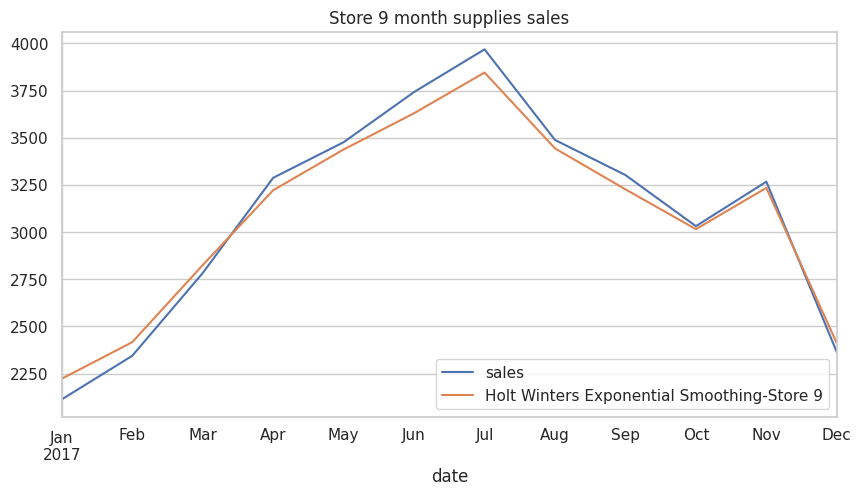

In [ ]:
pred9 = hwes9.forecast(12).rename('Holt Winters Exponential Smoothing-Store 9')
test_hwes9.plot(figsize=(10,5),legend=True)
pred9.plot(legend=True)
plt.title("Store 9 month supplies sales")

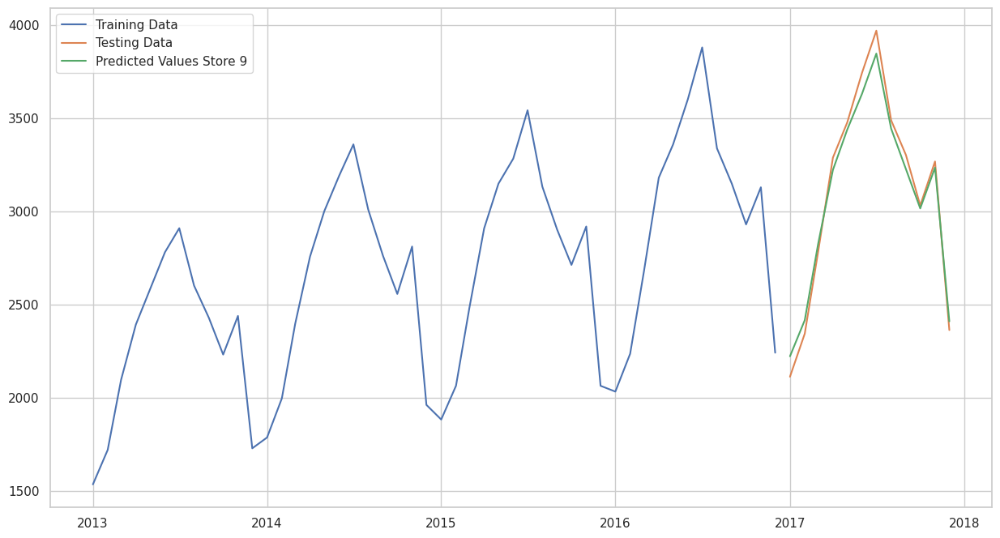

In [ ]:
plt.plot(train_hwes9.index, train_hwes9.values, label='Training Data ')
plt.plot(test_hwes9.index, test_hwes9.values, label='Testing Data')
plt.plot(pred9.index, pred9.values, label='Predicted Values Store 9')
plt.legend(loc='best')
plt.show()

In [ ]:
pred9 = pd.DataFrame(pred9)

In [ ]:
esma9 = mean_absolute_error(test_hwes9 ,pred9)
print('Mean absolute error ',esma9)
esmh9 = mean_squared_error(test_hwes9 ,pred9)
print('Mean squared error',esmh9)
esrh9 = rmse(test_hwes9 ,pred9)
print('Root-mean squared error',esrh9)

Mean absolute error  64.9506891414574
Mean squared error 5315.86454154598
Root-mean squared error [72.9099756]


Model for Store 10

In [ ]:
train_hwes10 = mstore10.iloc[:48]
test_hwes10 = mstore10.iloc[48:]

In [ ]:
hwes10 = ExponentialSmoothing(train_hwes10, seasonal_periods=12, trend='add', seasonal='add').fit()

Text(0.5, 1.0, 'Store 10 month supplies sales')

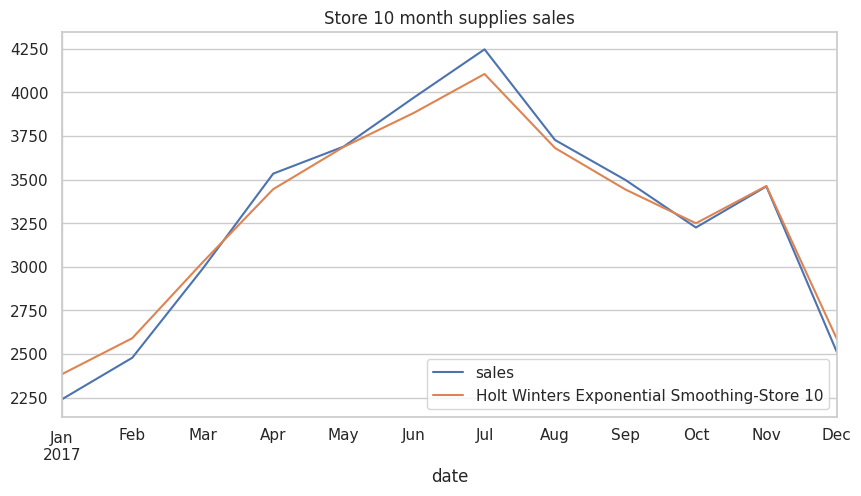

In [ ]:
pred10 = hwes10.forecast(12).rename('Holt Winters Exponential Smoothing-Store 10')
test_hwes10.plot(figsize=(10,5
                        ),legend=True)
pred10.plot(legend=True)
plt.title("Store 10 month supplies sales")

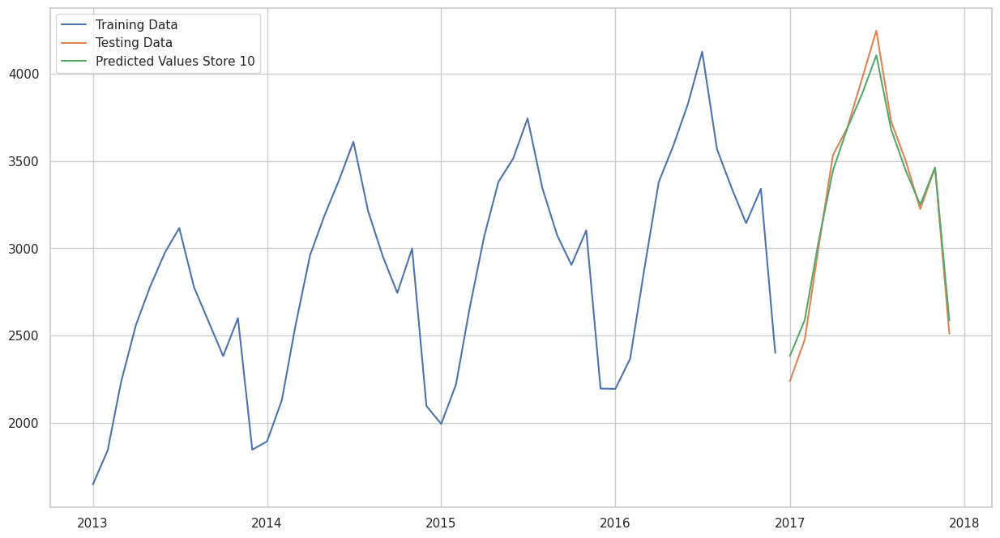

In [ ]:
plt.plot(train_hwes10.index, train_hwes10.values, label='Training Data ')
plt.plot(test_hwes10.index, test_hwes10.values, label='Testing Data')
plt.plot(pred10.index, pred10.values, label='Predicted Values Store 10')
plt.legend(loc='best')
plt.show()

In [ ]:
pred10 = pd.DataFrame(pred10)


In [ ]:
esma10=mean_absolute_error(test_hwes10 ,pred10)
print('Mean absolute error ',esma10)
esmh10=mean_squared_error(test_hwes10 ,pred10)
print('Mean squared error',esmh10)
esrh10=rmse(test_hwes10 ,pred10)
print('Root-mean squared error',esrh10)

Mean absolute error  67.96141526958331
Mean squared error 6798.879969746482
Root-mean squared error [1093.22406705  927.44271257  658.67799813  617.97596415  715.45598688
  838.57624956 1006.34838913  712.31400278  617.54525151  602.1000085
  622.63929244  930.60575609]


In [ ]:
hwes_models = pd.DataFrame({
    'Model Name' : ['Store 1','Store 2','Store 3','Store 4','Store 5','Store 6','Store 7','Store 8','Store 9','Store 10' ],
    'RMSE values' : [esrh1,esrh2,esrh3,esrh4,esrh5,esrh6,esrh7,esrh8,esrh9,esrh10],
    'Mean Squared Error' : [esmh1,esmh2,esmh3,esmh4,esmh5,esmh6,esmh7,esmh8,esmh9,esmh10],
    'Mean Absolute Error(MAE)' : [esma1,esma2,esma3,esma4,esma5,esma6,esma7,esma8,esma9,esma10]
})
hwes_models.set_index('Model Name')

,RMSE values,Mean Squared Error,Mean Absolute Error(MAE)
Model Name,,,
Store 1,"[867.440471263908, 740.0936322119695, 525.3385...",4861.690451,58.986604
Store 2,[98.9412695887144],9789.374828,79.357905
Store 3,[82.42947286823008],6794.617997,70.320989
Store 4,[79.87363425539266],6379.797449,64.630149
Store 5,[59.175582784460374],3501.749598,48.134518
Store 6,[60.66336308520926],3680.043621,48.983587
Store 7,[55.87870054963226],3122.429175,44.719548
Store 8,[89.56643172807462],8022.145692,69.755806
Store 9,[72.90997559693722],5315.864542,64.950689


Overall Impression:


* Stores 5, 6, and 7 appear to perform relatively better across these evaluation metrics, showing lower errors in their demand forecasting models.
* Stores 1 and 9 also demonstrate good performance, especially in terms of RMSE, indicating better accuracy in their predictions.

##3. FB Prophet MODEL

In [ ]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt

Prophet Model for Store 1

In [ ]:
mstore1_df = mstore1
mstore1_df['ds'] = mstore1.index
mstore1_df.columns = ['y','ds']

In [ ]:
mstore1_m = Prophet().fit(mstore1_df)
future_store1_m = mstore1_m.make_future_dataframe(periods=12,freq='MS')

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/c7bzv4e6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/mkwwynog.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65848', 'data', 'file=/tmp/tmp52c3_vu2/c7bzv4e6.json', 'init=/tmp/tmp52c3_vu2/mkwwynog.json', 'output', 'file=/tmp/tmp52c3_vu2/prophet_modele1p38m5e/prophet_model-20240101063342.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
06:33:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:33:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
forecast_store1_m = mstore1_m.predict(future_store1_m)
forecast_store1_m

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,1874.738336,1146.741084,1296.466279,1874.738336,1874.738336,-652.274913,-652.274913,-652.274913,-652.274913,-652.274913,-652.274913,0.0,0.0,0.0,1222.463423
1,2013-02-01,1894.713796,1323.985557,1472.522443,1894.713796,1894.713796,-498.620843,-498.620843,-498.620843,-498.620843,-498.620843,-498.620843,0.0,0.0,0.0,1396.092953
2,2013-03-01,1912.756148,1676.664924,1816.916899,1912.756148,1912.756148,-167.560546,-167.560546,-167.560546,-167.560546,-167.560546,-167.560546,0.0,0.0,0.0,1745.195602
3,2013-04-01,1932.731609,2038.456837,2190.131478,1932.731609,1932.731609,181.634528,181.634528,181.634528,181.634528,181.634528,181.634528,0.0,0.0,0.0,2114.366137
4,2013-05-01,1952.062700,2221.573901,2364.300661,1952.062700,1952.062700,338.710993,338.710993,338.710993,338.710993,338.710993,338.710993,0.0,0.0,0.0,2290.773692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2018-08-01,2837.605786,3073.408535,3213.060415,2833.796682,2841.540472,307.024776,307.024776,307.024776,307.024776,307.024776,307.024776,0.0,0.0,0.0,3144.630562
68,2018-09-01,2850.088998,2878.304393,3025.242938,2845.472895,2854.925855,98.885802,98.885802,98.885802,98.885802,98.885802,98.885802,0.0,0.0,0.0,2948.974801
69,2018-10-01,2862.169526,2712.421495,2852.595482,2856.866981,2867.900359,-79.674449,-79.674449,-79.674449,-79.674449,-79.674449,-79.674449,0.0,0.0,0.0,2782.495077
70,2018-11-01,2874.652738,2879.838775,3027.049474,2868.401296,2881.258322,78.251488,78.251488,78.251488,78.251488,78.251488,78.251488,0.0,0.0,0.0,2952.904226


In [ ]:
from sklearn.metrics import r2_score,mean_squared_error
from statsmodels.tools.eval_measures import rmse
metric_df1=forecast_store1_m.set_index('ds')[['yhat']].join(mstore1_df.set_index('ds').y).reset_index()
metric_df1.dropna(inplace=True)
prrs1=r2_score(metric_df1.y,metric_df1.yhat)
print('r2 Score',prrs1)
prms1=mean_squared_error(metric_df1.y,metric_df1.yhat)
print('mean squared error', prms1)
prrm1=rmse(metric_df1.y,metric_df1.yhat)
print('Root mean square error', prrm1)

r2 Score 0.9867082712343827
mean squared error 3287.216167736226
Root mean square error 57.33424951751114


Text(74.59722222222221, 0.5, 'Sales')

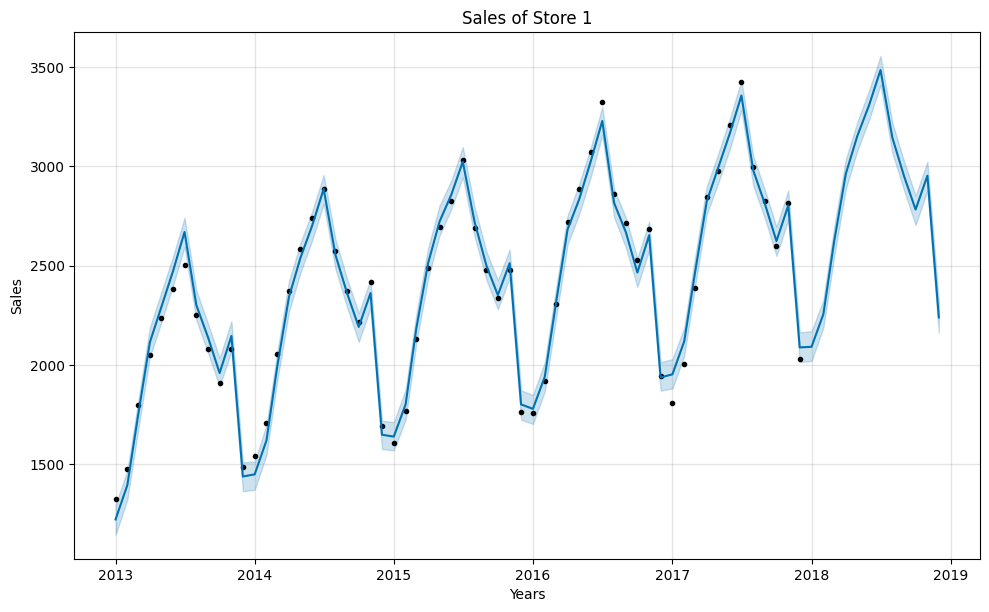

In [ ]:
mstore1_m.plot(forecast_store1_m);
plt.title('Sales of Store 1')
plt.xlabel('Years')
plt.ylabel('Sales')

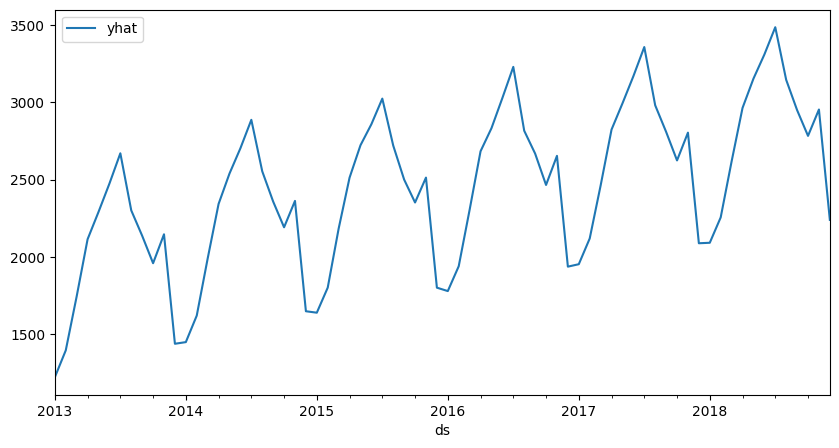

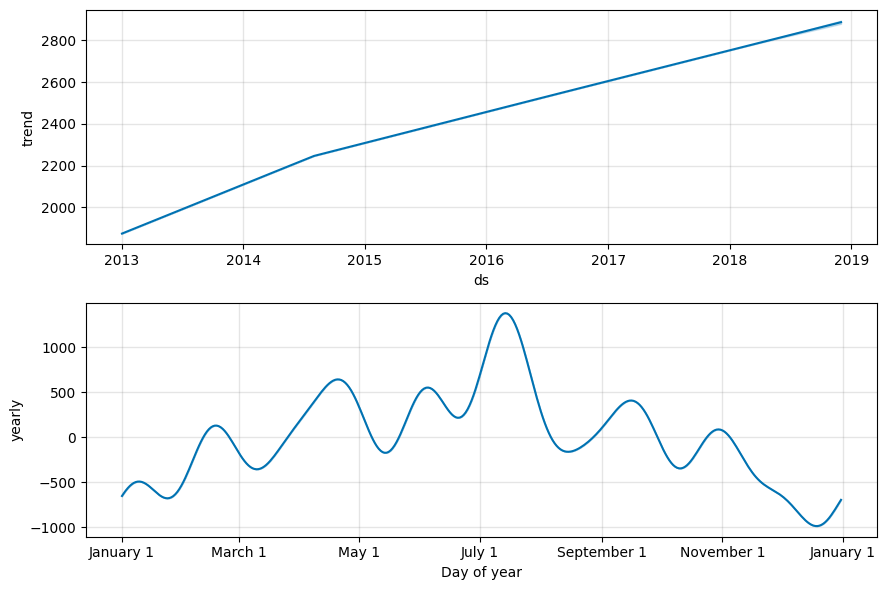

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
forecast_store1_m.plot(x='ds',y='yhat',figsize=(10,5))
mstore1_m.plot_components(forecast_store1_m);

Prophet Model for Store 2

In [ ]:
mstore2_df = mstore2
mstore2_df['ds'] = mstore2.index
mstore2_df.columns = ['y','ds']

In [ ]:
mstore2_m = Prophet().fit(mstore2_df)
future_store2_m = mstore2_m.make_future_dataframe(periods=12,freq='MS')

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/8xdt0rid.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/14cjyfoa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88018', 'data', 'file=/tmp/tmp52c3_vu2/8xdt0rid.json', 'init=/tmp/tmp52c3_vu2/14cjyfoa.json', 'output', 'file=/tmp/tmp52c3_vu2/prophet_model0oblo67o/prophet_model-20240101062601.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
06:26:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
forecast_store2_m = mstore2_m.predict(future_store2_m)
forecast_store2_m

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,2669.883740,1627.938499,1826.119496,2669.883740,2669.883740,-939.627555,-939.627555,-939.627555,-939.627555,-939.627555,-939.627555,0.0,0.0,0.0,1730.256185
1,2013-02-01,2697.510921,1895.835003,2096.577341,2697.510921,2697.510921,-695.266831,-695.266831,-695.266831,-695.266831,-695.266831,-695.266831,0.0,0.0,0.0,2002.244090
2,2013-03-01,2722.464503,2385.167366,2600.081583,2722.464503,2722.464503,-227.732136,-227.732136,-227.732136,-227.732136,-227.732136,-227.732136,0.0,0.0,0.0,2494.732367
3,2013-04-01,2750.091684,2910.455784,3104.653615,2750.091684,2750.091684,255.813899,255.813899,255.813899,255.813899,255.813899,255.813899,0.0,0.0,0.0,3005.905583
4,2013-05-01,2776.827665,3143.665778,3352.339121,2776.827665,2776.827665,472.320380,472.320380,472.320380,472.320380,472.320380,472.320380,0.0,0.0,0.0,3249.148045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2018-08-01,4020.088530,4343.073678,4561.331918,4014.751752,4025.227192,432.854966,432.854966,432.854966,432.854966,432.854966,432.854966,0.0,0.0,0.0,4452.943495
68,2018-09-01,4037.671171,4071.311371,4280.682498,4031.150827,4044.036141,134.593669,134.593669,134.593669,134.593669,134.593669,134.593669,0.0,0.0,0.0,4172.264841
69,2018-10-01,4054.686631,3830.769412,4041.973356,4047.058818,4062.128276,-116.387825,-116.387825,-116.387825,-116.387825,-116.387825,-116.387825,0.0,0.0,0.0,3938.298805
70,2018-11-01,4072.269272,4082.124260,4291.996509,4063.340338,4080.933791,117.257878,117.257878,117.257878,117.257878,117.257878,117.257878,0.0,0.0,0.0,4189.527150


In [ ]:
from sklearn.metrics import r2_score,mean_squared_error
from statsmodels.tools.eval_measures import rmse
metric_df2=forecast_store2_m.set_index('ds')[['yhat']].join(mstore2_df.set_index('ds').y).reset_index()
metric_df2.dropna(inplace=True)
prrs2=r2_score(metric_df2.y,metric_df2.yhat)
print('r2 Score',prrs2)
prms2=mean_squared_error(metric_df2.y,metric_df2.yhat)
print('mean squared error', prms2)
prrm2=rmse(metric_df2.y,metric_df2.yhat)
print('Root mean square error', prrm2)

r2 Score 0.9864739270471149
mean squared error 6692.464015472813
Root mean square error 81.80748141504426


Text(74.59722222222221, 0.5, 'Sales')

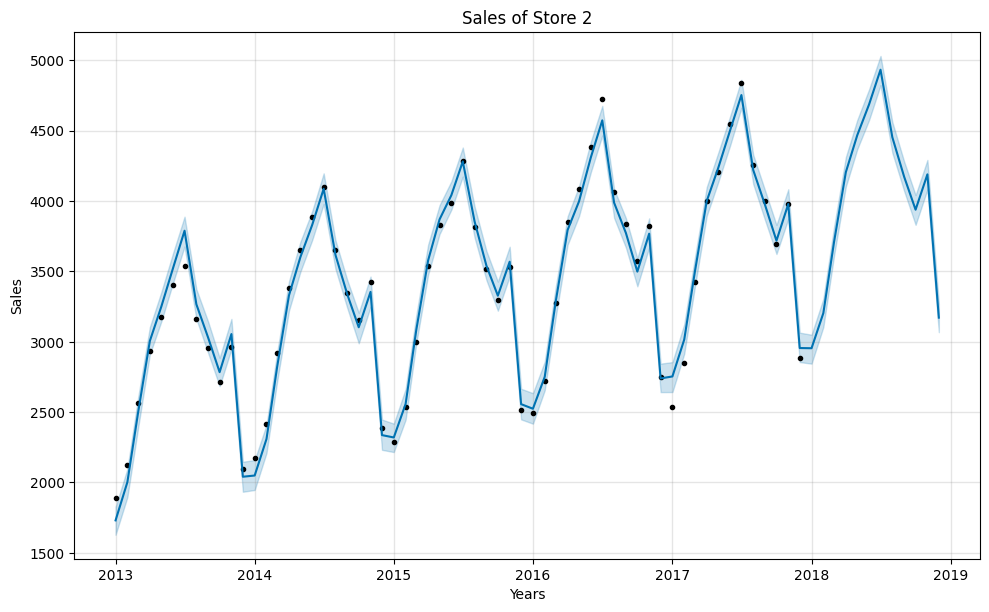

In [ ]:
mstore2_m.plot(forecast_store2_m);
plt.title('Sales of Store 2')
plt.xlabel('Years')
plt.ylabel('Sales')

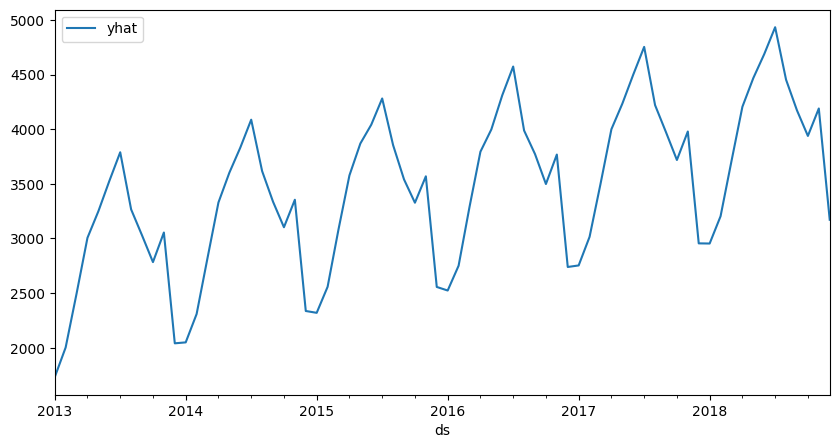

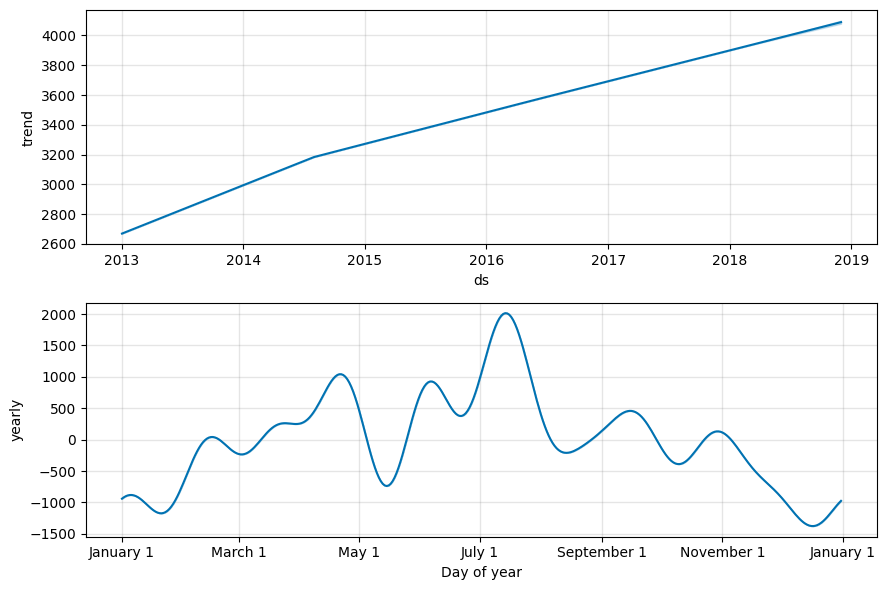

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
forecast_store2_m.plot(x='ds',y='yhat',figsize=(10,5))
mstore2_m.plot_components(forecast_store2_m);

Prophet Model for Store 3

In [ ]:
mstore3_df = mstore3
mstore3_df['ds'] = mstore3.index
mstore3_df.columns = ['y','ds']

In [ ]:
mstore3_m = Prophet().fit(mstore3_df)
future_store3_m = mstore3_m.make_future_dataframe(periods=12,freq='MS')

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/cqzkjsi2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/kf6u813q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1891', 'data', 'file=/tmp/tmp52c3_vu2/cqzkjsi2.json', 'init=/tmp/tmp52c3_vu2/kf6u813q.json', 'output', 'file=/tmp/tmp52c3_vu2/prophet_modelx2uykngq/prophet_model-20240101062604.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
06:26:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
forecast_store3_m = mstore3_m.predict(future_store3_m)
forecast_store3_m

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,2355.640718,1455.245530,1628.516196,2355.640718,2355.640718,-813.397260,-813.397260,-813.397260,-813.397260,-813.397260,-813.397260,0.0,0.0,0.0,1542.243458
1,2013-02-01,2381.044355,1671.816964,1851.481827,2381.044355,2381.044355,-619.026713,-619.026713,-619.026713,-619.026713,-619.026713,-619.026713,0.0,0.0,0.0,1762.017642
2,2013-03-01,2403.989575,2107.708729,2291.849989,2403.989575,2403.989575,-203.608019,-203.608019,-203.608019,-203.608019,-203.608019,-203.608019,0.0,0.0,0.0,2200.381556
3,2013-04-01,2429.393212,2582.055196,2759.393826,2429.393212,2429.393212,237.557823,237.557823,237.557823,237.557823,237.557823,237.557823,0.0,0.0,0.0,2666.951034
4,2013-05-01,2453.977376,2793.140943,2967.304897,2453.977376,2453.977376,423.867389,423.867389,423.867389,423.867389,423.867389,423.867389,0.0,0.0,0.0,2877.844765
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2018-08-01,3562.018289,3861.579261,4031.376585,3556.706917,3567.120375,382.551474,382.551474,382.551474,382.551474,382.551474,382.551474,0.0,0.0,0.0,3944.569763
68,2018-09-01,3577.124561,3614.065560,3792.410575,3570.830071,3583.472758,123.307295,123.307295,123.307295,123.307295,123.307295,123.307295,0.0,0.0,0.0,3700.431856
69,2018-10-01,3591.743533,3381.831356,3576.660022,3584.146173,3599.115780,-115.147082,-115.147082,-115.147082,-115.147082,-115.147082,-115.147082,0.0,0.0,0.0,3476.596451
70,2018-11-01,3606.849805,3624.324263,3801.967925,3598.180283,3615.436580,103.661622,103.661622,103.661622,103.661622,103.661622,103.661622,0.0,0.0,0.0,3710.511426


In [ ]:
from sklearn.metrics import r2_score,mean_squared_error
from statsmodels.tools.eval_measures import rmse
metric_df3=forecast_store3_m.set_index('ds')[['yhat']].join(mstore3_df.set_index('ds').y).reset_index()
metric_df3.dropna(inplace=True)
prrs3=r2_score(metric_df3.y,metric_df3.yhat)
print('r2 Score',prrs3)
prms3=mean_squared_error(metric_df3.y,metric_df3.yhat)
print('mean squared error', prms3)
prrm3=rmse(metric_df3.y,metric_df3.yhat)
print('Root mean square error', prrm3)

r2 Score 0.9871349710643553
mean squared error 5037.58278968534
Root mean square error 70.97593105895363


Text(74.59722222222221, 0.5, 'Sales')

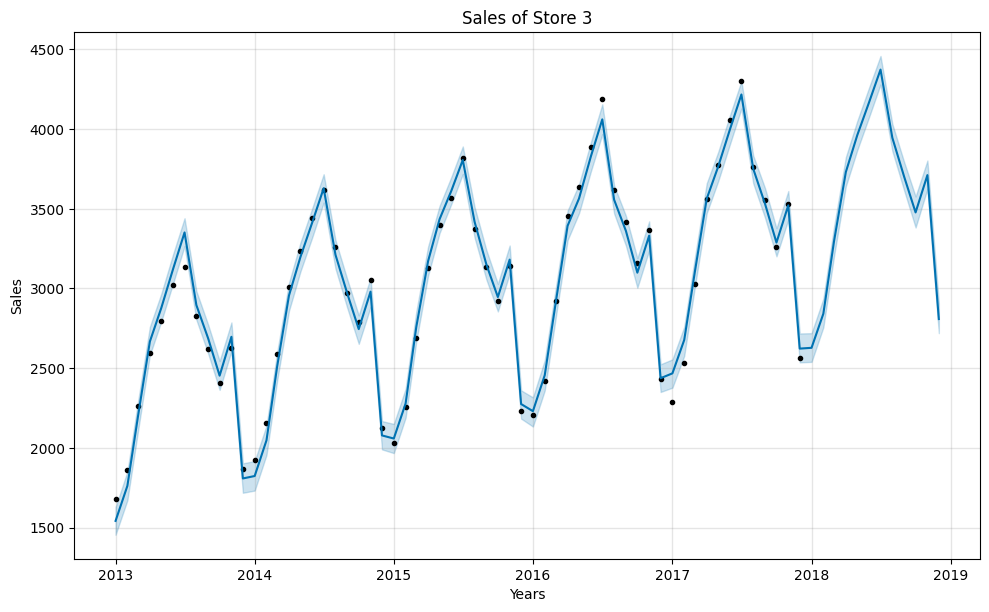

In [ ]:
mstore3_m.plot(forecast_store3_m);
plt.title('Sales of Store 3')
plt.xlabel('Years')
plt.ylabel('Sales')

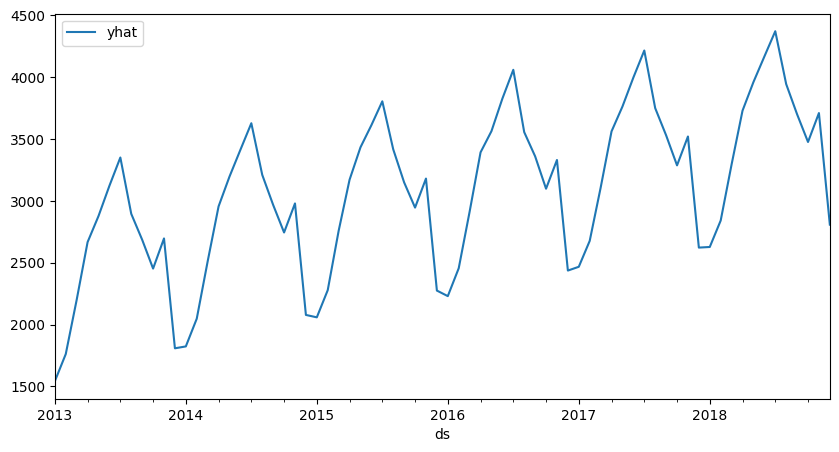

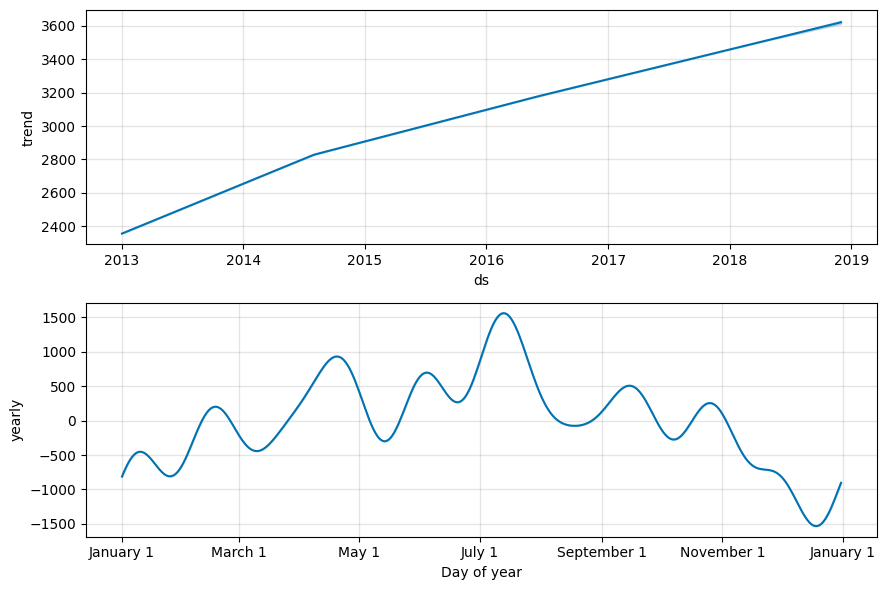

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
forecast_store3_m.plot(x='ds',y='yhat',figsize=(10,5))
mstore3_m.plot_components(forecast_store3_m);

Prophet Model for Store 4

In [ ]:
mstore4_df = mstore4
mstore4_df['ds'] = mstore4.index
mstore4_df.columns = ['y','ds']

In [ ]:
mstore4_m = Prophet().fit(mstore4_df)
future_store4_m = mstore4_m.make_future_dataframe(periods=12,freq='MS')

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/ckk2wtm3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/2n7e7_1k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52400', 'data', 'file=/tmp/tmp52c3_vu2/ckk2wtm3.json', 'init=/tmp/tmp52c3_vu2/2n7e7_1k.json', 'output', 'file=/tmp/tmp52c3_vu2/prophet_model_lzytrio/prophet_model-20240101062606.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
06:26:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
forecast_store4_m = mstore4_m.predict(future_store4_m)
forecast_store4_m

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,2174.160258,1335.597143,1506.616238,2174.160258,2174.160258,-753.488004,-753.488004,-753.488004,-753.488004,-753.488004,-753.488004,0.0,0.0,0.0,1420.672255
1,2013-02-01,2197.994141,1552.585975,1715.456007,2197.994141,2197.994141,-563.035442,-563.035442,-563.035442,-563.035442,-563.035442,-563.035442,0.0,0.0,0.0,1634.958699
2,2013-03-01,2219.521520,1944.051906,2106.834036,2219.521520,2219.521520,-196.136005,-196.136005,-196.136005,-196.136005,-196.136005,-196.136005,0.0,0.0,0.0,2023.385515
3,2013-04-01,2243.355403,2375.337063,2534.846039,2243.355403,2243.355403,207.673645,207.673645,207.673645,207.673645,207.673645,207.673645,0.0,0.0,0.0,2451.029048
4,2013-05-01,2266.420451,2578.338063,2741.610467,2266.420451,2266.420451,396.173146,396.173146,396.173146,396.173146,396.173146,396.173146,0.0,0.0,0.0,2662.593597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2018-08-01,3284.266784,3564.233327,3731.213516,3279.194056,3289.281651,363.268872,363.268872,363.268872,363.268872,363.268872,363.268872,0.0,0.0,0.0,3647.535656
68,2018-09-01,3298.314064,3331.574518,3495.915295,3292.106700,3304.503496,117.114303,117.114303,117.114303,117.114303,117.114303,117.114303,0.0,0.0,0.0,3415.428367
69,2018-10-01,3311.908206,3131.669700,3294.604164,3304.410517,3319.201355,-97.840985,-97.840985,-97.840985,-97.840985,-97.840985,-97.840985,0.0,0.0,0.0,3214.067222
70,2018-11-01,3325.955486,3331.671233,3497.226968,3317.321860,3334.431745,89.682550,89.682550,89.682550,89.682550,89.682550,89.682550,0.0,0.0,0.0,3415.638036


In [ ]:
from sklearn.metrics import r2_score,mean_squared_error
from statsmodels.tools.eval_measures import rmse
metric_df4=forecast_store4_m.set_index('ds')[['yhat']].join(mstore4_df.set_index('ds').y).reset_index()
metric_df4.dropna(inplace=True)
prrs4=r2_score(metric_df4.y,metric_df4.yhat)
print('r2 Score',prrs4)
prms4=mean_squared_error(metric_df4.y,metric_df4.yhat)
print('mean squared error', prms4)
prrm4=rmse(metric_df4.y,metric_df4.yhat)
print('Root mean square error', prrm4)

r2 Score 0.987565002999444
mean squared error 4120.014694350805
Root mean square error 64.18734060818227


Text(74.59722222222221, 0.5, 'Sales')

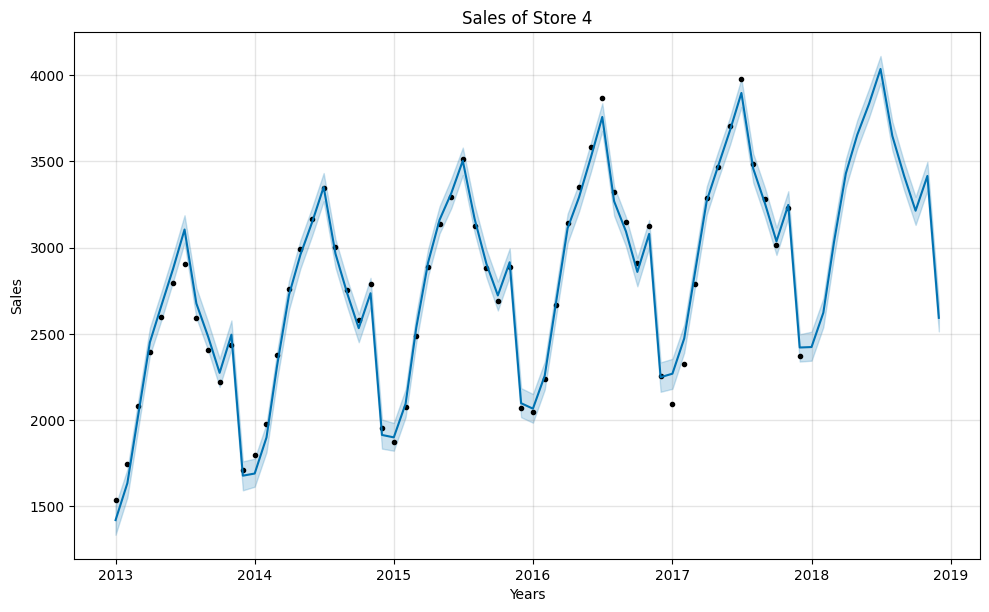

In [ ]:
mstore4_m.plot(forecast_store4_m);
plt.title('Sales of Store 4')
plt.xlabel('Years')
plt.ylabel('Sales')

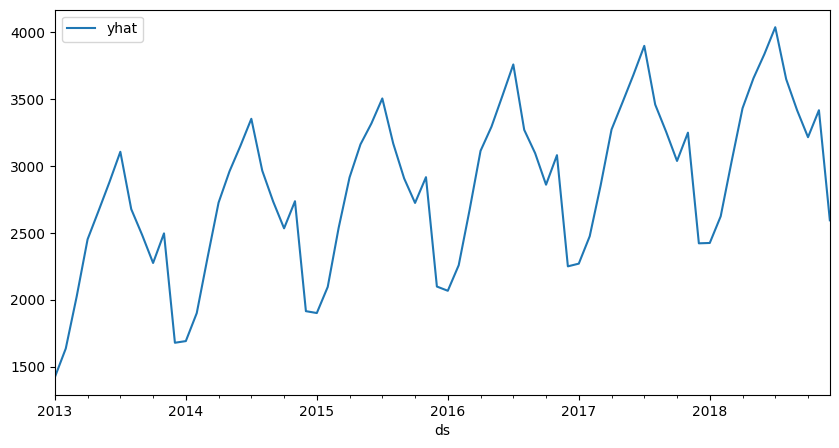

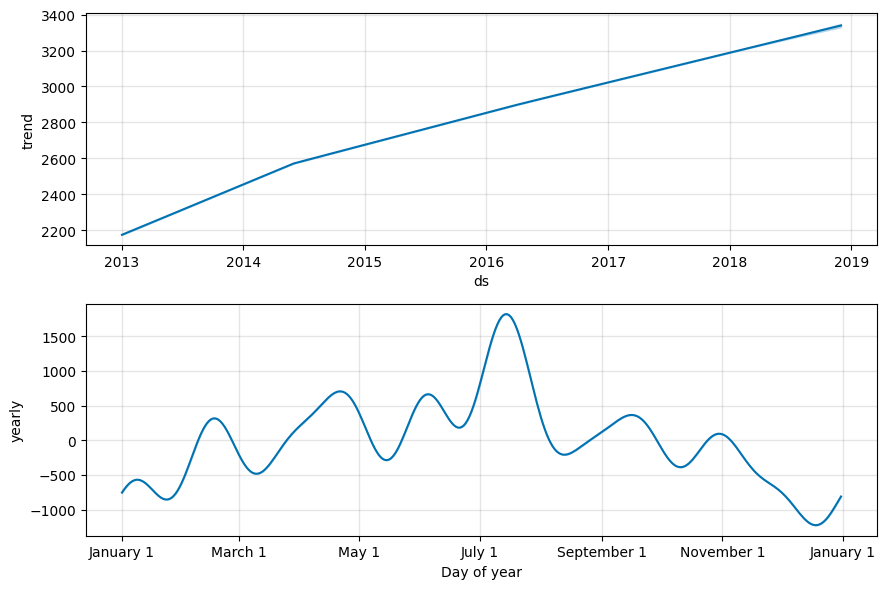

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
forecast_store4_m.plot(x='ds',y='yhat',figsize=(10,5))
mstore4_m.plot_components(forecast_store4_m);

Prophet Model for Store 5

In [ ]:
mstore5_df = mstore5
mstore5_df['ds'] = mstore5.index
mstore5_df.columns = ['y','ds']

In [ ]:
mstore5_m = Prophet().fit(mstore5_df)
future_store5_m = mstore5_m.make_future_dataframe(periods=12,freq='MS')

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/k870zzxp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/lklx9ev0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32339', 'data', 'file=/tmp/tmp52c3_vu2/k870zzxp.json', 'init=/tmp/tmp52c3_vu2/lklx9ev0.json', 'output', 'file=/tmp/tmp52c3_vu2/prophet_modele6fxhxxd/prophet_model-20240101062608.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
06:26:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
forecast_store5_m = mstore5_m.predict(future_store5_m)
forecast_store5_m

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,1576.723407,959.809871,1084.515017,1576.723407,1576.723407,-555.293734,-555.293734,-555.293734,-555.293734,-555.293734,-555.293734,0.0,0.0,0.0,1021.429673
1,2013-02-01,1593.576374,1116.710527,1245.222819,1593.576374,1593.576374,-414.150784,-414.150784,-414.150784,-414.150784,-414.150784,-414.150784,0.0,0.0,0.0,1179.425590
2,2013-03-01,1608.798409,1408.712015,1533.034061,1608.798409,1608.798409,-136.990605,-136.990605,-136.990605,-136.990605,-136.990605,-136.990605,0.0,0.0,0.0,1471.807804
3,2013-04-01,1625.651376,1710.083630,1836.244081,1625.651376,1625.651376,151.248597,151.248597,151.248597,151.248597,151.248597,151.248597,0.0,0.0,0.0,1776.899973
4,2013-05-01,1641.960699,1861.792419,1991.088007,1641.960699,1641.960699,283.421055,283.421055,283.421055,283.421055,283.421055,283.421055,0.0,0.0,0.0,1925.381754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2018-08-01,2380.733564,2574.411407,2697.858898,2377.236606,2384.527365,254.440074,254.440074,254.440074,254.440074,254.440074,254.440074,0.0,0.0,0.0,2635.173637
68,2018-09-01,2390.862800,2411.063144,2537.424361,2386.551798,2395.414077,85.028335,85.028335,85.028335,85.028335,85.028335,85.028335,0.0,0.0,0.0,2475.891135
69,2018-10-01,2400.665287,2267.481866,2386.774461,2395.590067,2406.033134,-74.980548,-74.980548,-74.980548,-74.980548,-74.980548,-74.980548,0.0,0.0,0.0,2325.684739
70,2018-11-01,2410.794523,2417.121973,2541.746039,2404.894520,2416.979348,69.827899,69.827899,69.827899,69.827899,69.827899,69.827899,0.0,0.0,0.0,2480.622423


In [ ]:
from sklearn.metrics import r2_score,mean_squared_error
from statsmodels.tools.eval_measures import rmse
metric_df5=forecast_store5_m.set_index('ds')[['yhat']].join(mstore5_df.set_index('ds').y).reset_index()
metric_df5.dropna(inplace=True)
prrs5=r2_score(metric_df5.y,metric_df5.yhat)
print('r2 Score',prrs5)
prms5=mean_squared_error(metric_df5.y,metric_df5.yhat)
print('mean squared error', prms5)
prrm5=rmse(metric_df5.y,metric_df5.yhat)
print('Root mean square error', prrm5)

r2 Score 0.9868049360355169
mean squared error 2315.793910246417
Root mean square error 48.12269641496013


Text(74.59722222222221, 0.5, 'Sales')

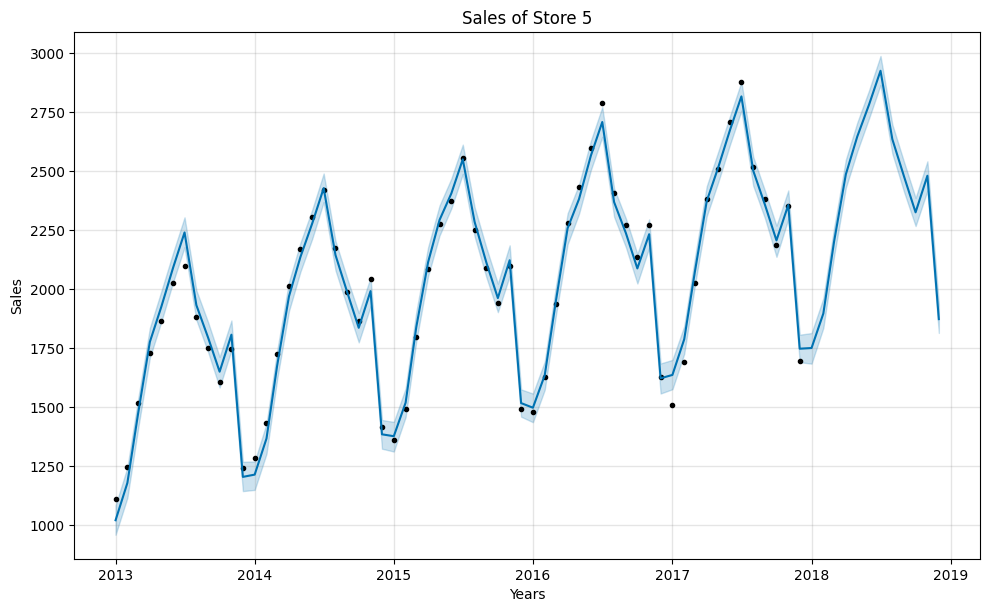

In [ ]:
mstore5_m.plot(forecast_store5_m);
plt.title('Sales of Store 5')
plt.xlabel('Years')
plt.ylabel('Sales')

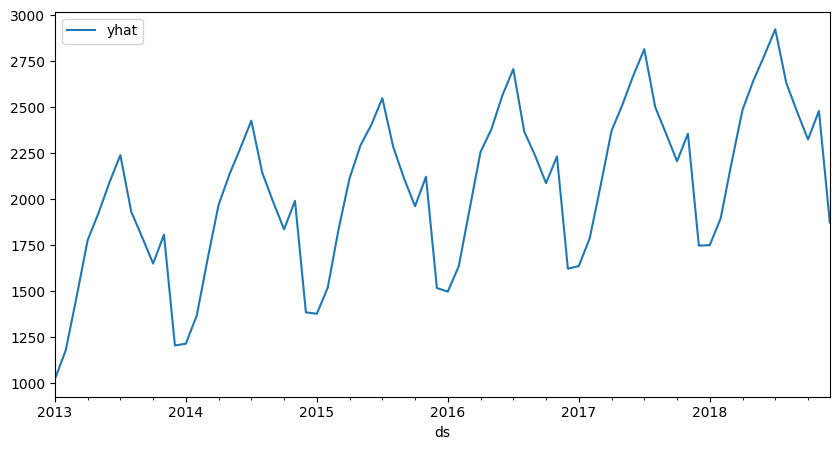

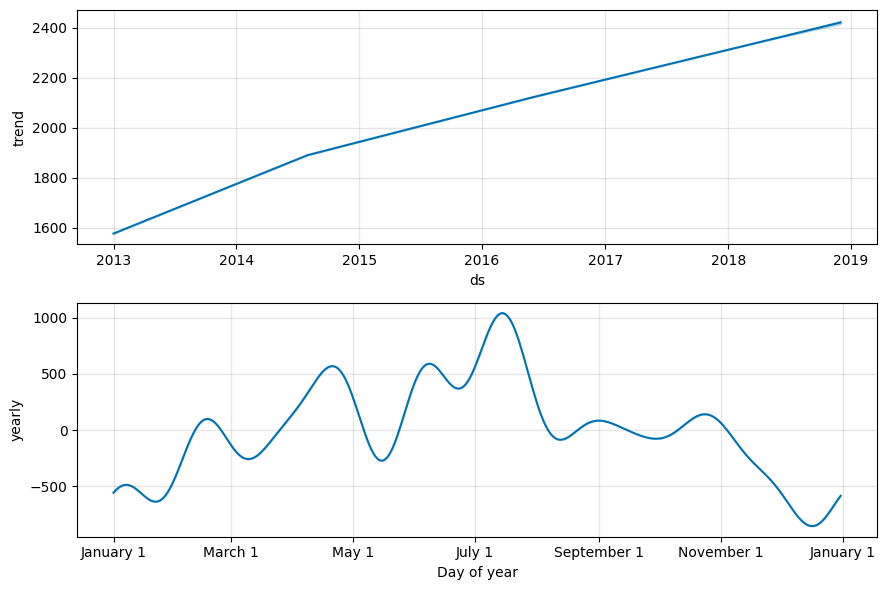

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
forecast_store5_m.plot(x='ds',y='yhat',figsize=(10,5))
mstore5_m.plot_components(forecast_store5_m);

Prophet Model for Store 6

In [ ]:
mstore6_df = mstore6
mstore6_df['ds'] = mstore6.index
mstore6_df.columns = ['y','ds']

In [ ]:
mstore6_m = Prophet().fit(mstore6_df)
future_store6_m = mstore6_m.make_future_dataframe(periods=12,freq='MS')

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/71lgzbe2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/wl21p_1s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82568', 'data', 'file=/tmp/tmp52c3_vu2/71lgzbe2.json', 'init=/tmp/tmp52c3_vu2/wl21p_1s.json', 'output', 'file=/tmp/tmp52c3_vu2/prophet_modelb9lolp_i/prophet_model-20240101062610.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
06:26:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
forecast_store6_m = mstore6_m.predict(future_store2_m)
forecast_store6_m

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,1569.553345,969.261993,1089.012287,1569.553345,1569.553345,-539.197695,-539.197695,-539.197695,-539.197695,-539.197695,-539.197695,0.0,0.0,0.0,1030.355649
1,2013-02-01,1587.032636,1114.975100,1234.670648,1587.032636,1587.032636,-412.237141,-412.237141,-412.237141,-412.237141,-412.237141,-412.237141,0.0,0.0,0.0,1174.795495
2,2013-03-01,1602.820383,1408.168826,1533.918391,1602.820383,1602.820383,-131.625426,-131.625426,-131.625426,-131.625426,-131.625426,-131.625426,0.0,0.0,0.0,1471.194956
3,2013-04-01,1620.299674,1715.738558,1836.275474,1620.299674,1620.299674,156.514379,156.514379,156.514379,156.514379,156.514379,156.514379,0.0,0.0,0.0,1776.814053
4,2013-05-01,1637.215117,1858.720878,1984.319152,1637.215117,1637.215117,282.508417,282.508417,282.508417,282.508417,282.508417,282.508417,0.0,0.0,0.0,1919.723534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2018-08-01,2372.403134,2571.523255,2691.778362,2368.089460,2376.138408,260.469828,260.469828,260.469828,260.469828,260.469828,260.469828,0.0,0.0,0.0,2632.872962
68,2018-09-01,2382.509321,2404.964820,2531.789416,2377.384913,2387.098690,86.851074,86.851074,86.851074,86.851074,86.851074,86.851074,0.0,0.0,0.0,2469.360396
69,2018-10-01,2392.289502,2270.333575,2387.747582,2386.283536,2397.672597,-63.980661,-63.980661,-63.980661,-63.980661,-63.980661,-63.980661,0.0,0.0,0.0,2328.308841
70,2018-11-01,2402.395689,2410.048070,2536.525353,2395.475723,2408.642881,71.626218,71.626218,71.626218,71.626218,71.626218,71.626218,0.0,0.0,0.0,2474.021908


In [ ]:
from sklearn.metrics import r2_score,mean_squared_error
from statsmodels.tools.eval_measures import rmse
metric_df6=forecast_store6_m.set_index('ds')[['yhat']].join(mstore6_df.set_index('ds').y).reset_index()
metric_df6.dropna(inplace=True)
prrs6=r2_score(metric_df6.y,metric_df6.yhat)
print('r2 Score',prrs6)
prms6=mean_squared_error(metric_df6.y,metric_df6.yhat)
print('mean squared error', prms6)
prrm6=rmse(metric_df6.y,metric_df6.yhat)
print('Root mean square error', prrm6)

r2 Score 0.9867723753218242
mean squared error 2303.6905212905044
Root mean square error 47.99677615518051


Text(74.59722222222221, 0.5, 'Sales')

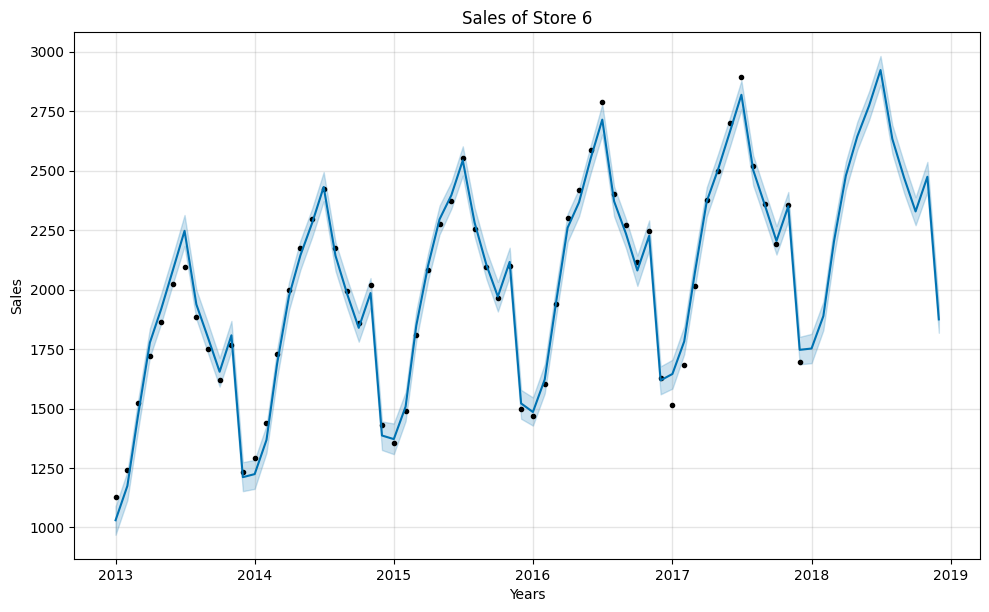

In [ ]:
mstore6_m.plot(forecast_store6_m);
plt.title('Sales of Store 6')
plt.xlabel('Years')
plt.ylabel('Sales')

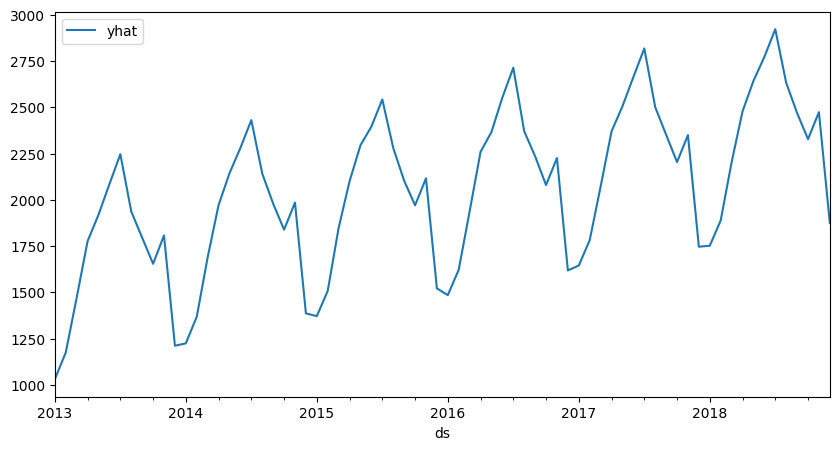

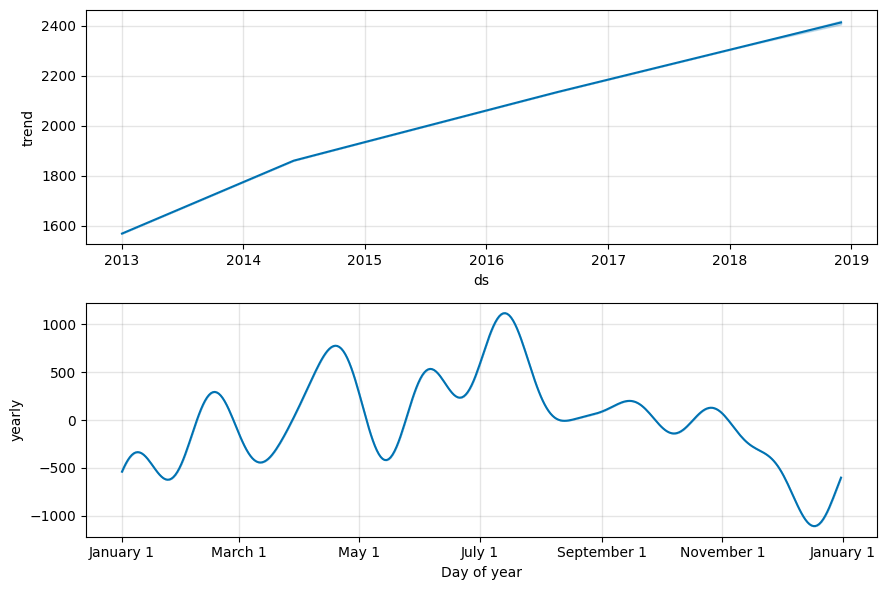

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
forecast_store6_m.plot(x='ds',y='yhat',figsize=(10,5))
mstore6_m.plot_components(forecast_store6_m);

Prophet Model for Store 7

In [ ]:
mstore7_df = mstore7
mstore7_df['ds'] = mstore7.index
mstore7_df.columns = ['y','ds']

In [ ]:
mstore7_m = Prophet().fit(mstore7_df)
future_store7_m = mstore7_m.make_future_dataframe(periods=12,freq='MS')

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/ci7lsyce.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/32u9yhri.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32047', 'data', 'file=/tmp/tmp52c3_vu2/ci7lsyce.json', 'init=/tmp/tmp52c3_vu2/32u9yhri.json', 'output', 'file=/tmp/tmp52c3_vu2/prophet_modelgax41hzc/prophet_model-20240101062613.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
06:26:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
forecast_store7_m = mstore7_m.predict(future_store7_m)
forecast_store7_m

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,1439.994070,880.357190,992.564631,1439.994070,1439.994070,-503.484506,-503.484506,-503.484506,-503.484506,-503.484506,-503.484506,0.0,0.0,0.0,936.509564
1,2013-02-01,1455.439148,1027.084405,1139.158151,1455.439148,1455.439148,-374.057542,-374.057542,-374.057542,-374.057542,-374.057542,-374.057542,0.0,0.0,0.0,1081.381606
2,2013-03-01,1469.389542,1291.367365,1403.198467,1469.389542,1469.389542,-122.653902,-122.653902,-122.653902,-122.653902,-122.653902,-122.653902,0.0,0.0,0.0,1346.735639
3,2013-04-01,1484.834620,1566.140589,1679.131290,1484.834620,1484.834620,139.877169,139.877169,139.877169,139.877169,139.877169,139.877169,0.0,0.0,0.0,1624.711789
4,2013-05-01,1499.781470,1701.480055,1814.937586,1499.781470,1499.781470,259.739477,259.739477,259.739477,259.739477,259.739477,259.739477,0.0,0.0,0.0,1759.520947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2018-08-01,2176.853301,2352.410288,2466.915425,2173.536272,2180.177950,234.033068,234.033068,234.033068,234.033068,234.033068,234.033068,0.0,0.0,0.0,2410.886369
68,2018-09-01,2186.243287,2201.420242,2317.955028,2182.170478,2190.241284,74.400043,74.400043,74.400043,74.400043,74.400043,74.400043,0.0,0.0,0.0,2260.643330
69,2018-10-01,2195.330371,2075.171117,2188.926263,2190.549660,2199.967348,-61.498195,-61.498195,-61.498195,-61.498195,-61.498195,-61.498195,0.0,0.0,0.0,2133.832176
70,2018-11-01,2204.720357,2215.840983,2329.128981,2198.945228,2210.179878,69.956660,69.956660,69.956660,69.956660,69.956660,69.956660,0.0,0.0,0.0,2274.677017


In [ ]:
from sklearn.metrics import r2_score,mean_squared_error
from statsmodels.tools.eval_measures import rmse
metric_df7=forecast_store7_m.set_index('ds')[['yhat']].join(mstore7_df.set_index('ds').y).reset_index()
metric_df7.dropna(inplace=True)
prrs7=r2_score(metric_df7.y,metric_df7.yhat)
print('r2 Score',prrs7)
prms7=mean_squared_error(metric_df7.y,metric_df7.yhat)
print('mean squared error', prms7)
prrm7=rmse(metric_df7.y,metric_df7.yhat)
print('Root mean square error', prrm7)

r2 Score 0.9869835631024622
mean squared error 1901.7486716156986
Root mean square error 43.60904346137047


Text(74.59722222222221, 0.5, 'Sales')

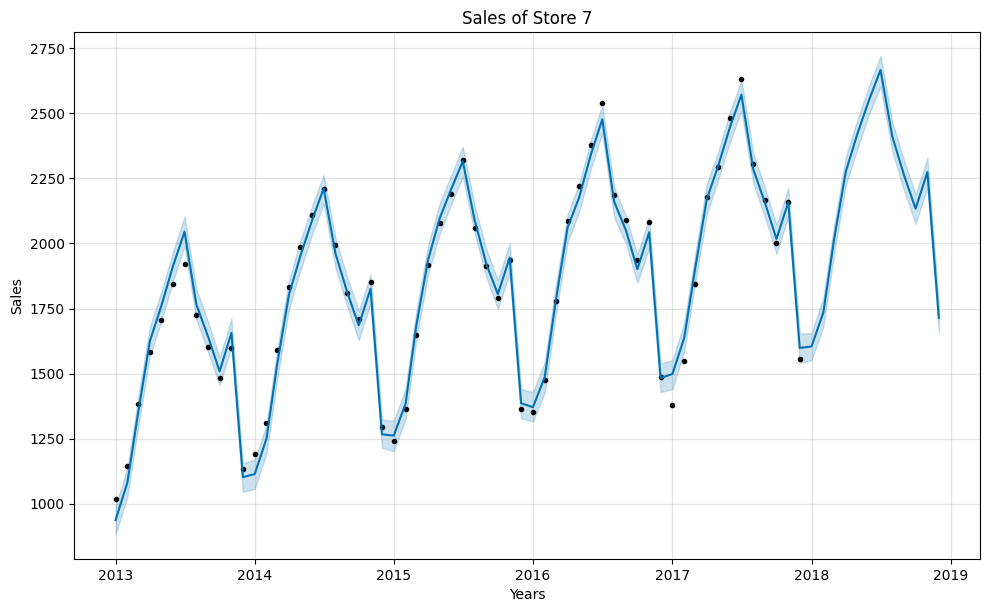

In [ ]:
mstore7_m.plot(forecast_store7_m);
plt.title('Sales of Store 7')
plt.xlabel('Years')
plt.ylabel('Sales')

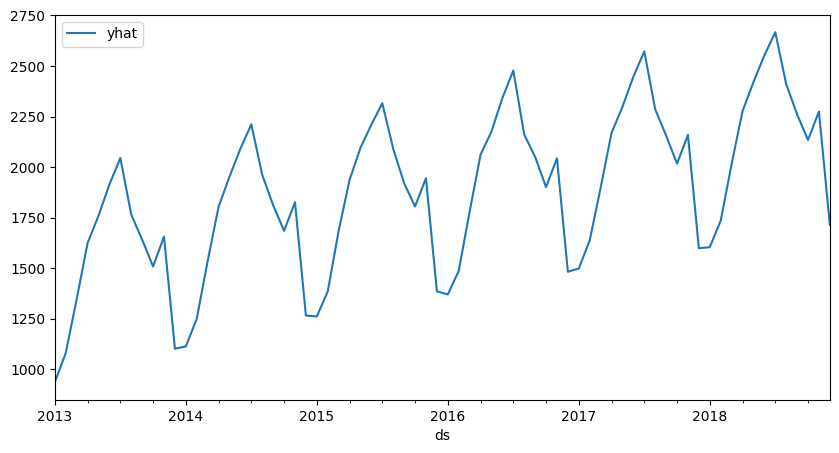

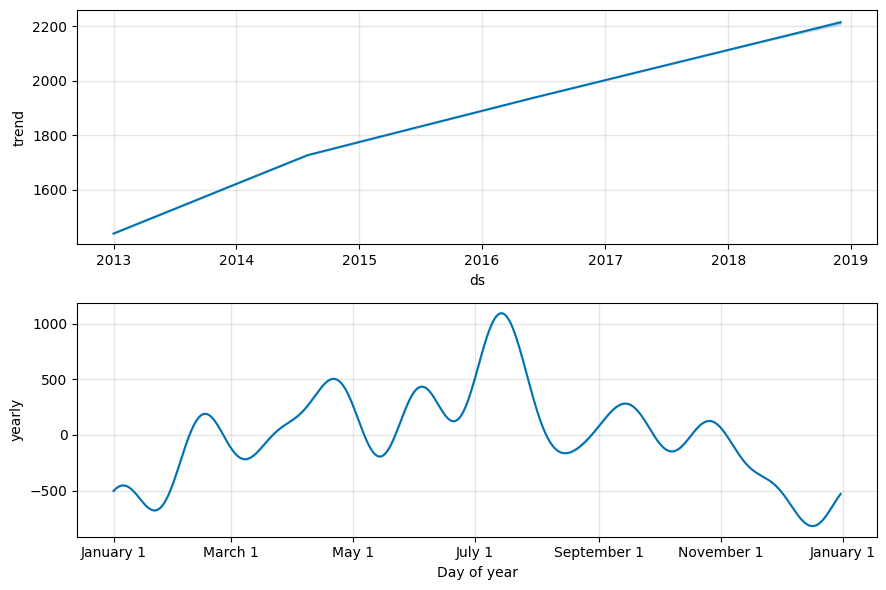

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
forecast_store7_m.plot(x='ds',y='yhat',figsize=(10,5))
mstore7_m.plot_components(forecast_store7_m);

Prophet Model for Store 8

In [ ]:
mstore8_df = mstore8
mstore8_df['ds'] = mstore8.index
mstore8_df.columns = ['y','ds']

In [ ]:
mstore8_m = Prophet().fit(mstore8_df)
future_store8_m = mstore8_m.make_future_dataframe(periods=12,freq='MS')

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/n2bm0plg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/ad5qwsk7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94487', 'data', 'file=/tmp/tmp52c3_vu2/n2bm0plg.json', 'init=/tmp/tmp52c3_vu2/ad5qwsk7.json', 'output', 'file=/tmp/tmp52c3_vu2/prophet_modelc4ia3qv0/prophet_model-20240101062615.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
06:26:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
forecast_store8_m = mstore8_m.predict(future_store8_m)
forecast_store8_m

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,2542.422605,1557.127109,1746.433391,2542.422605,2542.422605,-890.004079,-890.004079,-890.004079,-890.004079,-890.004079,-890.004079,0.0,0.0,0.0,1652.418526
1,2013-02-01,2569.770961,1806.936116,2008.878587,2569.770961,2569.770961,-656.613781,-656.613781,-656.613781,-656.613781,-656.613781,-656.613781,0.0,0.0,0.0,1913.157180
2,2013-03-01,2594.472702,2278.701767,2466.912036,2594.472702,2594.472702,-225.552316,-225.552316,-225.552316,-225.552316,-225.552316,-225.552316,0.0,0.0,0.0,2368.920386
3,2013-04-01,2621.821058,2759.320546,2951.758234,2621.821058,2621.821058,236.072926,236.072926,236.072926,236.072926,236.072926,236.072926,0.0,0.0,0.0,2857.893983
4,2013-05-01,2648.287208,3010.096917,3198.859900,2648.287208,2648.287208,458.316540,458.316540,458.316540,458.316540,458.316540,458.316540,0.0,0.0,0.0,3106.603749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2018-08-01,3844.334478,4167.042757,4360.184065,3838.602664,3850.570624,417.069654,417.069654,417.069654,417.069654,417.069654,417.069654,0.0,0.0,0.0,4261.404132
68,2018-09-01,3861.119012,3897.413926,4086.538118,3854.147748,3868.435790,129.148634,129.148634,129.148634,129.148634,129.148634,129.148634,0.0,0.0,0.0,3990.267646
69,2018-10-01,3877.362109,3658.307966,3859.721991,3869.087979,3885.869013,-113.245500,-113.245500,-113.245500,-113.245500,-113.245500,-113.245500,0.0,0.0,0.0,3764.116609
70,2018-11-01,3894.146643,3913.142243,4114.957788,3884.508413,3903.932410,118.705053,118.705053,118.705053,118.705053,118.705053,118.705053,0.0,0.0,0.0,4012.851696


In [ ]:
from sklearn.metrics import r2_score,mean_squared_error
from statsmodels.tools.eval_measures import rmse
metric_df8=forecast_store8_m.set_index('ds')[['yhat']].join(mstore8_df.set_index('ds').y).reset_index()
metric_df8.dropna(inplace=True)
prrs8=r2_score(metric_df8.y,metric_df8.yhat)
print('r2 Score',prrs8)
prms8=mean_squared_error(metric_df8.y,metric_df8.yhat)
print('mean squared error', prms8)
prrm8=rmse(metric_df8.y,metric_df8.yhat)
print('Root mean square error', prrm8)

r2 Score 0.9873727630569211
mean squared error 5721.268169497764
Root mean square error 75.63906510195484


Text(74.59722222222221, 0.5, 'Sales')

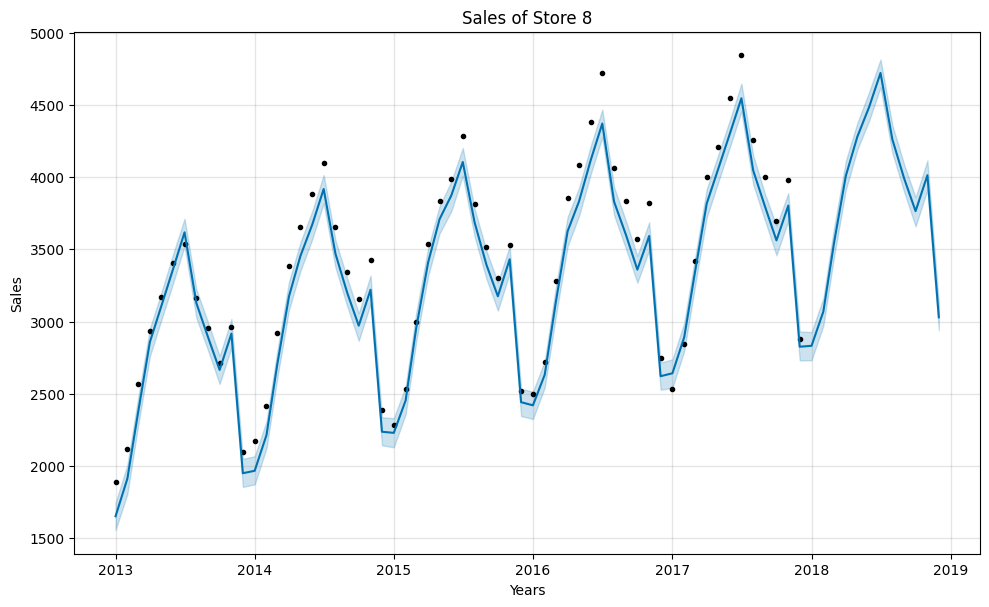

In [ ]:
mstore2_m.plot(forecast_store8_m);
plt.title('Sales of Store 8')
plt.xlabel('Years')
plt.ylabel('Sales')

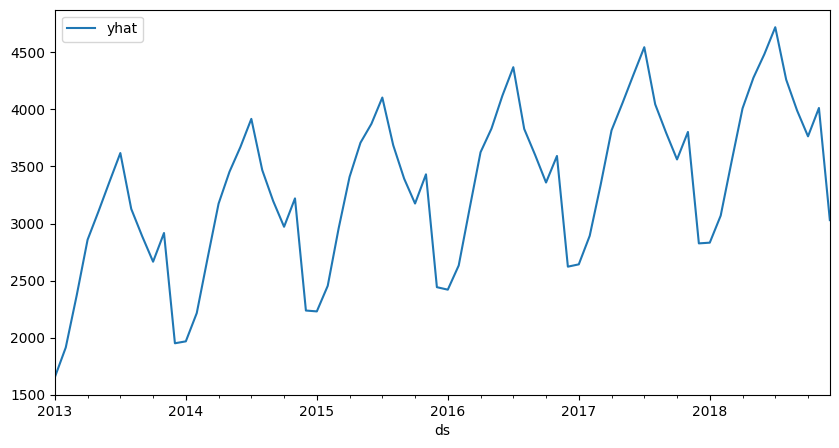

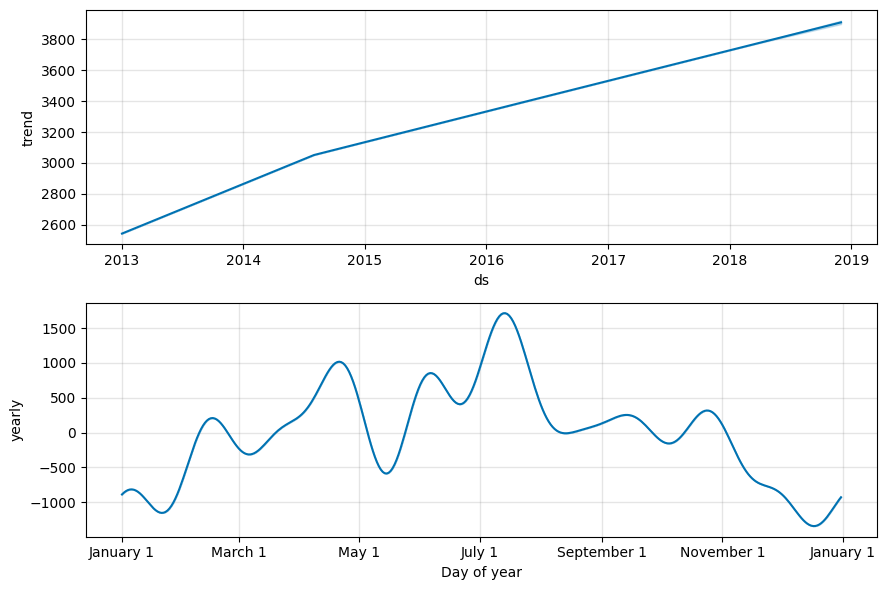

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
forecast_store8_m.plot(x='ds',y='yhat',figsize=(10,5))
mstore8_m.plot_components(forecast_store8_m);

Prophet Model for Store 9

In [ ]:
mstore9_df = mstore9
mstore9_df['ds'] = mstore9.index
mstore9_df.columns = ['y','ds']

In [ ]:
mstore9_m = Prophet().fit(mstore9_df)
future_store9_m = mstore9_m.make_future_dataframe(periods=12,freq='MS')

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/2bk9oxsf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/tkwkc5c_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7004', 'data', 'file=/tmp/tmp52c3_vu2/2bk9oxsf.json', 'init=/tmp/tmp52c3_vu2/tkwkc5c_.json', 'output', 'file=/tmp/tmp52c3_vu2/prophet_modelngvt4744/prophet_model-20240101062618.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
06:26:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
forecast_store9_m = mstore9_m.predict(future_store9_m)
forecast_store9_m

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,2174.881768,1336.287778,1506.073372,2174.881768,2174.881768,-751.802678,-751.802678,-751.802678,-751.802678,-751.802678,-751.802678,0.0,0.0,0.0,1423.079090
1,2013-02-01,2198.424175,1548.158877,1714.314837,2198.424175,2198.424175,-566.094458,-566.094458,-566.094458,-566.094458,-566.094458,-566.094458,0.0,0.0,0.0,1632.329717
2,2013-03-01,2219.688285,1951.483821,2114.474974,2219.688285,2219.688285,-193.801302,-193.801302,-193.801302,-193.801302,-193.801302,-193.801302,0.0,0.0,0.0,2025.886984
3,2013-04-01,2243.230692,2372.582996,2546.284544,2243.230692,2243.230692,214.195891,214.195891,214.195891,214.195891,214.195891,214.195891,0.0,0.0,0.0,2457.426584
4,2013-05-01,2266.013667,2579.864248,2747.179809,2266.013667,2266.013667,394.228257,394.228257,394.228257,394.228257,394.228257,394.228257,0.0,0.0,0.0,2660.241924
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2018-08-01,3290.076180,3564.197818,3729.146684,3284.626924,3294.693954,360.125836,360.125836,360.125836,360.125836,360.125836,360.125836,0.0,0.0,0.0,3650.202016
68,2018-09-01,3304.021133,3343.582060,3509.318942,3297.468072,3309.481579,125.188146,125.188146,125.188146,125.188146,125.188146,125.188146,0.0,0.0,0.0,3429.209278
69,2018-10-01,3317.516248,3134.457383,3301.644398,3309.787230,3323.866933,-100.298556,-100.298556,-100.298556,-100.298556,-100.298556,-100.298556,0.0,0.0,0.0,3217.217692
70,2018-11-01,3331.461200,3351.606960,3521.478373,3322.510230,3338.903294,105.479491,105.479491,105.479491,105.479491,105.479491,105.479491,0.0,0.0,0.0,3436.940691


In [ ]:
from sklearn.metrics import r2_score,mean_squared_error
from statsmodels.tools.eval_measures import rmse
metric_df9=forecast_store9_m.set_index('ds')[['yhat']].join(mstore9_df.set_index('ds').y).reset_index()
metric_df9.dropna(inplace=True)
prrs9=r2_score(metric_df9.y,metric_df9.yhat)
print('r2 Score',prrs9)
prms9=mean_squared_error(metric_df9.y,metric_df9.yhat)
print('mean squared error', prms9)
prrm9=rmse(metric_df9.y,metric_df9.yhat)
print('Root mean square error', prrm9)

r2 Score 0.9874341317789737
mean squared error 4225.780340043395
Root mean square error 65.00600233857944


Text(74.59722222222221, 0.5, 'Sales')

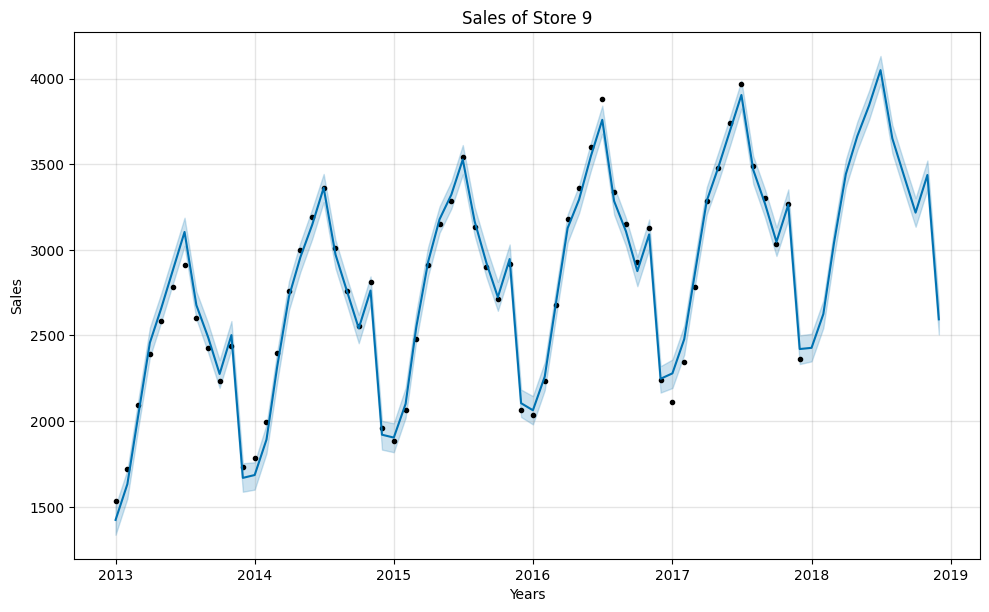

In [ ]:
mstore9_m.plot(forecast_store9_m);
plt.title('Sales of Store 9')
plt.xlabel('Years')
plt.ylabel('Sales')

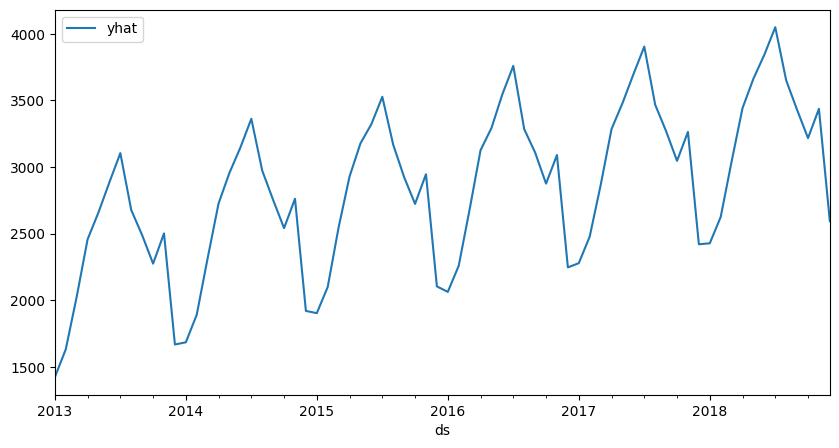

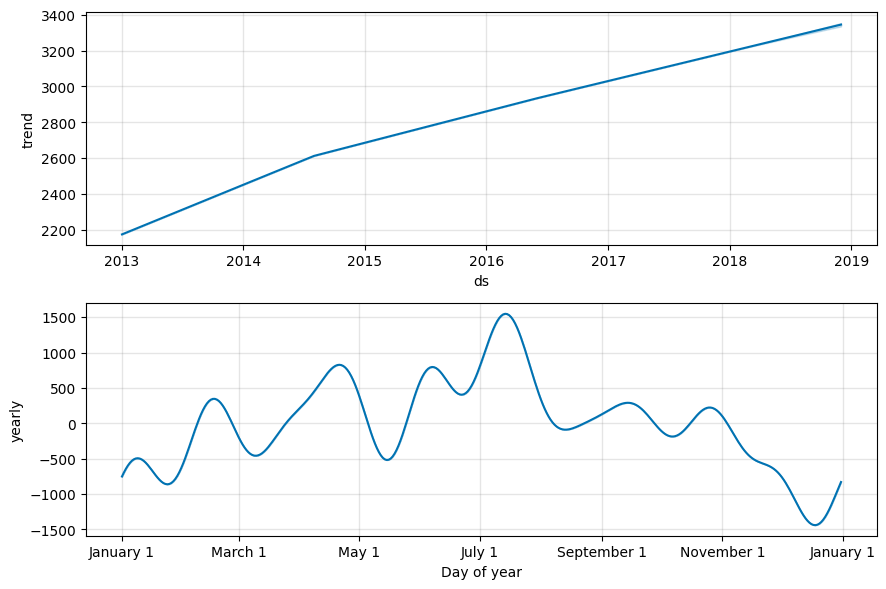

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
forecast_store9_m.plot(x='ds',y='yhat',figsize=(10,5))
mstore9_m.plot_components(forecast_store9_m);

Prophet Model for Store 10

In [ ]:
mstore10_df = mstore10
mstore10_df['ds'] = mstore10.index
mstore10_df.columns = ['y','ds']

In [ ]:
mstore10_m = Prophet().fit(mstore10_df)
future_store10_m = mstore10_m.make_future_dataframe(periods=12,freq='MS')

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/1qef4nx2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp52c3_vu2/mqu004h4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18029', 'data', 'file=/tmp/tmp52c3_vu2/1qef4nx2.json', 'init=/tmp/tmp52c3_vu2/mqu004h4.json', 'output', 'file=/tmp/tmp52c3_vu2/prophet_modelpldir9z7/prophet_model-20240101062621.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
06:26:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
forecast_store10_m = mstore10_m.predict(future_store10_m)
forecast_store10_m

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,2328.175146,1426.684675,1598.694997,2328.175146,2328.175146,-816.924449,-816.924449,-816.924449,-816.924449,-816.924449,-816.924449,0.0,0.0,0.0,1511.250698
1,2013-02-01,2353.492250,1653.588111,1834.544269,2353.492250,2353.492250,-613.118089,-613.118089,-613.118089,-613.118089,-613.118089,-613.118089,0.0,0.0,0.0,1740.374162
2,2013-03-01,2376.359312,2087.351827,2260.868079,2376.359312,2376.359312,-204.993817,-204.993817,-204.993817,-204.993817,-204.993817,-204.993817,0.0,0.0,0.0,2171.365495
3,2013-04-01,2401.676416,2538.604133,2719.038900,2401.676416,2401.676416,228.103416,228.103416,228.103416,228.103416,228.103416,228.103416,0.0,0.0,0.0,2629.779832
4,2013-05-01,2426.176840,2752.508180,2928.994035,2426.176840,2426.176840,416.846709,416.846709,416.846709,416.846709,416.846709,416.846709,0.0,0.0,0.0,2843.023549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2018-08-01,3501.484322,3794.585851,3975.152752,3495.419548,3507.030463,385.606136,385.606136,385.606136,385.606136,385.606136,385.606136,0.0,0.0,0.0,3887.090458
68,2018-09-01,3515.940326,3547.216832,3722.650999,3508.728823,3522.677216,118.607492,118.607492,118.607492,118.607492,118.607492,118.607492,0.0,0.0,0.0,3634.547818
69,2018-10-01,3529.930007,3336.194381,3515.044145,3521.476621,3537.903681,-100.127378,-100.127378,-100.127378,-100.127378,-100.127378,-100.127378,0.0,0.0,0.0,3429.802629
70,2018-11-01,3544.386011,3565.811445,3742.283421,3534.443082,3553.815082,102.817779,102.817779,102.817779,102.817779,102.817779,102.817779,0.0,0.0,0.0,3647.203791


In [ ]:
from sklearn.metrics import r2_score,mean_squared_error
from statsmodels.tools.eval_measures import rmse
metric_df10=forecast_store10_m.set_index('ds')[['yhat']].join(mstore10_df.set_index('ds').y).reset_index()
metric_df10.dropna(inplace=True)
prrs10=r2_score(metric_df10.y,metric_df10.yhat)
print('r2 Score',prrs10)
prms10=mean_squared_error(metric_df10.y,metric_df10.yhat)
print('mean squared error', prms10)
prrm10=rmse(metric_df10.y,metric_df10.yhat)
print('Root mean square error', prrm10)

r2 Score 0.987462574333127
mean squared error 4769.089835544711
Root mean square error 69.05859711538245


Text(74.59722222222221, 0.5, 'Sales')

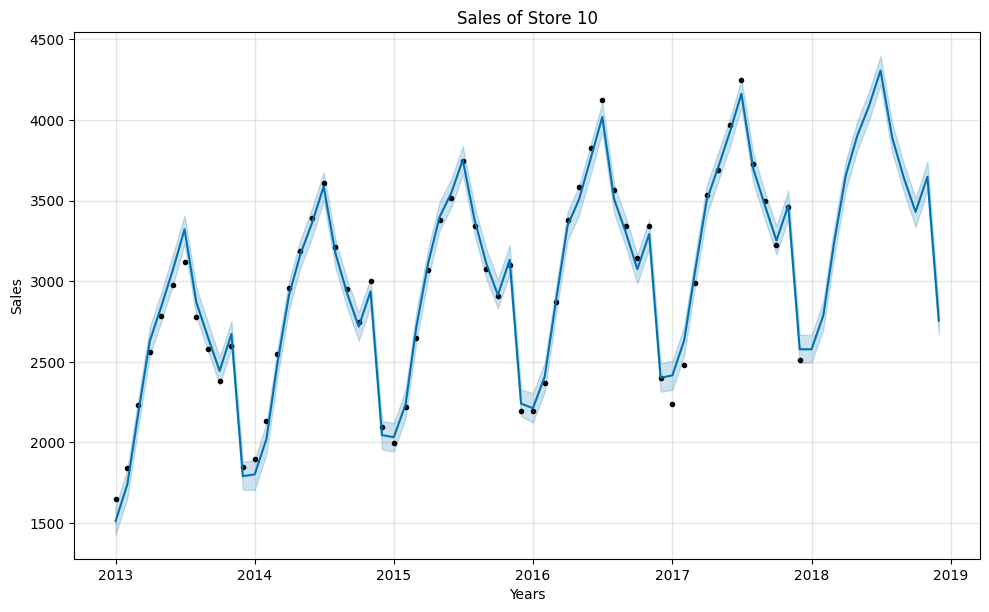

In [ ]:
mstore10_m.plot(forecast_store10_m);
plt.title('Sales of Store 10')
plt.xlabel('Years')
plt.ylabel('Sales')

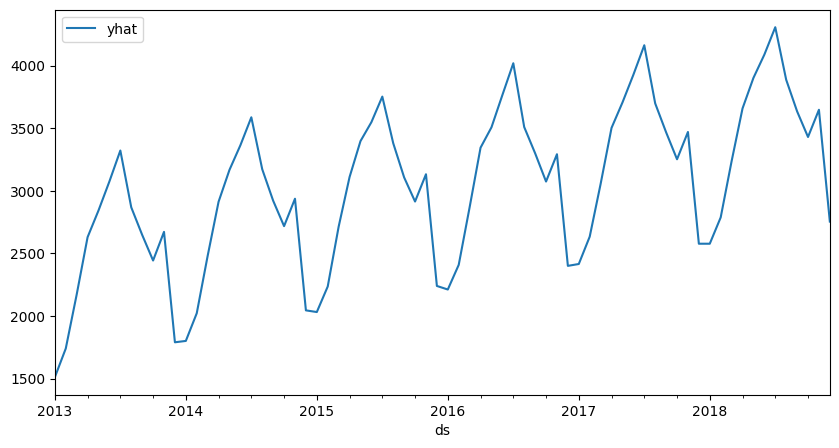

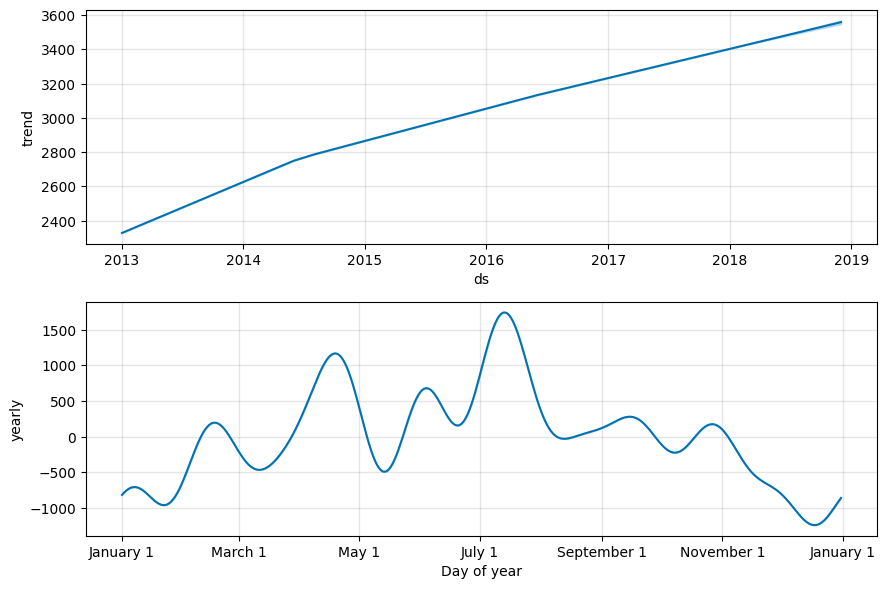

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
forecast_store10_m.plot(x='ds',y='yhat',figsize=(10,5))
mstore10_m.plot_components(forecast_store10_m);

In [ ]:
prophet_model = pd.DataFrame({
    'Model Name' : ['Store 1','Store 2','Store 3','Store 4','Store 5','Store 6','Store 7','Store 8','Store 9','Store 10' ],
    'R 2 Scores' : [prrs1,prrs2,prrs3,prrs4,prrs5,prrs6,prrs7,prrs8,prrs9,prrs10],
    'RMSE values' : [prrm1,prrm2,prrm3,prrm4,prrm5,prrm6,prrm7,prrm8,prrm9,prrm10],
    'MSE Vales' : [prms1,prms2,prms3,prms4,prms5,prms6,prms7,prms8,prms9,prms10]
})
prophet_model.set_index('Model Name')

,R 2 Scores,RMSE values,MSE Vales
Model Name,,,
Store 1,0.986708,57.334250,3287.216168
Store 2,0.986474,81.807481,6692.464015
Store 3,0.987135,70.975931,5037.582790
Store 4,0.987565,64.187341,4120.014694
Store 5,0.986805,48.122696,2315.793910
Store 6,0.986772,47.996776,2303.690521
Store 7,0.986984,43.609043,1901.748672
Store 8,0.987373,75.639065,5721.268169
Store 9,0.987434,65.006002,4225.780340


In [ ]:
hwes_models

,Model Name,RMSE values,Mean Squared Error,Mean Absolute Error(MAE)
0,Store 1,[69.72582341735277],4861.690451,58.986604
1,Store 2,[98.9412695887144],9789.374828,79.357905
2,Store 3,[82.42947286823008],6794.617997,70.320989
3,Store 4,[79.87363425539266],6379.797449,64.630149
4,Store 5,[59.175582784460374],3501.749598,48.134518
5,Store 6,[60.66336308520926],3680.043621,48.983587
6,Store 7,[55.87870054963226],3122.429175,44.719548
7,Store 8,[89.56643172807462],8022.145692,69.755806
8,Store 9,[72.90997559693722],5315.864542,64.950689
9,Store 10,[82.45532105174584],6798.879970,67.961415


In [ ]:
sarimax_model

,Model Name,MSE values,RMSE values,Mean Vales
0,Store 1,1229.762730,[35.06797299047697],2659.885305
1,Store 2,2192.895225,[46.82835919846785],3767.342921
2,Store 3,1958.092550,[44.25033954452312],3350.165559
3,Store 4,866.431842,[29.435214322353197],3085.820897
4,Store 5,892.176711,[29.86932726013139],2236.334901
5,Store 6,2963.688415,[54.43976869038252],2233.088671
6,Store 7,2006.538524,[44.79440281994596],2045.124296
7,Store 8,2175.008080,[46.63698189587747],3607.358916
8,Store 9,1480.178952,[38.473093874469875],3097.281746
9,Store 10,1450.902554,[38.09071479843933],3297.260183


#RMSE value comparision for 3 models

In [ ]:
all_models = pd.DataFrame({
    'Store Number' : ['Store 1','Store 2','Store 3','Store 4','Store 5','Store 6','Store 7','Store 8','Store 9','Store 10' ],
     'SARIMA Model' : [r1[0],r2[0],r3[0],r4[0],r5[0],r6[0],r7[0],r8[0],r9[0],r10[0]],
     'Prophet Model' : [prrm1,prrm2,prrm3,prrm4,prrm5,prrm6,prrm7,prrm8,prrm9,prrm10],
     'HWES Model' : [esrh1[0],esrh2[0],esrh3[0],esrh4[0],esrh5[0],esrh6[0],esrh7[0],esrh8[0],esrh9[0],esrh10[0]]})
all_models.set_index('Store Number')

,SARIMA Model,Prophet Model,HWES Model
Store Number,,,
Store 1,35.067973,57.334250,69.725823
Store 2,46.828359,81.807481,98.941270
Store 3,44.250340,70.975931,82.429473
Store 4,29.435214,64.187341,79.873634
Store 5,29.869327,48.122696,59.175583
Store 6,54.439769,47.996776,60.663363
Store 7,44.794403,43.609043,55.878701
Store 8,46.636982,75.639065,89.566432
Store 9,38.473094,65.006002,72.909976


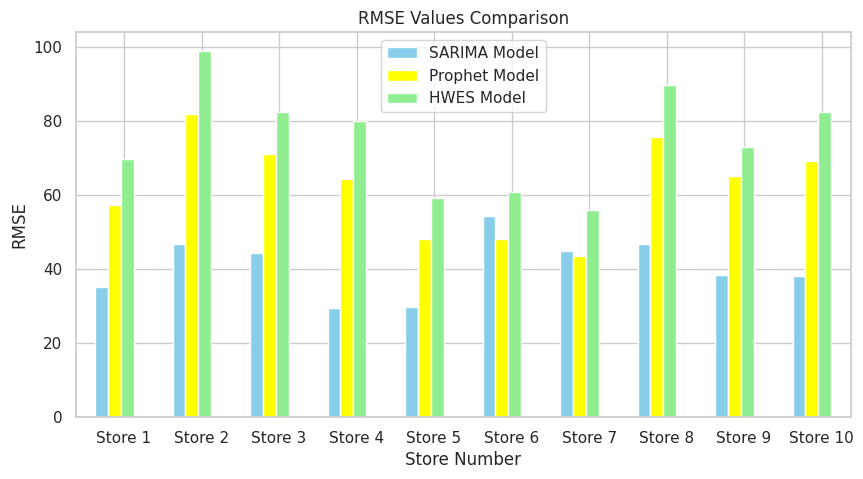

In [ ]:
n = 10
r = np.arange(10)
width = 0.25

colors = ['skyblue', 'yellow', 'lightgreen']  # Define three different colors

all_models.plot(kind="bar", figsize=(10, 5), color=colors)  # Use 'color' parameter to specify the colors
plt.xticks(r + width/2, ['Store 1', 'Store 2', 'Store 3', 'Store 4', 'Store 5', 'Store 6', 'Store 7', 'Store 8', 'Store 9', 'Store 10'], rotation=0)
plt.title("RMSE Values Comparison")
plt.xlabel("Store Number")
plt.ylabel("RMSE")
plt.show()

Here we can conclude that SARIMAX is best model for the demand forecasting pupose it has very low error value. Also HWES model is worst for forecasting as its Error value is high.

As a SARIMAX is best model for forecasting so now we will forecast values for next 1 year on all 10 stores dataset

Text(0.5, 1.0, 'store1 Monthly supplies sales and forecasted 1 year value')

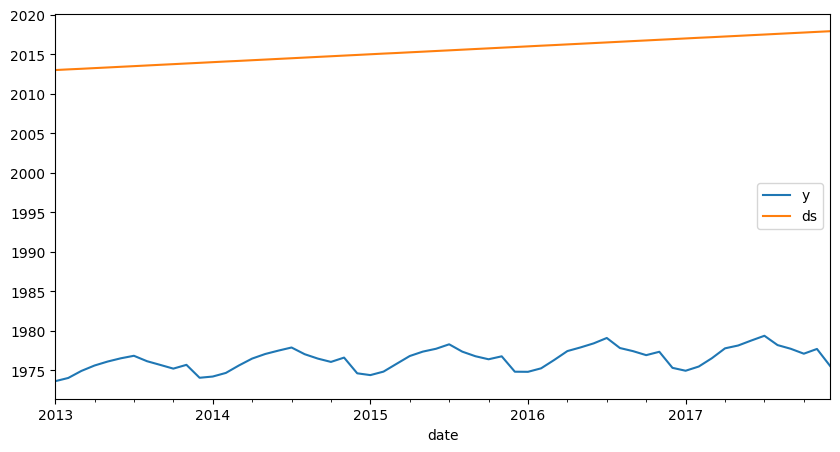

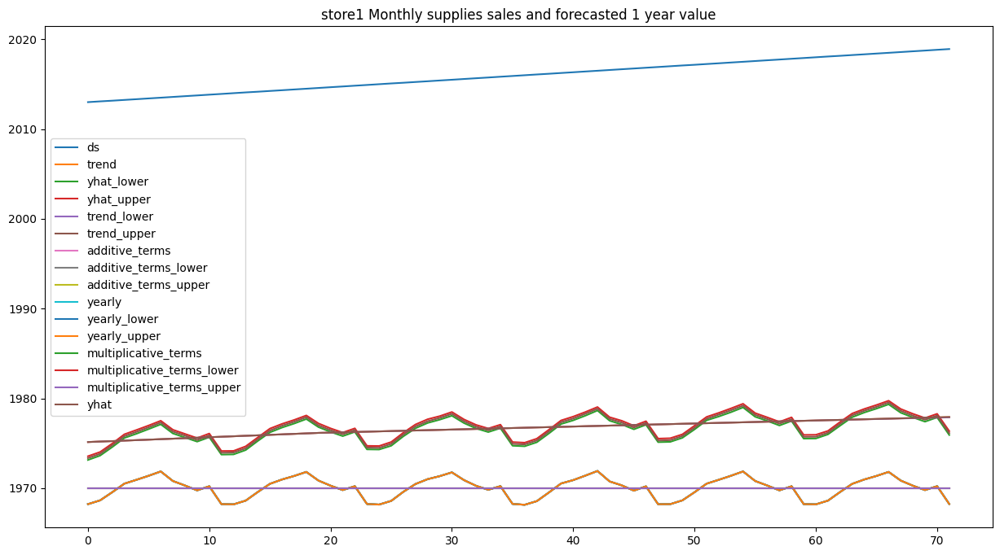

In [ ]:
mstore1.plot(legend=True,figsize=(10,5))
forecast_store1_m.plot(legend=True)
plt.title("store1 Monthly supplies sales and forecasted 1 year value")

Text(0.5, 1.0, 'store2 Monthly supplies sales and forecasted 1 year value')

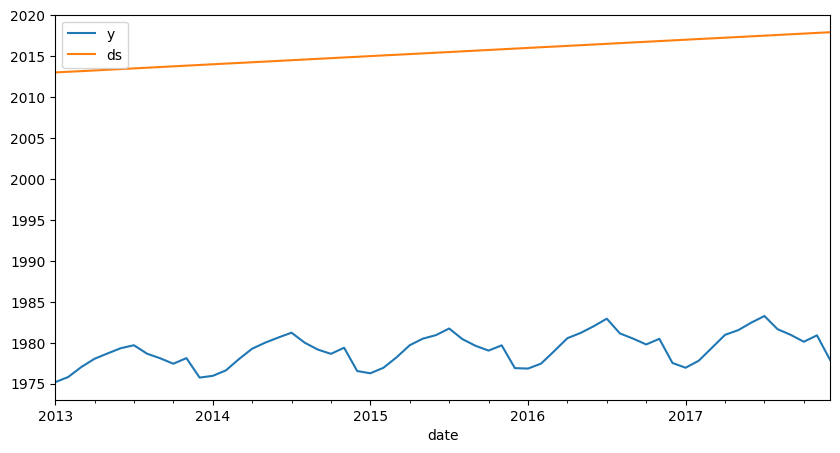

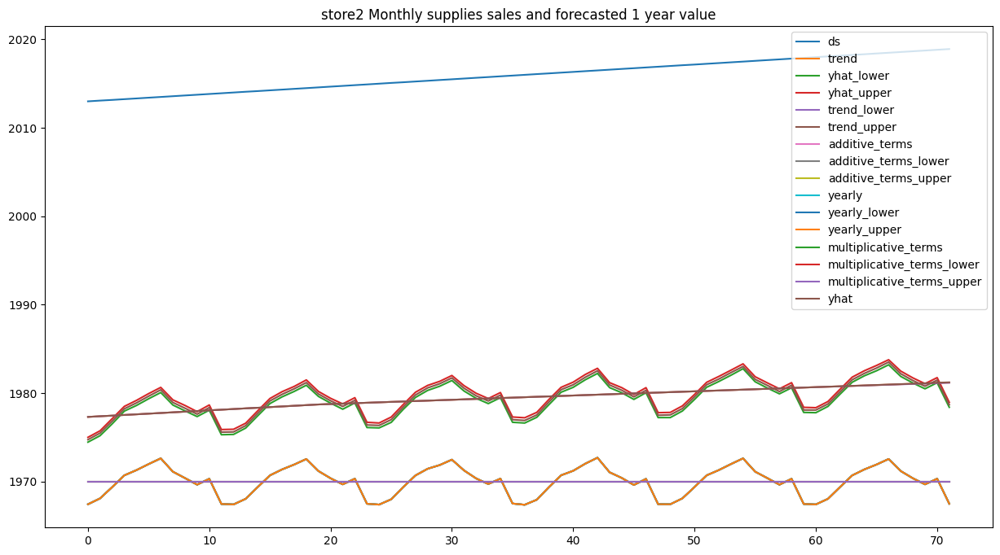

In [ ]:
mstore2.plot(legend=True,figsize=(10,5))
forecast_store2_m.plot(legend=True)
plt.title("store2 Monthly supplies sales and forecasted 1 year value")

Text(0.5, 1.0, 'store3 Monthly supplies sales and forecasted 1 year value')

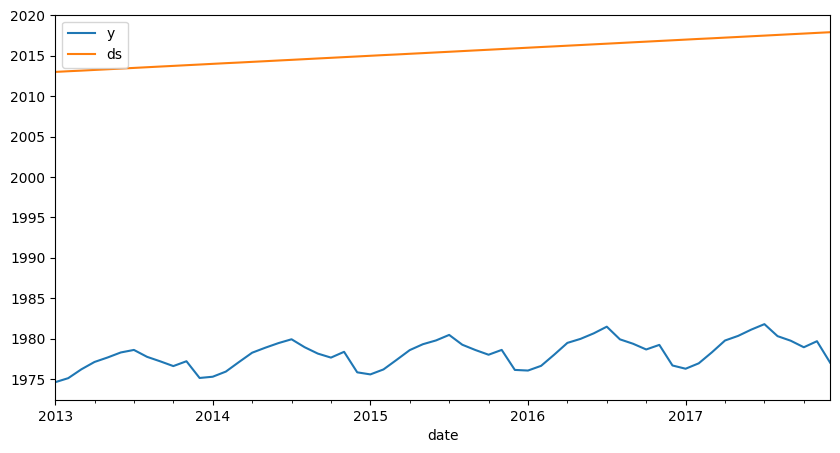

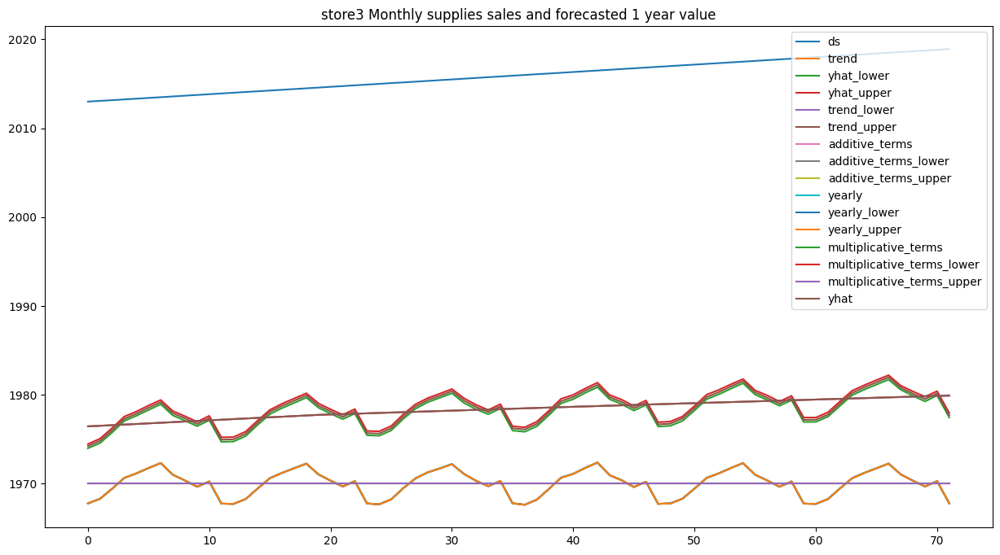

In [ ]:
mstore3.plot(legend=True,figsize=(10,5))
forecast_store3_m.plot(legend=True)
plt.title("store3 Monthly supplies sales and forecasted 1 year value")

Text(0.5, 1.0, 'store4 Monthly supplies sales and forecasted 1 year value')

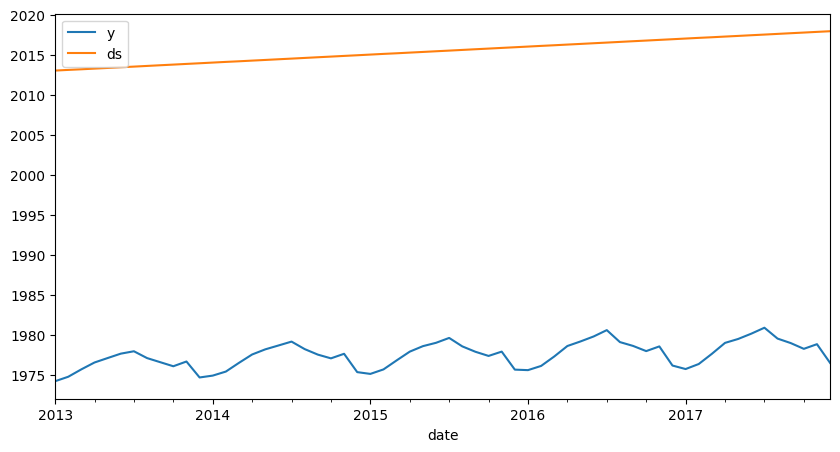

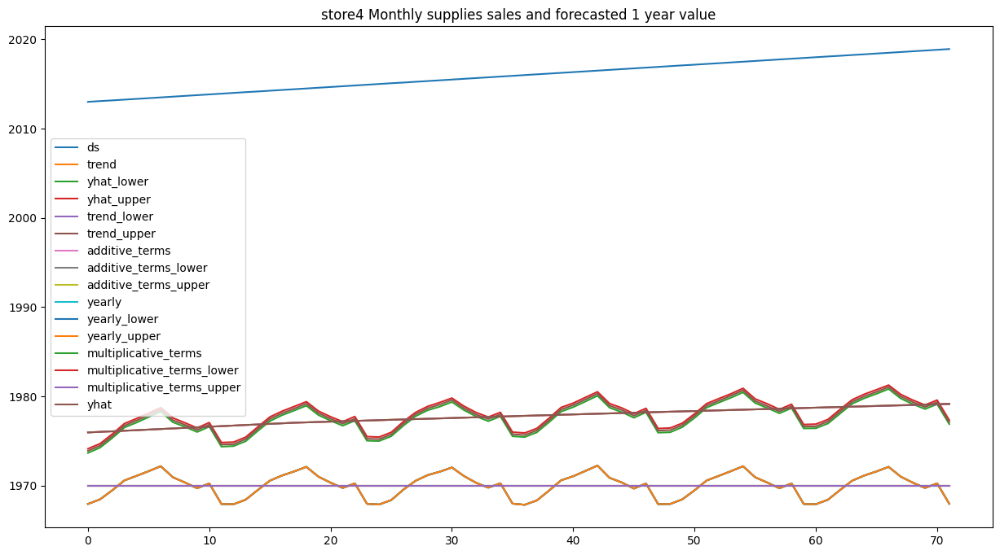

In [ ]:
mstore4.plot(legend=True,figsize=(10,5))
forecast_store4_m.plot(legend=True)
plt.title("store4 Monthly supplies sales and forecasted 1 year value")

Text(0.5, 1.0, 'store5 Monthly supplies sales and forecasted 1 year value')

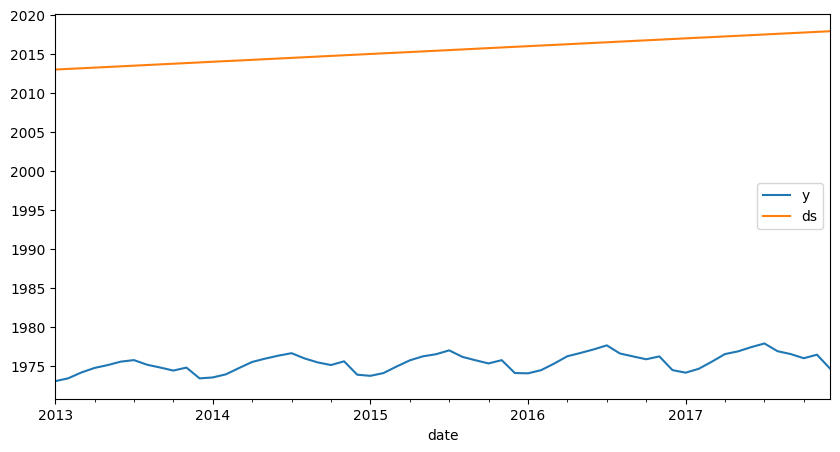

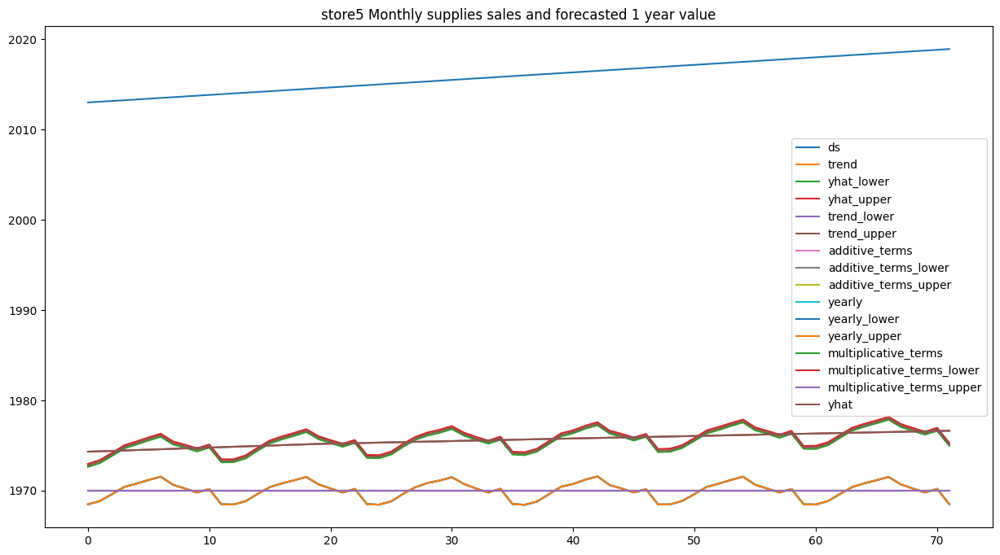

In [ ]:
mstore5.plot(legend=True,figsize=(10,5))
forecast_store5_m.plot(legend=True)
plt.title("store5 Monthly supplies sales and forecasted 1 year value")

Text(0.5, 1.0, 'store6 Monthly supplies sales and forecasted 1 year value')

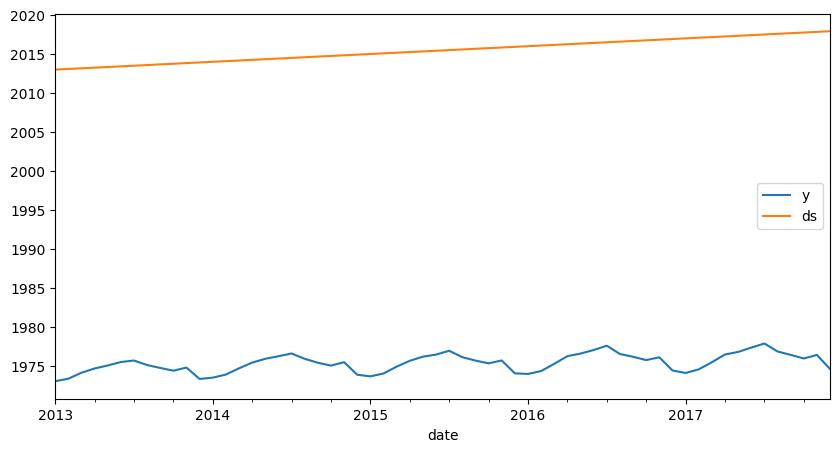

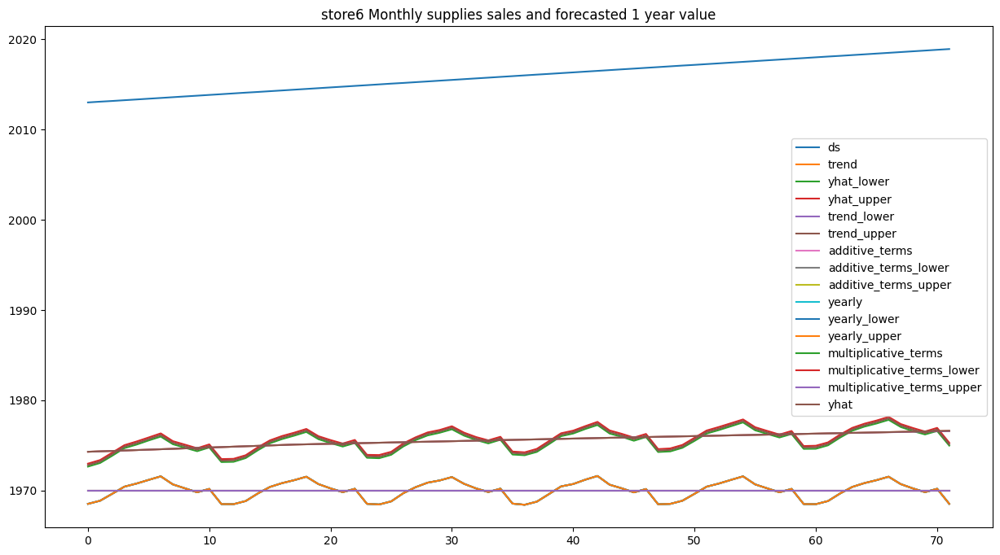

In [ ]:
mstore6.plot(legend=True,figsize=(10,5))
forecast_store6_m.plot(legend=True)
plt.title("store6 Monthly supplies sales and forecasted 1 year value")

Text(0.5, 1.0, 'store7 Monthly supplies sales and forecasted 1 year value')

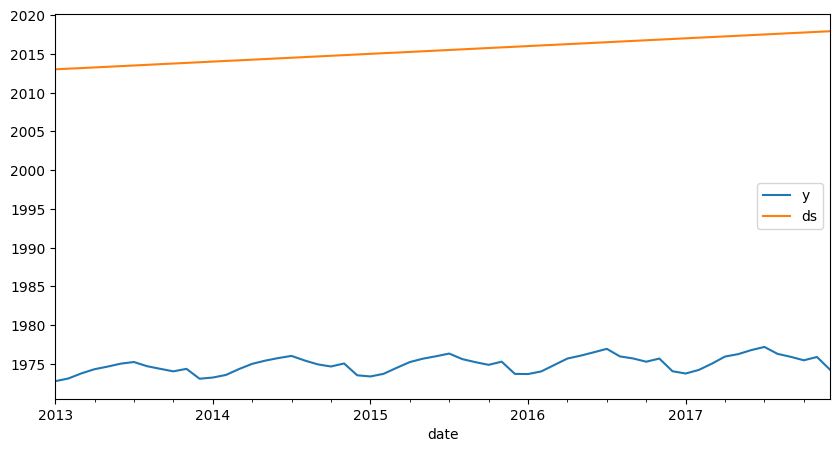

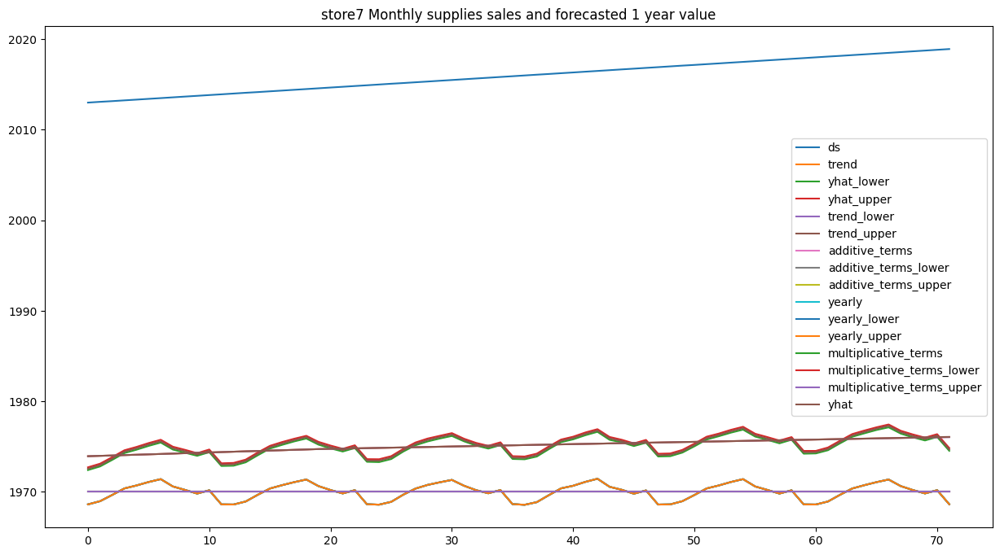

In [ ]:
mstore7.plot(legend=True,figsize=(10,5))
forecast_store7_m.plot(legend=True)
plt.title("store7 Monthly supplies sales and forecasted 1 year value")

Text(0.5, 1.0, 'store8 Monthly supplies sales and forecasted 1 year value')

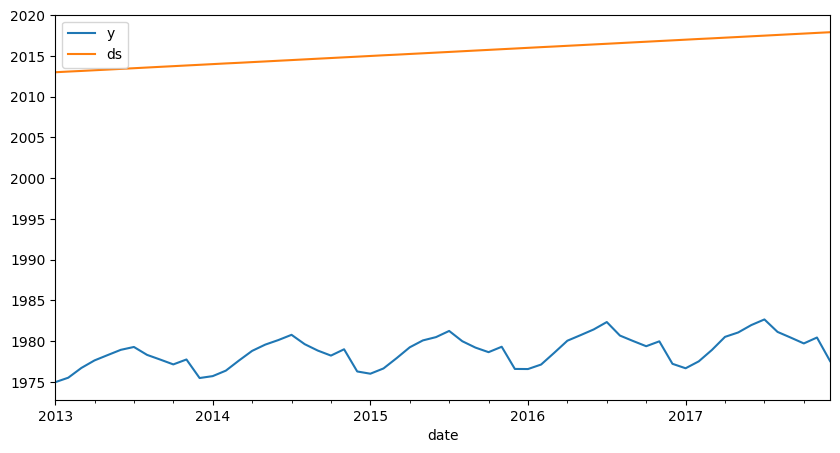

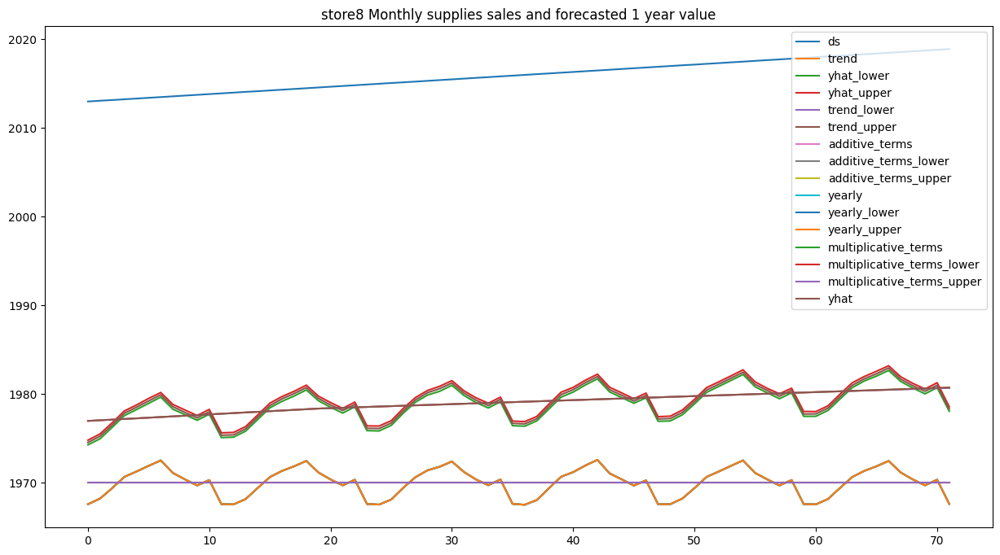

In [ ]:
mstore8.plot(legend=True,figsize=(10,5))
forecast_store8_m.plot(legend=True)
plt.title("store8 Monthly supplies sales and forecasted 1 year value")

Text(0.5, 1.0, 'store9 Monthly supplies sales and forecasted 1 year value')

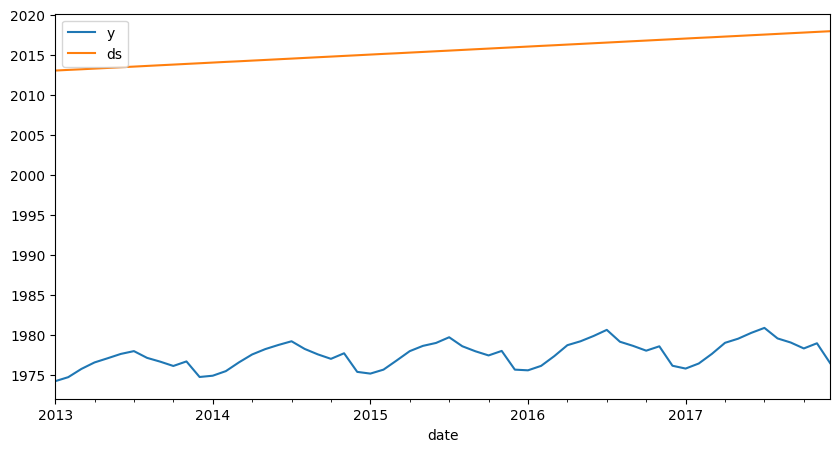

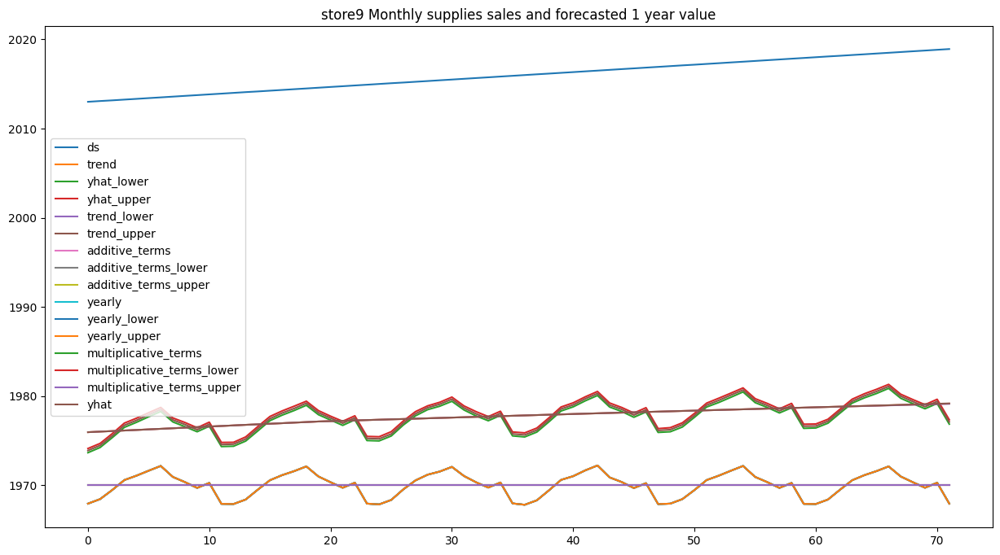

In [ ]:
mstore9.plot(legend=True,figsize=(10,5))
forecast_store9_m.plot(legend=True)
plt.title("store9 Monthly supplies sales and forecasted 1 year value")

Text(0.5, 1.0, 'store10 Monthly supplies sales and forecasted 1 year value')

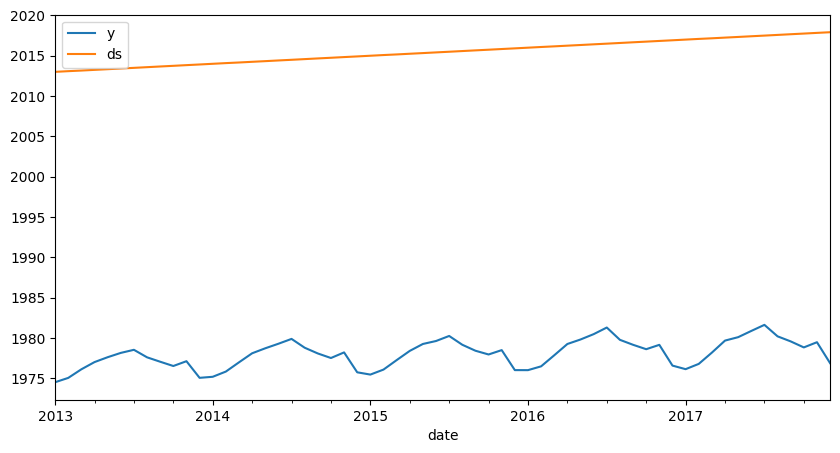

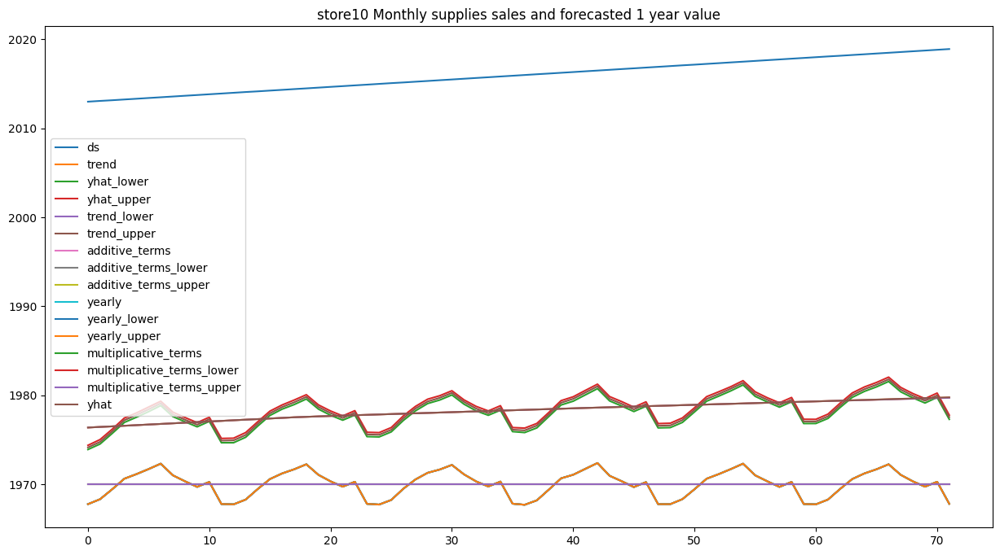

In [ ]:
mstore10.plot(legend=True,figsize=(10,5))
forecast_store10_m.plot(legend=True)
plt.title("store10 Monthly supplies sales and forecasted 1 year value")

So this is the all values for next 1 year on all 10 stores dataset

THANK YOU